# Walmart Case Study

### Problem Statement

The Management team at Walmart Inc. wants to analyze the customer purchase behavior (specifically, purchase amount) against the customer’s gender and the various other factors to help the business make better decisions. They want to understand if the spending habits differ between male and female customers: Do women spend more on Black Friday than men? And Also Analyzing spending Habits with respect to marital status and age groups using Central limit theorem amd Confidence interval Concepts

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
import math

In [2]:
data=pd.read_csv("walmart_data.csv")

In [3]:
data

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,7969
...,...,...,...,...,...,...,...,...,...,...
550063,1006033,P00372445,M,51-55,13,B,1,1,20,368
550064,1006035,P00375436,F,26-35,1,C,3,0,20,371
550065,1006036,P00375436,F,26-35,15,B,4+,1,20,137
550066,1006038,P00375436,F,55+,1,C,2,0,20,365


In [4]:
pd.set_option("display.max_rows",None)
pd.set_option("display.max_columns",None)

In [5]:
data.shape

(550068, 10)

In [6]:
data.columns

Index(['User_ID', 'Product_ID', 'Gender', 'Age', 'Occupation', 'City_Category',
       'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category',
       'Purchase'],
      dtype='object')

Top 10 features are:
1. User_ID
2. Product_ID
3. Gender
4. Age
5. Occupation
6. City_Category
7. Stay_In_Current_City_Years
8. Marital_Status
9. Product_Category
10. Purchase

In [7]:
data.dtypes

User_ID                        int64
Product_ID                    object
Gender                        object
Age                           object
Occupation                     int64
City_Category                 object
Stay_In_Current_City_Years    object
Marital_Status                 int64
Product_Category               int64
Purchase                       int64
dtype: object

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype 
---  ------                      --------------   ----- 
 0   User_ID                     550068 non-null  int64 
 1   Product_ID                  550068 non-null  object
 2   Gender                      550068 non-null  object
 3   Age                         550068 non-null  object
 4   Occupation                  550068 non-null  int64 
 5   City_Category               550068 non-null  object
 6   Stay_In_Current_City_Years  550068 non-null  object
 7   Marital_Status              550068 non-null  int64 
 8   Product_Category            550068 non-null  int64 
 9   Purchase                    550068 non-null  int64 
dtypes: int64(5), object(5)
memory usage: 42.0+ MB


In [9]:
data.nunique()

User_ID                        5891
Product_ID                     3631
Gender                            2
Age                               7
Occupation                       21
City_Category                     3
Stay_In_Current_City_Years        5
Marital_Status                    2
Product_Category                 20
Purchase                      18105
dtype: int64

1. From the above data we can say that there are total 5891 unique users.
2. 3631 Number of unique products. Gender, age, City_Category, Staty_In_current_City_Years, Marital_Status can be converted into category data type.
3. For Occupation and Product_Category there are total 21 and 20 unique values respectively.

In [10]:
data.isna().sum()

User_ID                       0
Product_ID                    0
Gender                        0
Age                           0
Occupation                    0
City_Category                 0
Stay_In_Current_City_Years    0
Marital_Status                0
Product_Category              0
Purchase                      0
dtype: int64

There are no null values in the given dataset

In [11]:
data.duplicated().sum()

0

In [12]:
categoricalCols=['Gender', 'Age', 'City_Category', 'Stay_In_Current_City_Years', 'Marital_Status', 'Product_Category']
for x in categoricalCols:
    data[x]=data[x].astype("category")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 550068 entries, 0 to 550067
Data columns (total 10 columns):
 #   Column                      Non-Null Count   Dtype   
---  ------                      --------------   -----   
 0   User_ID                     550068 non-null  int64   
 1   Product_ID                  550068 non-null  object  
 2   Gender                      550068 non-null  category
 3   Age                         550068 non-null  category
 4   Occupation                  550068 non-null  int64   
 5   City_Category               550068 non-null  category
 6   Stay_In_Current_City_Years  550068 non-null  category
 7   Marital_Status              550068 non-null  category
 8   Product_Category            550068 non-null  category
 9   Purchase                    550068 non-null  int64   
dtypes: category(6), int64(3), object(1)
memory usage: 19.9+ MB


In [13]:
data.describe(include="all")

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
count,5.500680e+05,550068,550068,550068,550068.000000,550068,550068,550068.0,550068.0,550068.000000
unique,NaN,3631,2,7,NaN,3,5,2.0,20.0,NaN
top,NaN,P00265242,M,26-35,NaN,B,1,0.0,5.0,NaN
freq,NaN,1880,414259,219587,NaN,231173,193821,324731.0,150933.0,NaN
mean,1.003029e+06,NaN,NaN,NaN,8.076707,NaN,NaN,NaN,NaN,9263.968713
std,1.727592e+03,NaN,NaN,NaN,6.522660,NaN,NaN,NaN,NaN,5023.065394
min,1.000001e+06,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,12.000000
25%,1.001516e+06,NaN,NaN,NaN,2.000000,NaN,NaN,NaN,NaN,5823.000000
50%,1.003077e+06,NaN,NaN,NaN,7.000000,NaN,NaN,NaN,NaN,8047.000000
75%,1.004478e+06,NaN,NaN,NaN,14.000000,NaN,NaN,NaN,NaN,12054.000000


From the above records we can't make any comment on Gender, Age, Occupation, City_Category, Stay_In_Current_City_Years, Marital_Status as all these data depends on User_ID which is repeating. User_ID and Product_ID together forms Unique record.

Though we can comment on Product Category and Purchase.

1. There are 20 Unique Product Categories, and Category 5 is the most selling category for the given sample
2. For the given sample 9264 is average Purchase. 

In [14]:
for x in data.columns:
    if data[x].dtype.name == "category":
        print(x, "----", data[x].unique())

Gender ---- ['F', 'M']
Categories (2, object): ['F', 'M']
Age ---- ['0-17', '55+', '26-35', '46-50', '51-55', '36-45', '18-25']
Categories (7, object): ['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+']
City_Category ---- ['A', 'C', 'B']
Categories (3, object): ['A', 'B', 'C']
Stay_In_Current_City_Years ---- ['2', '4+', '3', '1', '0']
Categories (5, object): ['0', '1', '2', '3', '4+']
Marital_Status ---- [0, 1]
Categories (2, int64): [0, 1]
Product_Category ---- [3, 1, 12, 8, 5, ..., 10, 17, 9, 20, 19]
Length: 20
Categories (20, int64): [1, 2, 3, 4, ..., 17, 18, 19, 20]


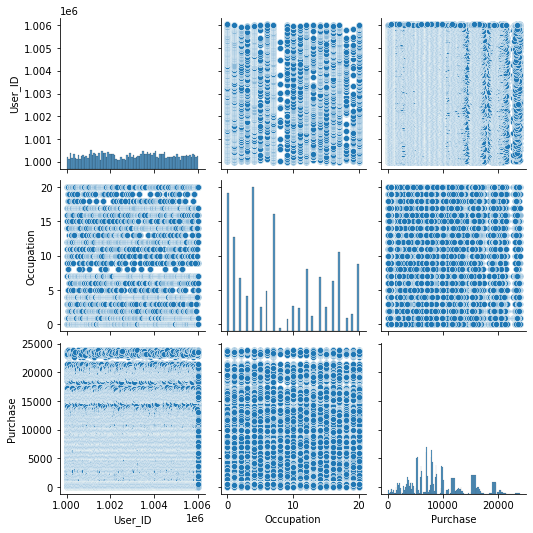

In [15]:
sns.pairplot(data)

# Customer Analysis 

### Based on Gender 

In [16]:
Gender=data.drop_duplicates(subset = 'User_ID', keep='first')
Gender

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,8370
4,1000002,P00285442,M,55+,16,C,4+,0,8,7969
5,1000003,P00193542,M,26-35,15,A,3,0,1,15227
6,1000004,P00184942,M,46-50,7,B,2,1,1,19215
9,1000005,P00274942,M,26-35,20,A,1,1,8,7871
14,1000006,P00231342,F,51-55,9,A,1,0,5,5378
18,1000007,P00036842,M,36-45,1,B,1,1,1,11788
19,1000008,P00249542,M,26-35,12,C,4+,1,1,19614
25,1000009,P00135742,M,26-35,17,C,0,0,6,16662
29,1000010,P00085942,F,36-45,1,B,4+,1,2,16352


In [17]:
values=Gender['Gender'].value_counts()
print('\033[1m' + "Value counts for Gender:" + '\033[0m')
print(values)
print("---------------------------------------------------------------")
normalized=Gender['Gender'].value_counts(normalize=True).round(2)
print('\033[1m' + "Normalized counts for Gender:" + '\033[0m')
print(normalized)

Value counts for Gender:
M    4225
F    1666
Name: Gender, dtype: int64
---------------------------------------------------------------
Normalized counts for Gender:
M    0.72
F    0.28
Name: Gender, dtype: float64


### Based on  Age Group

In [18]:
Gender['Age'].unique()

['0-17', '55+', '26-35', '46-50', '51-55', '36-45', '18-25']
Categories (7, object): ['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+']

In [19]:
Gender['Age'].describe()

count      5891
unique        7
top       26-35
freq       2053
Name: Age, dtype: object

In [20]:
values = Gender['Age'].value_counts()
normalized = Gender['Age'].value_counts(normalize= True).round(2)
print('\033[1m' + "Value counts for Age:" + '\033[0m')
print(values)
print('\033[1m' + "----------------------------------------------------------------"+ '\033[0m')
print('\033[1m' +"Normalized counts for Age:" + '\033[0m')
print(normalized)

Value counts for Age:
26-35    2053
36-45    1167
18-25    1069
46-50     531
51-55     481
55+       372
0-17      218
Name: Age, dtype: int64
----------------------------------------------------------------
Normalized counts for Age:
26-35    0.35
36-45    0.20
18-25    0.18
46-50    0.09
51-55    0.08
55+      0.06
0-17     0.04
Name: Age, dtype: float64


### Based on City Category

In [21]:
Gender['City_Category'].unique()

['A', 'C', 'B']
Categories (3, object): ['A', 'B', 'C']

In [22]:
Gender['City_Category'].describe()

count     5891
unique       3
top          C
freq      3139
Name: City_Category, dtype: object

In [23]:
values=Gender['City_Category'].value_counts()
normalized=Gender['City_Category'].value_counts(normalize=True).round(2)
print('\033[1m' + "Value counts for City Category:" + '\033[0m')
print(values)
print('\033[1m' + "------------------------------------------------------------"+ '\033[0m')
print('\033[1m' +"Normalized counts for City Category:" + '\033[0m')
print(normalized)

Value counts for City Category:
C    3139
B    1707
A    1045
Name: City_Category, dtype: int64
------------------------------------------------------------
Normalized counts for City Category:
C    0.53
B    0.29
A    0.18
Name: City_Category, dtype: float64


### Based on Stay in current City

In [24]:
Gender['Stay_In_Current_City_Years'].unique()

['2', '4+', '3', '1', '0']
Categories (5, object): ['0', '1', '2', '3', '4+']

In [25]:
Gender['Stay_In_Current_City_Years'].value_counts()

1     2086
2     1145
3      979
4+     909
0      772
Name: Stay_In_Current_City_Years, dtype: int64

In [26]:
values = Gender['Stay_In_Current_City_Years'].value_counts()
normalized = Gender['Stay_In_Current_City_Years'].value_counts(normalize= True).round(2)
print('\033[1m' + "Value counts for Stay In Current City Years:" + '\033[0m')
print(values)
print('\033[1m' + "------------------------------------------------------------------"+ '\033[0m')
print('\033[1m' +"Normalized counts for Stay In Current City Years:" + '\033[0m')
print(normalized)

Value counts for Stay In Current City Years:
1     2086
2     1145
3      979
4+     909
0      772
Name: Stay_In_Current_City_Years, dtype: int64
------------------------------------------------------------------
Normalized counts for Stay In Current City Years:
1     0.35
2     0.19
3     0.17
4+    0.15
0     0.13
Name: Stay_In_Current_City_Years, dtype: float64


### Based on Marital Status

In [27]:
Gender['Marital_Status'].unique()

[0, 1]
Categories (2, int64): [0, 1]

In [28]:
Gender['Marital_Status'].describe()

count     5891
unique       2
top          0
freq      3417
Name: Marital_Status, dtype: int64

In [29]:
values = Gender['Marital_Status'].value_counts()
normalized = Gender['Marital_Status'].value_counts(normalize= True).round(2)
print('\033[1m' + "Value counts for Marital Status:" + '\033[0m')
print(values)
print('\033[1m' + "--------------------------------------------------------------"+ '\033[0m')
print('\033[1m' +"Normalized counts for Marital Status:" + '\033[0m')
print(normalized)

Value counts for Marital Status:
0    3417
1    2474
Name: Marital_Status, dtype: int64
--------------------------------------------------------------
Normalized counts for Marital Status:
0    0.58
1    0.42
Name: Marital_Status, dtype: float64


### Based on Occupation

In [30]:
Gender['Occupation'].unique()

array([10, 16, 15,  7, 20,  9,  1, 12, 17,  0,  3,  4, 11,  8, 19,  2, 18,
        5, 14, 13,  6], dtype=int64)

In [31]:
Gender['Occupation'].describe()

count    5891.000000
mean        8.153285
std         6.323140
min         0.000000
25%         3.000000
50%         7.000000
75%        14.000000
max        20.000000
Name: Occupation, dtype: float64

In [32]:
values = Gender['Occupation'].value_counts()
normalized = Gender['Occupation'].value_counts(normalize= True).round(2)
print('\033[1m' + "Value counts for Occupation:" + '\033[0m')
print(values)
print('\033[1m' + "----------------------------------------------------------"+ '\033[0m')
print('\033[1m' +"Normalized counts for Occupation:" + '\033[0m')
print(normalized)

Value counts for Occupation:
4     740
0     688
7     669
1     517
17    491
12    376
14    294
20    273
2     256
16    235
6     228
10    192
3     170
15    140
13    140
11    128
5     111
9      88
19     71
18     67
8      17
Name: Occupation, dtype: int64
----------------------------------------------------------
Normalized counts for Occupation:
4     0.13
0     0.12
7     0.11
1     0.09
17    0.08
12    0.06
14    0.05
20    0.05
2     0.04
16    0.04
6     0.04
10    0.03
3     0.03
15    0.02
13    0.02
11    0.02
5     0.02
9     0.01
19    0.01
18    0.01
8     0.00
Name: Occupation, dtype: float64


In [33]:
Gender['Occupation'].describe()

count    5891.000000
mean        8.153285
std         6.323140
min         0.000000
25%         3.000000
50%         7.000000
75%        14.000000
max        20.000000
Name: Occupation, dtype: float64

### Analysis Based on Product Category

In [34]:
Gender['Product_Category'].unique()

[3, 8, 1, 5, 6, ..., 10, 7, 14, 9, 17]
Length: 18
Categories (20, int64): [1, 2, 3, 4, ..., 17, 18, 19, 20]

In [35]:
Gender['Product_Category'].describe()

count     5891
unique      18
top          1
freq      1568
Name: Product_Category, dtype: int64

In [36]:
values = Gender['Product_Category'].value_counts()
normalized = Gender['Product_Category'].value_counts(normalize= True).round(2)
print('\033[1m' + "Value counts for Product Category:" + '\033[0m')
print(values)
print('\033[1m' + "--------------------------------------------------------------------------------------------------------------------------"+ '\033[0m')
print('\033[1m' +"Normalized counts for Product Category:" + '\033[0m')
print(normalized)

Value counts for Product Category:
1     1568
5     1560
8     1335
6      232
11     223
2      209
3      204
4      125
16     120
10      80
15      73
13      47
12      37
7       36
18      23
14      14
9        3
17       2
19       0
20       0
Name: Product_Category, dtype: int64
--------------------------------------------------------------------------------------------------------------------------
Normalized counts for Product Category:
1     0.27
5     0.26
8     0.23
6     0.04
11    0.04
2     0.04
3     0.03
4     0.02
16    0.02
10    0.01
15    0.01
13    0.01
12    0.01
7     0.01
18    0.00
14    0.00
9     0.00
17    0.00
19    0.00
20    0.00
Name: Product_Category, dtype: float64


In [37]:
Gender['Product_Category'].describe()

count     5891
unique      18
top          1
freq      1568
Name: Product_Category, dtype: int64

### Graphical Analysis

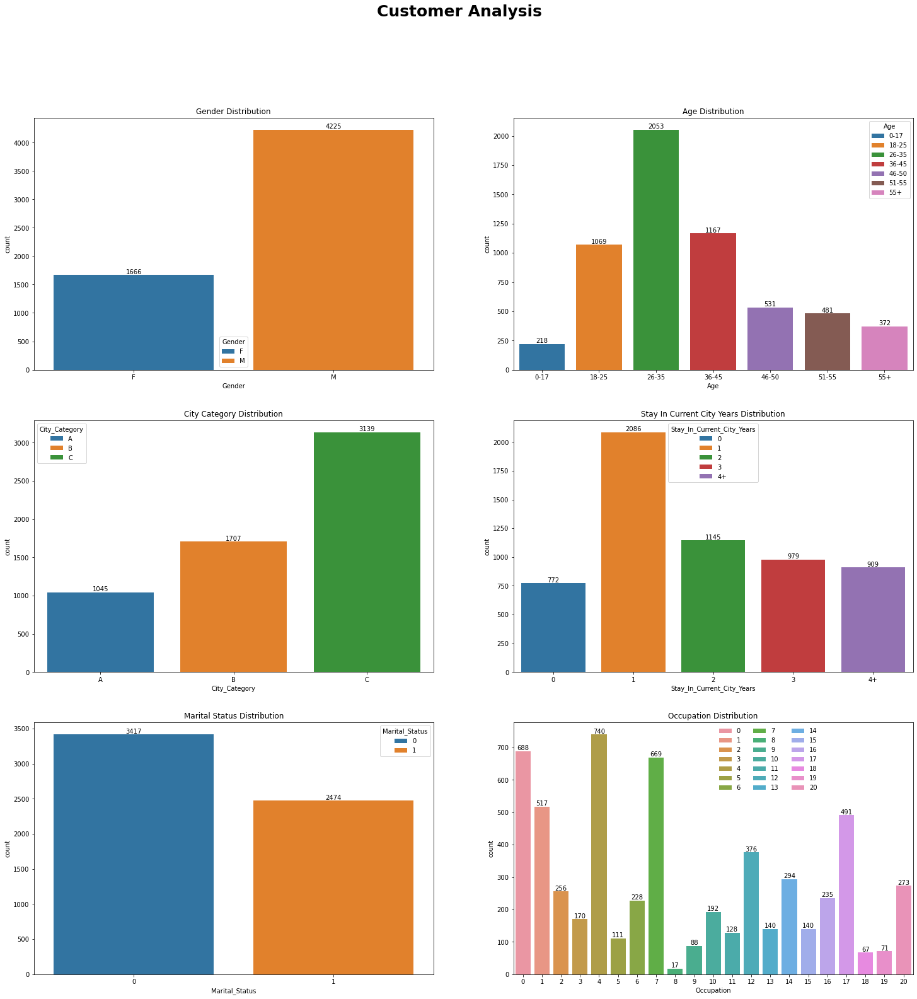

In [38]:
fig, axs=plt.subplots(3,2,figsize=(25,25),sharey=False)
fig.suptitle("Customer Analysis", fontsize=25, fontweight='bold')
graph=sns.countplot(x='Gender', hue='Gender', data=Gender, dodge=False, ax=axs[0,0])
for i in graph.containers:
    graph.bar_label(i,)
graph.set_title("Gender Distribution", fontsize=12)
graph2=sns.countplot(x='Age', hue='Age', data = Gender, dodge=False, ax=axs[0,1])
for i in graph2.containers:
    graph2.bar_label(i,)
graph2.set_title("Age Distribution", fontsize = 12)
graph3 = sns.countplot(x = 'City_Category', hue = 'City_Category' ,data = Gender , dodge=False, ax = axs[1, 0])
for i in graph3.containers:
    graph3.bar_label(i,)
graph3.set_title("City Category Distribution", fontsize = 12)
graph4 = sns.countplot(x = 'Stay_In_Current_City_Years', hue= 'Stay_In_Current_City_Years', data= Gender, dodge = False , ax = axs[1, 1])
for i in graph4.containers:
    graph4.bar_label(i,)
graph4.set_title("Stay In Current City Years Distribution", fontsize = 12)
graph5 = sns.countplot(x = 'Marital_Status', hue = 'Marital_Status', data = Gender , dodge=False, ax = axs[2, 0])
for i in graph5.containers:
    graph5.bar_label(i,)
graph5.set_title("Marital Status Distribution", fontsize = 12)
graph6 = sns.countplot(x = 'Occupation', hue = 'Occupation' ,data = Gender , dodge=False, ax = axs[2, 1])
sns.move_legend(graph6, "upper left", bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False)
for i in graph6.containers:
    graph6.bar_label(i,)
graph6.set_title("Occupation Distribution", fontsize = 12)
plt.show()


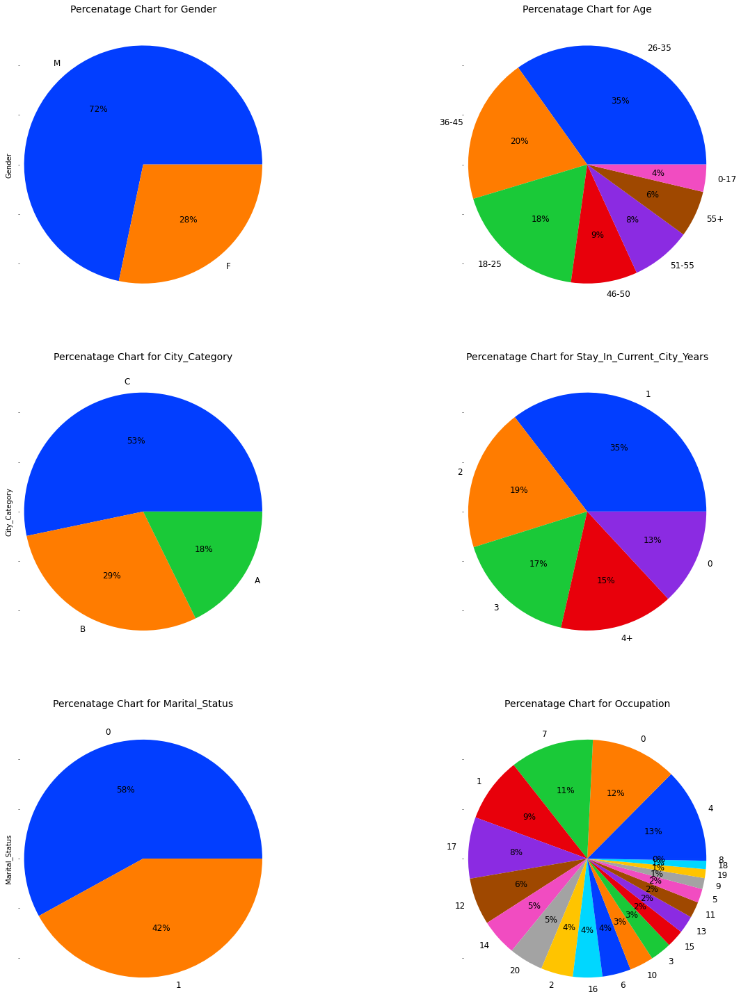

In [39]:
fig, axs = plt.subplots(3, 2,figsize=(20, 20), sharey=True)
colors = sns.color_palette('bright')

Gender.Gender.value_counts().plot(kind='pie', autopct='%.0f%%',ax = axs[0][0], colors=colors, textprops={'fontsize': 12}, radius = 1.2)
axs[0][0].set_title(label = 'Percenatage Chart for Gender', y=1.1, pad=5, fontsize = 14)
Gender.Age.value_counts().plot(kind='pie', autopct='%.0f%%',ax = axs[0][1], colors=colors, textprops={'fontsize': 12},  radius = 1.2)
axs[0][1].set_title(label = 'Percenatage Chart for Age', y=1.1, pad= 5, fontsize = 14)
Gender.City_Category.value_counts().plot(kind='pie', autopct='%.0f%%',ax = axs[1][0], colors=colors, textprops={'fontsize': 12}, radius = 1.2)
axs[1][0].set_title(label = 'Percenatage Chart for City_Category', y=1.1, pad=5, fontsize = 14)
Gender.Stay_In_Current_City_Years.value_counts().plot(kind='pie', autopct='%.0f%%',ax = axs[1][1], colors=colors, textprops={'fontsize': 12},  radius = 1.2)
axs[1][1].set_title(label = 'Percenatage Chart for Stay_In_Current_City_Years', y=1.1, pad=5, fontsize = 14)
Gender.Marital_Status.value_counts().plot(kind='pie', autopct='%.0f%%',ax = axs[2][0], colors=colors, textprops={'fontsize': 12}, radius = 1.2)
axs[2][0].set_title(label = 'Percenatage Chart for Marital_Status', y=1.1, pad=5, fontsize = 14)
Gender.Occupation.value_counts().plot(kind='pie', autopct='%.0f%%',ax = axs[2][1], colors=colors, textprops={'fontsize': 12},  radius = 1.2)
axs[2][1].set_title(label = 'Percenatage Chart for Occupation', y=1.1, pad=5, fontsize = 14)
fig.tight_layout()
plt.subplots_adjust(hspace=0.4)
plt.show()

### From the given sample

1. Around 28 % Females and 72 % are male customers

3. 35% Customers belongs to 26-35 age group
   20% Customers belongs to 36-45 age group
   18% Customers belongs to 18-25 age group
   But only 4 and 6 Percent customers belongs to 0-17 and 55+ Age groups     Respectively

3. 53% Customers are from C type City, 29% are from B type City and Remaining 18% are from A type City

4. Around 35% Customers are staying in current city for 2 years.

5. 58% Customers are unmarried while 42% customers are married.

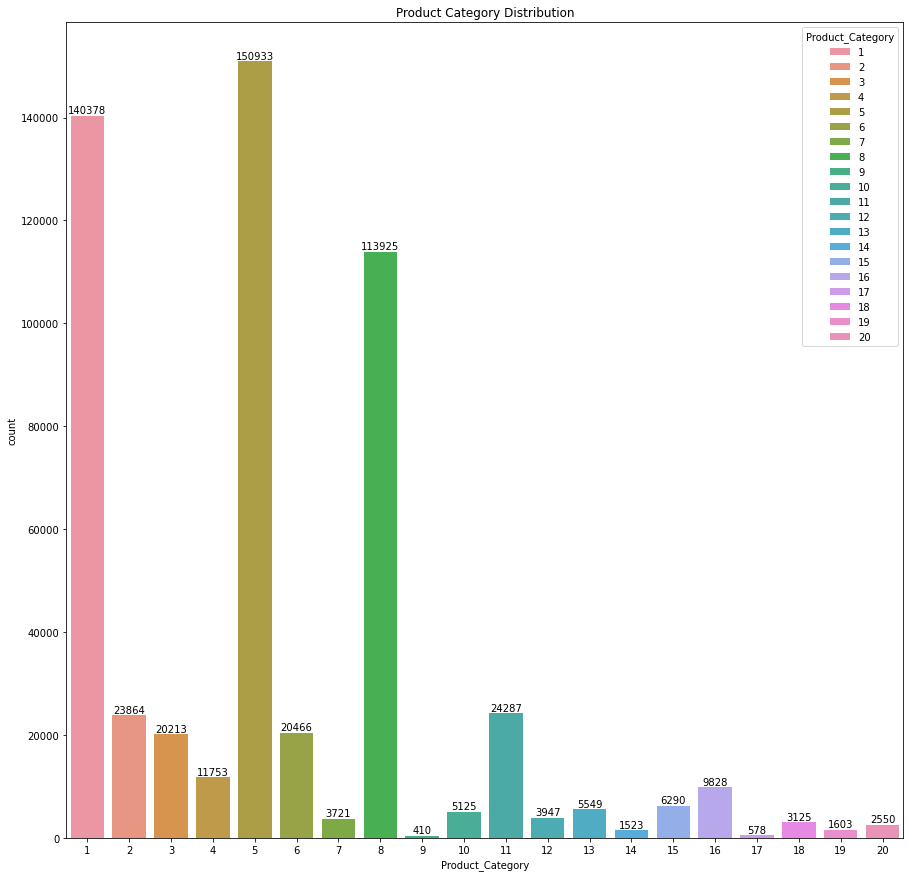

In [40]:
plt.figure(figsize=(15,15))
graph=sns.countplot(x='Product_Category', hue='Product_Category', data=data, dodge=False)
for i in graph.containers:
    graph.bar_label(i,)
graph.set_title("Product Category Distribution", fontsize=12)
plt.show()

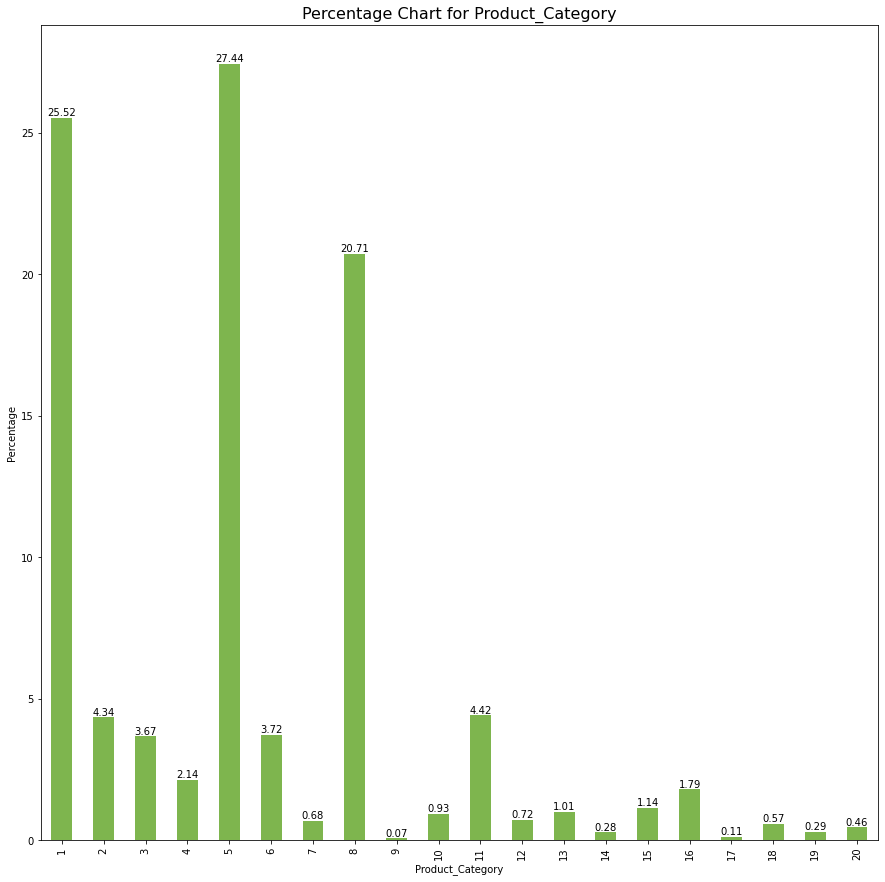

In [41]:
plt.figure(figsize=(15,15))
graph=(data['Product_Category'].value_counts(normalize=True).round(4)*100).sort_index(ascending=True).plot(kind="bar",xlabel="Product_Category", ylabel="Percentage", color="#7eb54e")
for i in graph.containers:
    graph.bar_label(i,)
graph.set_title("Percentage Chart for Product_Category", fontsize=16)
plt.show()

### From the Product Category Distribution

1. Product 5, 8 and 1 is highly selling Product Category
2. Product Category 9 and 17 has very less percentage of selling i.e., 0.07 and 0.11 Percentage respectively

### Purchase Analysis

In [42]:
data['Purchase'].describe()

count    550068.000000
mean       9263.968713
std        5023.065394
min          12.000000
25%        5823.000000
50%        8047.000000
75%       12054.000000
max       23961.000000
Name: Purchase, dtype: float64

In [43]:
Q3,Q1=np.percentile(data['Purchase'],[75,25])
IQR=Q3-Q1
maxExcludingOutlier=Q3+1.5*IQR
minExcludingOutlier=Q1-1.5*IQR
mean=round(data['Purchase'].mean(),2)
median=round(data['Purchase'].median(),2)
mode=round(data['Purchase'].mode(),2)
print("For the given sample Purchase Analysis is as Follows: ")
print("Q1:",Q1)
print("Q3:",Q3)
print("Mean:", round(data['Purchase'].mean(),2))
print("Median: ", data['Purchase'].median())
print("Mode: " , round(data['Purchase'].mode(), 2))
print("IQR: " , IQR)
print("Maximum Purchase Excluding Outlier: " , maxExcludingOutlier)
print("Minimum Purchase Excluding Outlier: " , minExcludingOutlier)


For the given sample Purchase Analysis is as Follows: 
Q1: 5823.0
Q3: 12054.0
Mean: 9263.97
Median:  8047.0
Mode:  0    7011
Name: Purchase, dtype: int64
IQR:  6231.0
Maximum Purchase Excluding Outlier:  21400.5
Minimum Purchase Excluding Outlier:  -3523.5


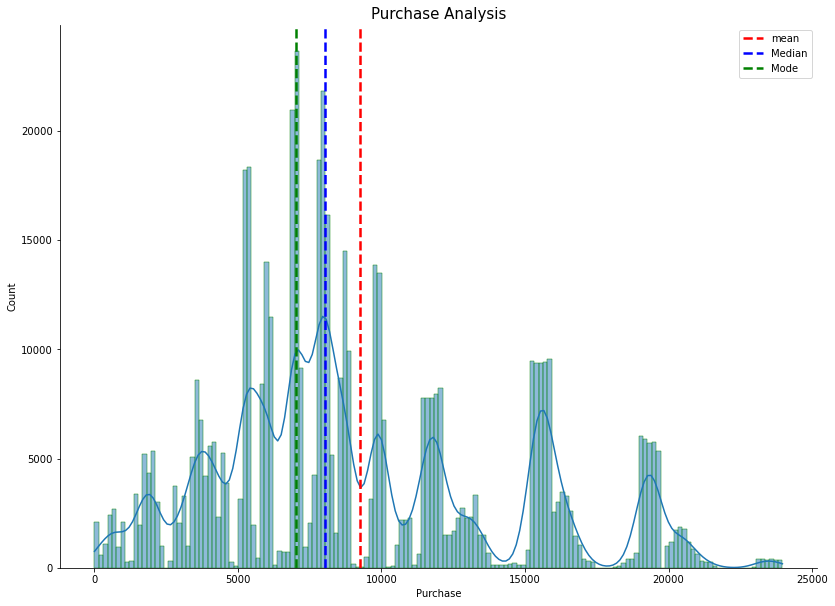

In [44]:
ax = sns.displot(data['Purchase'], kde = True, edgecolor='green', height=8.27, aspect=11.7/8.27)
plt.axvline(data['Purchase'].mean(), ls = '--', color = "red", lw = 2.5, label = "mean")
plt.axvline(data['Purchase'].median(), ls = '--' ,color = 'blue', lw = 2.5, label = 'Median')
plt.axvline(data['Purchase'].mode()[0], ls = '--', color = 'green', lw = 2.5, label = 'Mode')
plt.legend()
plt.title("Purchase Analysis", fontsize = 15)
plt.show()

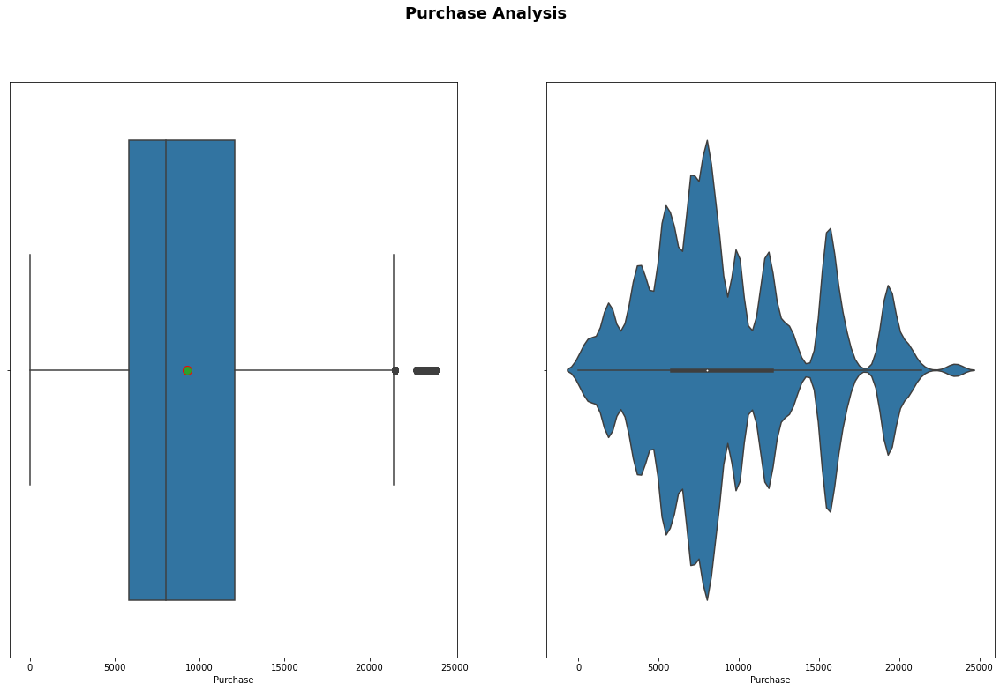

In [45]:
fig, axes=plt.subplots(1, 2, figsize=(20,12))
fig.suptitle("Purchase Analysis", fontsize=18, fontweight='bold')
sns.boxplot(data=data, x='Purchase', showmeans=True, ax=axes[0], dodge=True, meanprops={"marker": ".","markeredgecolor": "red","markersize": "20"})
sns.violinplot(data=data, x="Purchase", showmeans=True, ax=axes[1], dodge=True, meanprops={"marker": ".", "markeredgecolor": "red","markersize": "20"})
plt.xlabel("Purchase")
plt.show()

1. Purchase Distribution "right-skewed / Log normal Distribution" .
2. Majority of Customers purchase in the range 5,000 - 20,000.

In [46]:
data.groupby(['Gender'])['Purchase'].describe()

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
F,135809.0,8734.565765,4767.233289,12.0,5433.0,7914.0,11400.0,23959.0
M,414259.0,9437.526040,5092.186210,12.0,5863.0,8098.0,12454.0,23961.0


In [47]:
data.groupby(['Age'])['Purchase'].describe()

,count,mean,std,min,25%,50%,75%,max
Age,,,,,,,,
0-17,15102.0,8933.464640,5111.114046,12.0,5328.0,7986.0,11874.0,23955.0
18-25,99660.0,9169.663606,5034.321997,12.0,5415.0,8027.0,12028.0,23958.0
26-35,219587.0,9252.690633,5010.527303,12.0,5475.0,8030.0,12047.0,23961.0
36-45,110013.0,9331.350695,5022.923879,12.0,5876.0,8061.0,12107.0,23960.0
46-50,45701.0,9208.625697,4967.216367,12.0,5888.0,8036.0,11997.0,23960.0
51-55,38501.0,9534.808031,5087.368080,12.0,6017.0,8130.0,12462.0,23960.0
55+,21504.0,9336.280459,5011.493996,12.0,6018.0,8105.5,11932.0,23960.0


In [48]:
data.groupby(['Stay_In_Current_City_Years'])['Purchase'].describe()

,count,mean,std,min,25%,50%,75%,max
Stay_In_Current_City_Years,,,,,,,,
0,74398.0,9180.075123,4990.479940,12.0,5480.0,8025.0,11990.0,23960.0
1,193821.0,9250.145923,5027.476933,12.0,5500.0,8041.0,12042.0,23961.0
2,101838.0,9320.429810,5044.588224,12.0,5846.0,8072.0,12117.0,23961.0
3,95285.0,9286.904119,5020.343541,12.0,5832.0,8047.0,12075.0,23961.0
4+,84726.0,9275.598872,5017.627594,12.0,5844.0,8052.0,12038.0,23958.0


In [49]:
data.groupby(['Marital_Status'])['Purchase'].describe()

,count,mean,std,min,25%,50%,75%,max
Marital_Status,,,,,,,,
0,324731.0,9265.907619,5027.347859,12.0,5605.0,8044.0,12061.0,23961.0
1,225337.0,9261.174574,5016.897378,12.0,5843.0,8051.0,12042.0,23961.0


Text(0.5, 1.0, 'Purchase Analysis wrt Gender')

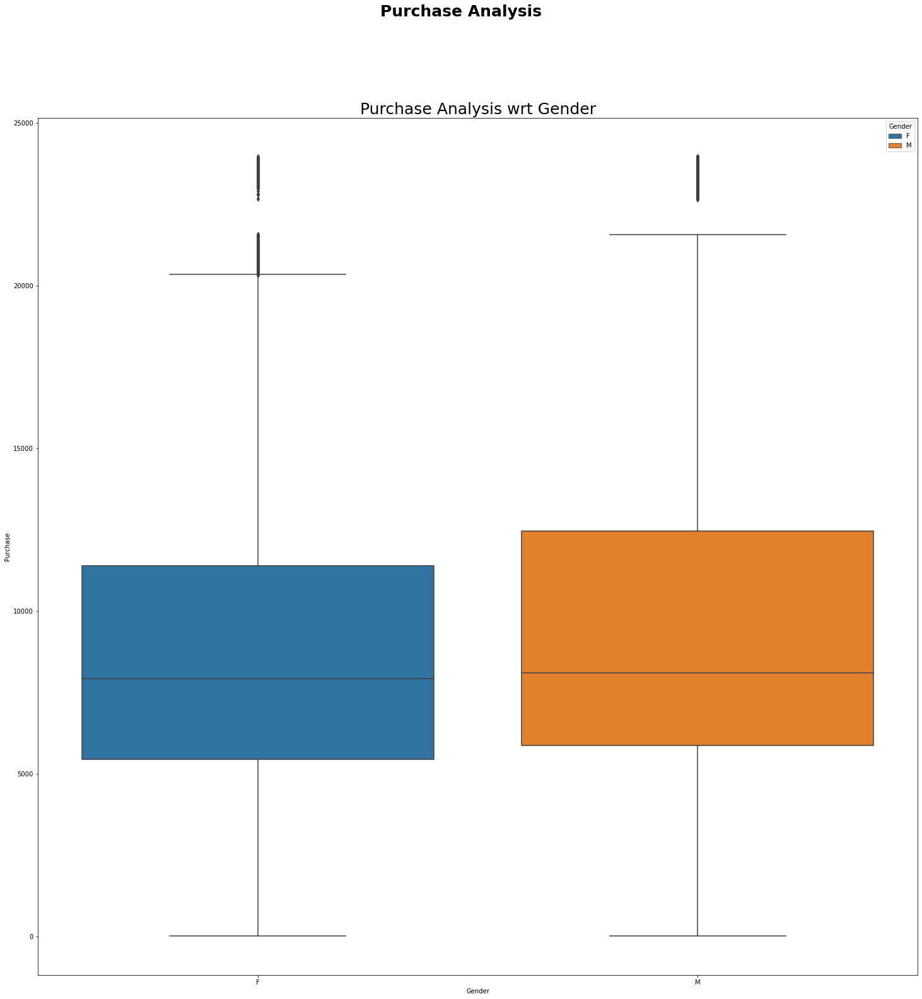

In [50]:
fig, axs = plt.subplots(1,figsize=(25, 25), sharey=False)
fig.suptitle("Purchase Analysis " , fontsize=25, fontweight='bold')
graph = sns.boxplot(x = 'Gender', y = 'Purchase', hue= 'Gender', data= data, dodge = False)
graph.set_title("Purchase Analysis wrt Gender", fontsize = 25)

Text(0.5, 1.0, 'Purchase Analysis wrt Age Distribution')

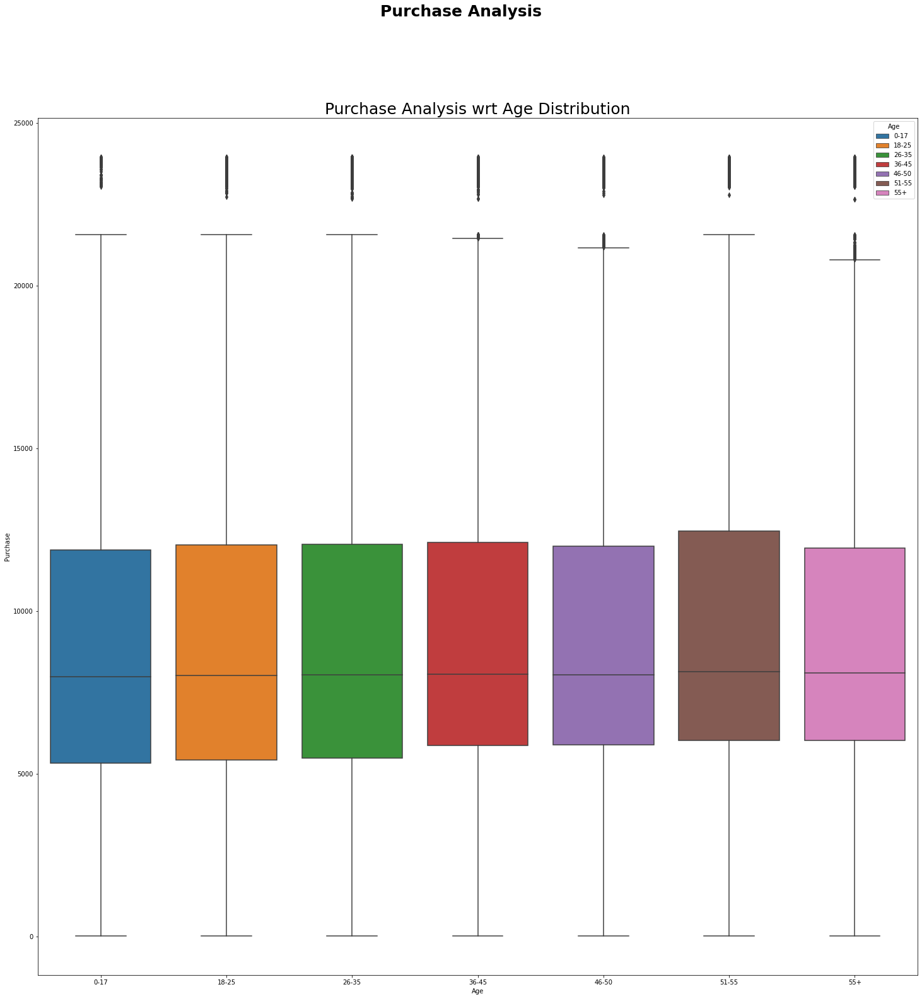

In [51]:
fig, axs = plt.subplots(1,figsize=(25, 25), sharey=False)
fig.suptitle("Purchase Analysis " , fontsize=25, fontweight='bold')
graph2 = sns.boxplot(x = 'Age',y = 'Purchase', hue = 'Age', data = data , dodge=False)
graph2.set_title("Purchase Analysis wrt Age Distribution", fontsize = 25)

Text(0.5, 1.0, 'Purchase Analysis wrt City Category Distribution')

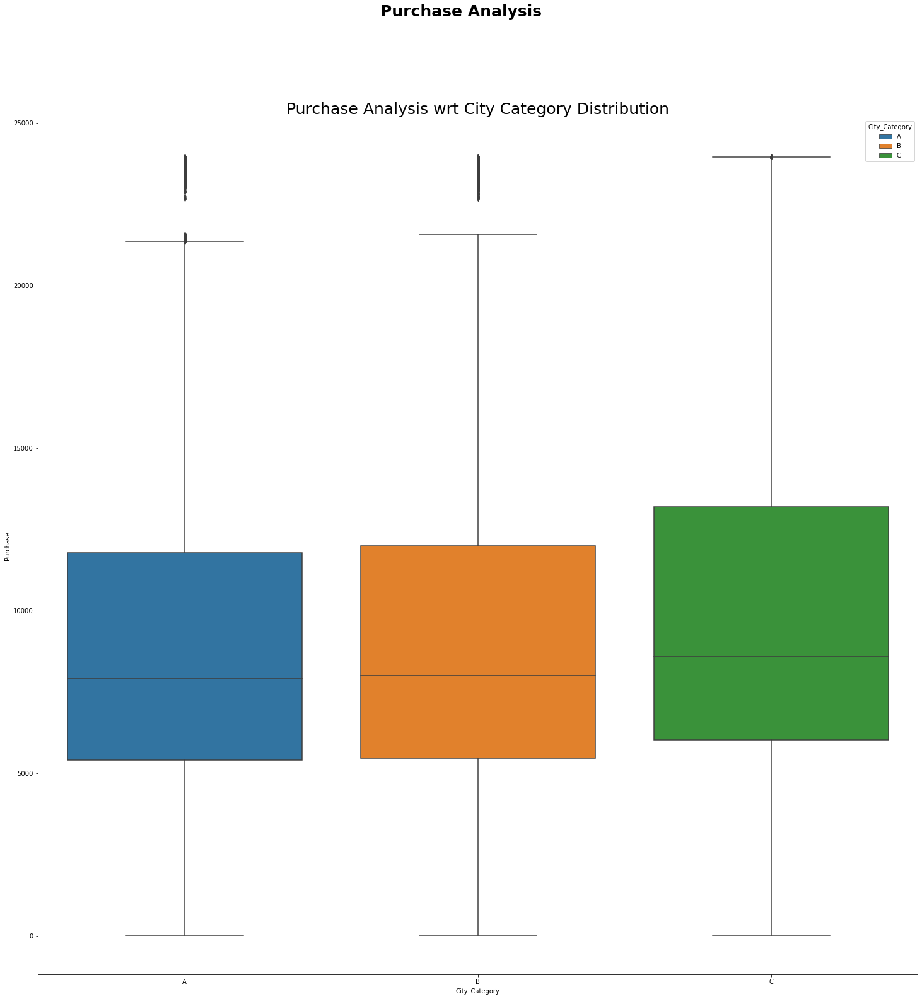

In [52]:
fig, axs = plt.subplots(1,figsize=(25, 25), sharey=False)
fig.suptitle("Purchase Analysis " , fontsize=25, fontweight='bold')
graph3 = sns.boxplot(x = 'City_Category',y = 'Purchase', hue = 'City_Category' ,data = data , dodge=False)
graph3.set_title("Purchase Analysis wrt City Category Distribution", fontsize = 25)

Text(0.5, 1.0, ' Purchase Analysis wrt Stay In Current City Years Distribution')

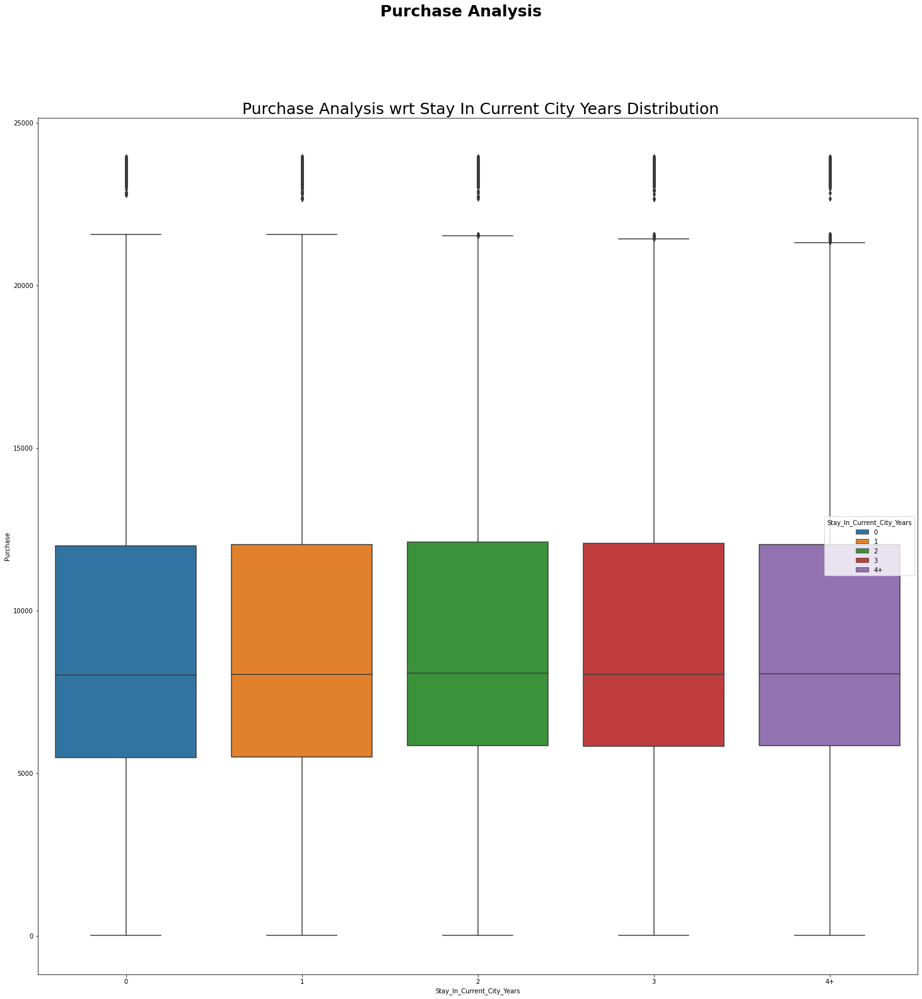

In [53]:
fig, axs = plt.subplots(1,figsize=(25, 25), sharey=False)
fig.suptitle("Purchase Analysis " , fontsize=25, fontweight='bold')
graph4 = sns.boxplot(x = 'Stay_In_Current_City_Years', y = 'Purchase', hue= 'Stay_In_Current_City_Years', data= data, dodge = False )
graph4.set_title(" Purchase Analysis wrt Stay In Current City Years Distribution", fontsize = 25)

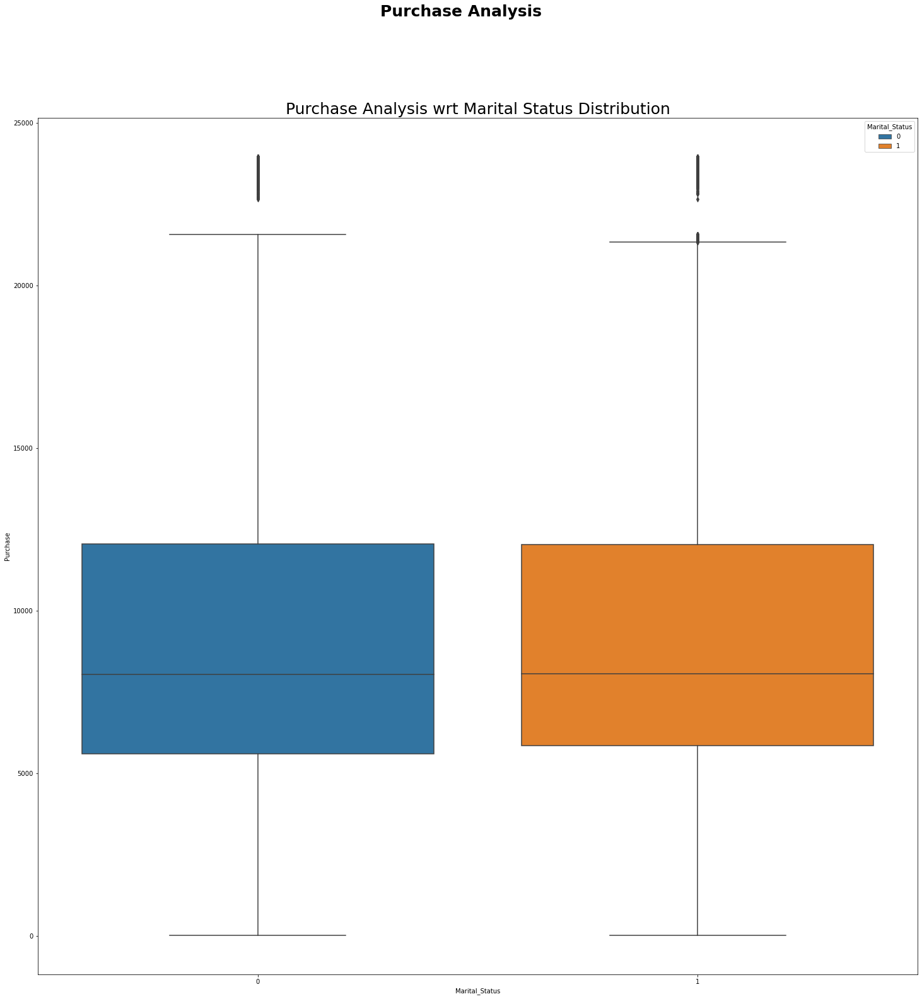

In [54]:
fig, axs = plt.subplots(1,figsize=(25, 25), sharey=False)
fig.suptitle("Purchase Analysis " , fontsize=25, fontweight='bold')
graph5 = sns.boxplot(x = 'Marital_Status',y = 'Purchase', hue = 'Marital_Status', data = data , dodge=False)
graph5.set_title("Purchase Analysis wrt Marital Status Distribution", fontsize = 25)
plt.show()

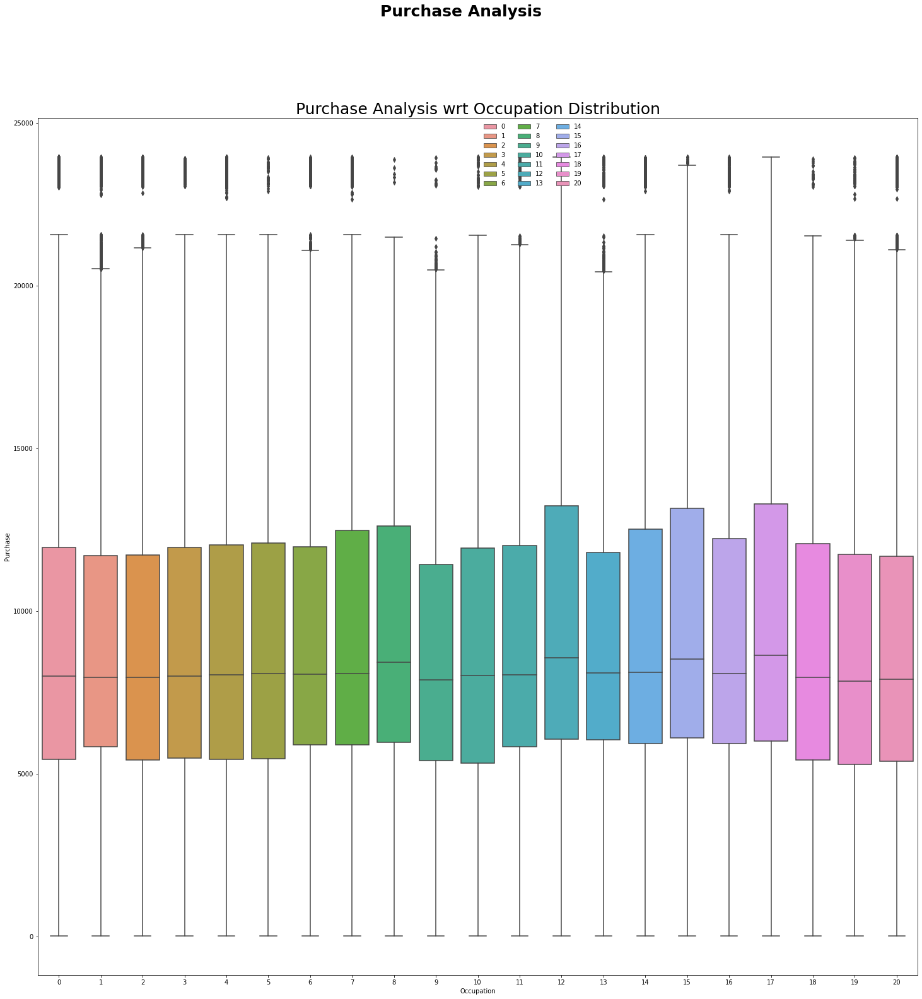

In [55]:
fig, axs = plt.subplots(1,figsize=(25, 25), sharey=False)
fig.suptitle("Purchase Analysis " , fontsize=25, fontweight='bold')
graph6 = sns.boxplot(x = 'Occupation', y = 'Purchase', hue = 'Occupation' ,data = data , dodge=False)
sns.move_legend(graph6, "upper left", bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False)
graph6.set_title("Purchase Analysis wrt Occupation Distribution", fontsize = 25)
plt.show()

#### From the Given Sample:
1. We can see Median purchase for Male and Female are nearly same. We can see many outliers here for Female Customers.
2. For age groups as well we can see sNearly equal Median Purchase with some Outiers
3. For C type city we rarely see any outliers for purchases as compared to A and B type of city
4. For Married People there are more people as compared to Unmarried.
        But we can't conclude anything here as this if for Sample

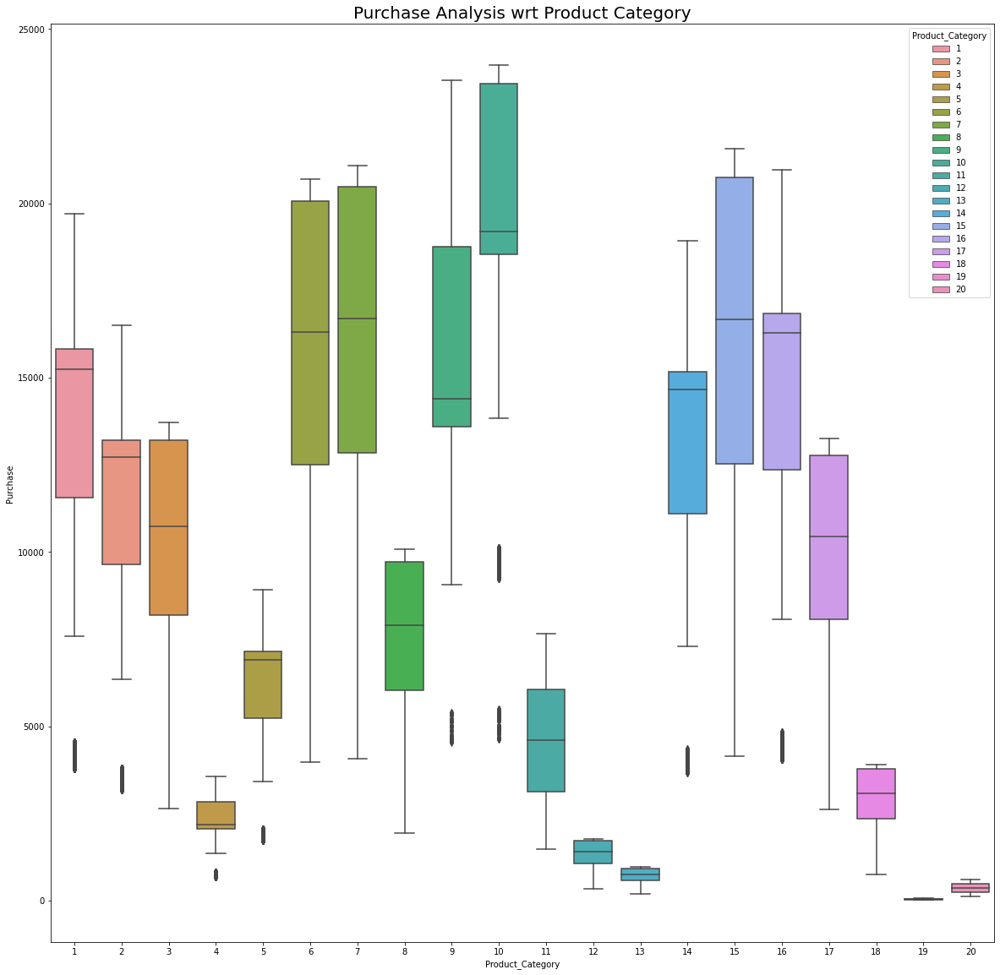

In [56]:
plt.figure(figsize=(20,20))
graph = sns.boxplot(x = 'Product_Category', y = 'Purchase', hue= 'Product_Category', data= data, dodge = False )
graph.set_title("Purchase Analysis wrt Product Category", fontsize = 20)
plt.show()

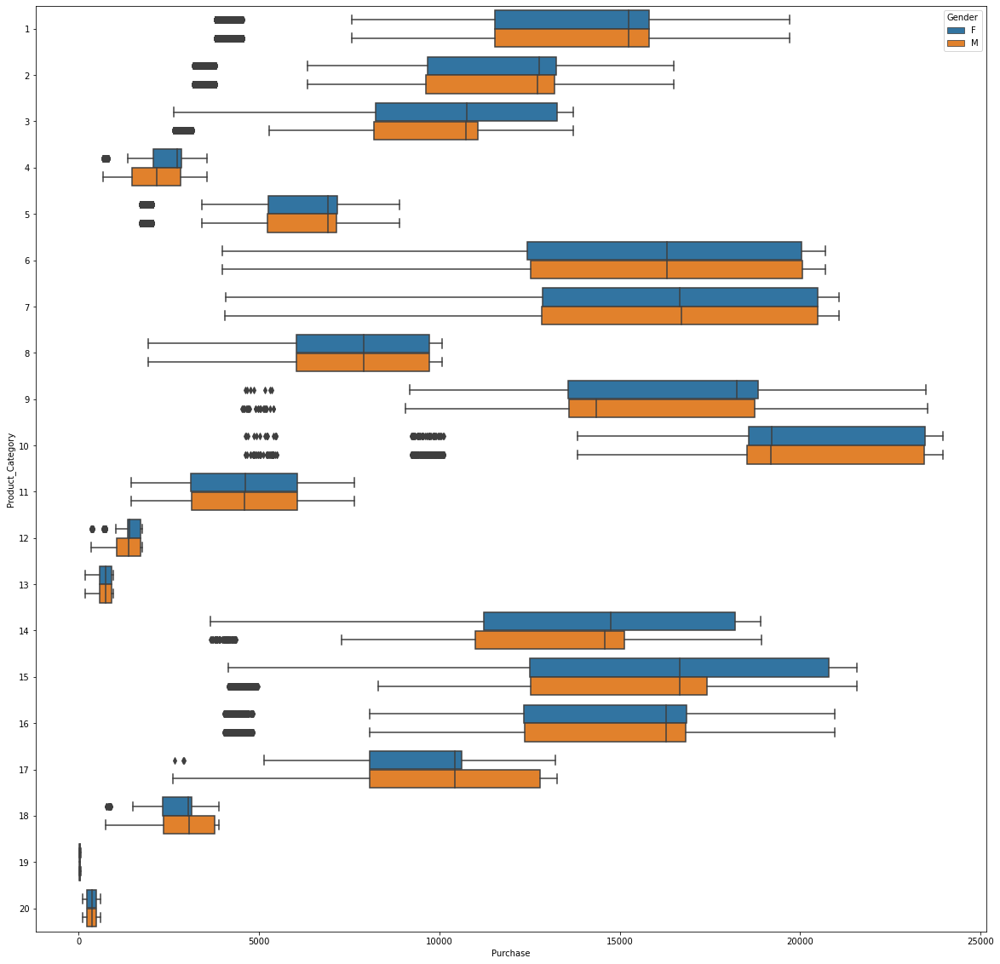

In [57]:
plt.figure(figsize=(20,20))
sns.boxplot(y = 'Product_Category', x = 'Purchase', hue= 'Gender', data= data, dodge = True , orient = "h")
# graph.set_title("Purchase Analysis wrt Product Category", fontsize = 20)
plt.show()

1. Product Category 6, 7 and 10 seems to be more popular among the Customers which pays high

In [58]:
data['Purchase'].describe()

count    550068.000000
mean       9263.968713
std        5023.065394
min          12.000000
25%        5823.000000
50%        8047.000000
75%       12054.000000
max       23961.000000
Name: Purchase, dtype: float64

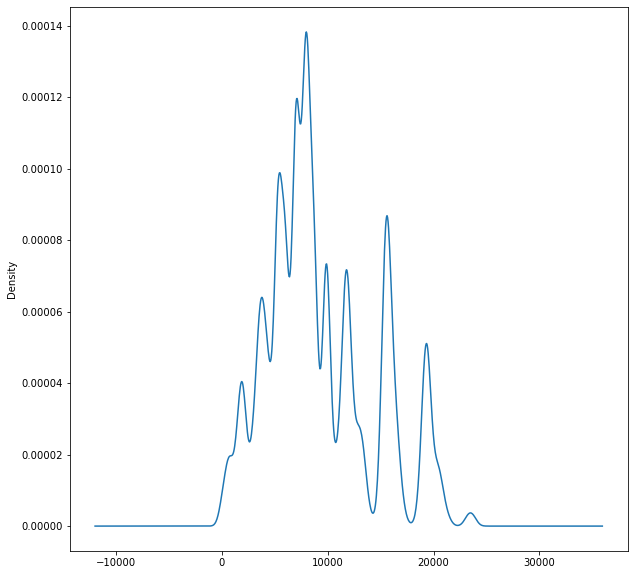

In [59]:
plt.figure(figsize=(10,10))
data['Purchase'].plot(kind = "kde")
plt.show()

1. The above KDE plot seems to be Right skewed or we can say Log normal Distribution

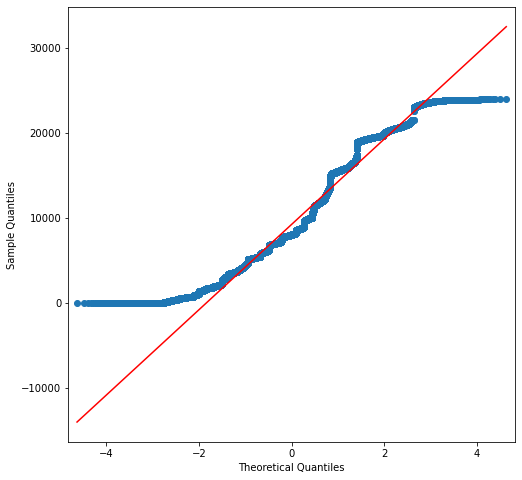

In [60]:
plt.rc("figure", figsize=(8,8))
sm.qqplot(data['Purchase'], dist=stats.norm, line='s');
plt.show()

### Functions

In [61]:
def IQRAnalysis(data):
    Q3, Q1 = np.percentile(data, [75 ,25])
    IQR = Q3 - Q1
    maxExcludingOutlier = Q3 + 1.5 * IQR
    minExcludingOutlier = Q1 - 1.5 * IQR
    mean = round(data.mean(),2)
    median = round(data.median(),2)
    mode = round(data.mode(), 2)
    print("Q1: ", Q1)
    print("Q3: ", Q3)
    print("Mean: ", mean)
    print("Median: ", median)
    print("Mode: " , mode)
    print("IQR: " , IQR)
    print("Maximum Purchase Excluding Outlier: " , maxExcludingOutlier)
    print("Minimum Purchase Excluding Outlier: " , minExcludingOutlier)

In [62]:
def simulate_clt(d, sample_size):
    means = []
    for i in range(1000):
        means.append(d.sample(sample_size, replace = True).mean())
    sns.displot(pd.Series(means), kde = True)
    title = "CLT for Sample Size: ", str(sample_size)
    plt.title(title, fontsize = 14)
    return pd.Series(means)

In [63]:
def plotCofidenceInterval(d, sample_size, CI):
    means = []
    for i in range(1000):
        means.append(d.sample(sample_size).mean())
    
    sampleMean = np.mean(means)
    alpha = (1 - CI)/2
    z_critical = stats.norm.ppf(1 - alpha)
    stdDev = data['Purchase'].std()
    std_dev = z_critical * (stdDev / math.sqrt(sample_size))
    confidence_interval = [sampleMean - std_dev , sampleMean + std_dev]
    plt.figure(figsize=(20,10))
    sns.kdeplot(pd.Series(means), color = "g", fill = True)
    plt.axvline(sampleMean, label = ("Mean: ", np.round(sampleMean, 2)))
    plt.axvline(confidence_interval[0], color = "r", label =("Lower Limit: ", np.round(confidence_interval[0], 2)))
    plt.axvline(confidence_interval[1], color = "r", label = ("Upper Limit: ", np.round(confidence_interval[1], 2)))
    plt.legend(loc = "best")
    plt.show()

In [64]:
def plotConfidenceIntervalAll(d, sample_size):
    GivenSampleStdDev = d.std()
    means = []
    for i in range(1000):
        means.append(d.sample(sample_size , replace = True).mean())
    
    sampleMean = np.round(np.mean(means), 2)
    alpha90 = (1 - 0.90)/2
    alpha95 = (1 - 0.95)/2
    alpha99 = (1 - 0.99)/2

    z_cr90 = stats.norm.ppf(1 - alpha90)
    z_cr95 = stats.norm.ppf(1 - alpha95)
    z_cr99 = stats.norm.ppf(1 - alpha99)
    
    std_dev90 = z_cr90 * np.std(means)
    std_dev95 = z_cr95 * np.std(means)
    std_dev99 = z_cr99 * np.std(means)
    confidence_interval90 = [sampleMean - std_dev90 , sampleMean + std_dev90]
    confidence_interval95 = [sampleMean - std_dev95 , sampleMean + std_dev95]
    confidence_interval99 = [sampleMean - std_dev99 , sampleMean + std_dev99]
    plt.figure(figsize=(20,10))
    sns.kdeplot(pd.Series(means), color = "m", fill = True )
    a = plt.axvline(sampleMean, label = ("Mean: ", sampleMean), color = "navy", linewidth = 4)
    b = plt.axvline(confidence_interval90[0], color = "c",linewidth = 3, linestyle = "solid", label =("Lower Limit 90% CI: ", np.round(confidence_interval90[0], 2)))
    c = plt.axvline(confidence_interval90[1], color = "c", linewidth = 3, linestyle = "solid", label = ("Upper Limit 90% CI: ", np.round(confidence_interval90[1], 2)))
    d = plt.axvline(confidence_interval95[0], color = "g",linewidth = 3, linestyle = "--", label =("Lower Limit 95% CI: ", np.round(confidence_interval95[0], 2)))
    e = plt.axvline(confidence_interval95[1], color = "g", linewidth = 3, linestyle = "--", label = ("Upper Limit 95% CI: ", np.round(confidence_interval95[1], 2)))
    f = plt.axvline(confidence_interval99[0], color = "#36454f", linewidth = 3, linestyle = "-.",  label =("Lower Limit 99% CI: ", np.round(confidence_interval99[0], 2)))
    g = plt.axvline(confidence_interval99[1], color = "#36454f", linewidth = 3, linestyle = "-.", label = ("Upper Limit 99% CI: ", np.round(confidence_interval99[1], 2)))
    plt.legend(loc = "best")
    title = "CLT Distribution For Purchases with confidence Intervals for Sample size " + str(sample_size)
    plt.title(title, fontsize = 16)
    plt.show()

In [65]:
def CIUsingIQRMethod(d, sample_size):
    means = []
    for i in range(1000):
        means.append(d.sample(sample_size, replace = True).mean())
    
    Ninty_percent_CI = np.percentile(means, [5, 95])
    NintyFive_percent_CI = np.percentile(means, [2.5, 97.5])
    NintyNine_percent_CI = np.percentile(means, [0.5, 99.5])
    
    print("90 Percent Confidence Interval for Given data with " + str(sample_size) +" Sample size is " + str(Ninty_percent_CI) )
    print("95 Percent Confidence Interval for Given data with " + str(sample_size) +" Sample size is " + str(NintyFive_percent_CI) )
    print("99 Percent Confidence Interval for Given data with " + str(sample_size) +" Sample size is " + str(NintyNine_percent_CI) )    

In [66]:
sample_sizeArray = [50, 100, 500, 1000, 5000, 10000, 50000, 100000]

### Male vs Female Purchases

In [67]:
data.groupby('Gender')['Purchase'].describe()

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
F,135809.0,8734.565765,4767.233289,12.0,5433.0,7914.0,11400.0,23959.0
M,414259.0,9437.526040,5092.186210,12.0,5863.0,8098.0,12454.0,23961.0


In [68]:
MaleData=data[data['Gender']=="M"]

In [69]:
MaleData.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
4,1000002,P00285442,M,55+,16,C,4+,0,8,7969
5,1000003,P00193542,M,26-35,15,A,3,0,1,15227
6,1000004,P00184942,M,46-50,7,B,2,1,1,19215
7,1000004,P00346142,M,46-50,7,B,2,1,1,15854
8,1000004,P0097242,M,46-50,7,B,2,1,1,15686


In [70]:
MaleData['Purchase'].describe()

count    414259.00000
mean       9437.52604
std        5092.18621
min          12.00000
25%        5863.00000
50%        8098.00000
75%       12454.00000
max       23961.00000
Name: Purchase, dtype: float64

For male customers from the given sample mean Purchase is 9438.

<AxesSubplot:ylabel='Density'>

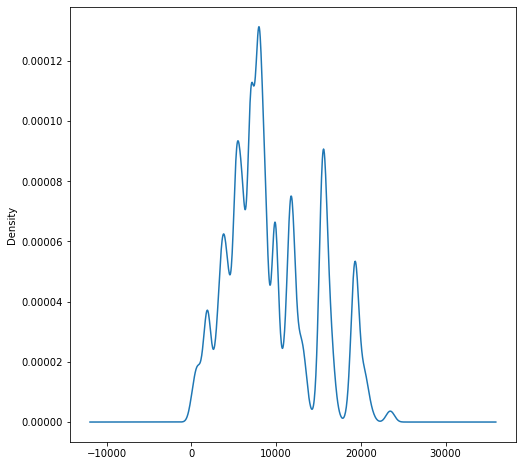

In [71]:
MaleData["Purchase"].plot(kind="kde")

In [72]:
print("\033[1mIQR Analysis for Men \033[0m")
IQRAnalysis(MaleData['Purchase'])

IQR Analysis for Men 
Q1:  5863.0
Q3:  12454.0
Mean:  9437.53
Median:  8098.0
Mode:  0    6855
Name: Purchase, dtype: int64
IQR:  6591.0
Maximum Purchase Excluding Outlier:  22340.5
Minimum Purchase Excluding Outlier:  -4023.5


Purchase Analysis for Male Customers  



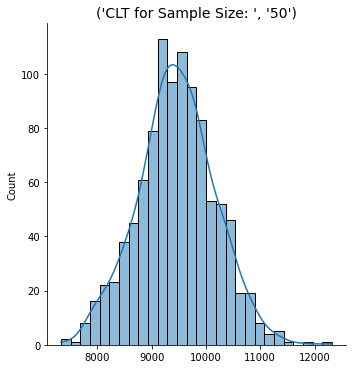

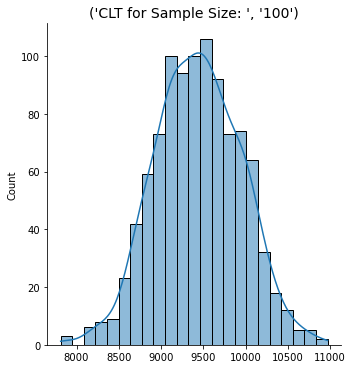

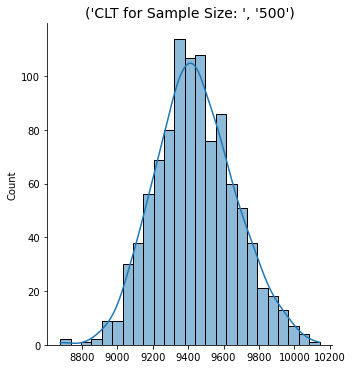

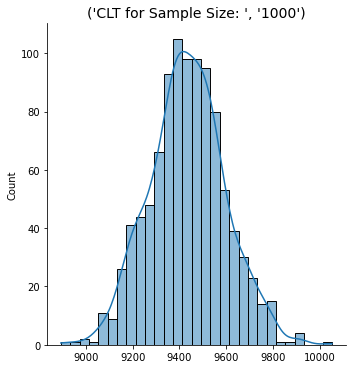

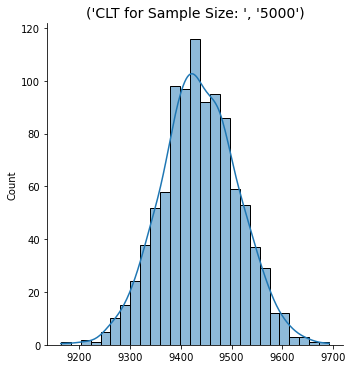

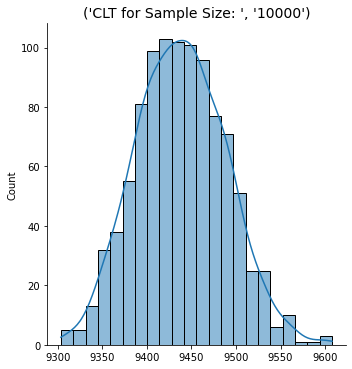

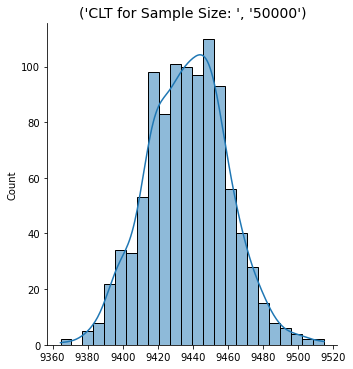

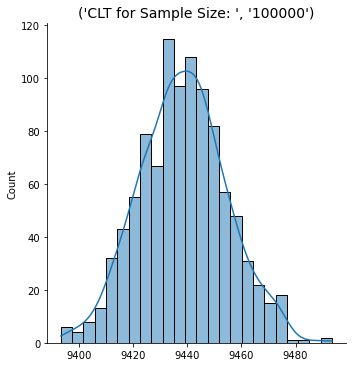

In [73]:
print('\033[1mPurchase Analysis for Male Customers  \033[0m')
print()
for x in sample_sizeArray:
    simulate_clt(MaleData['Purchase'], x)
    

Purchase Analysis for Male Customers  



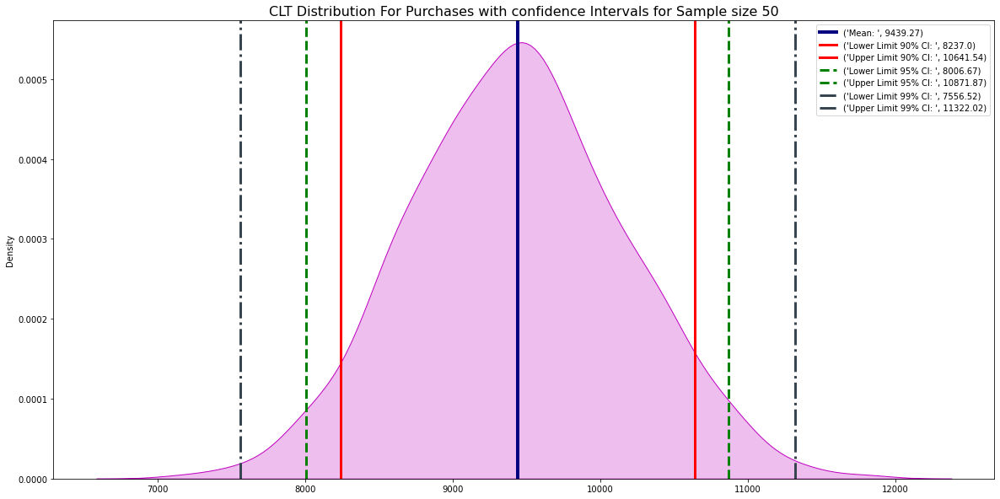

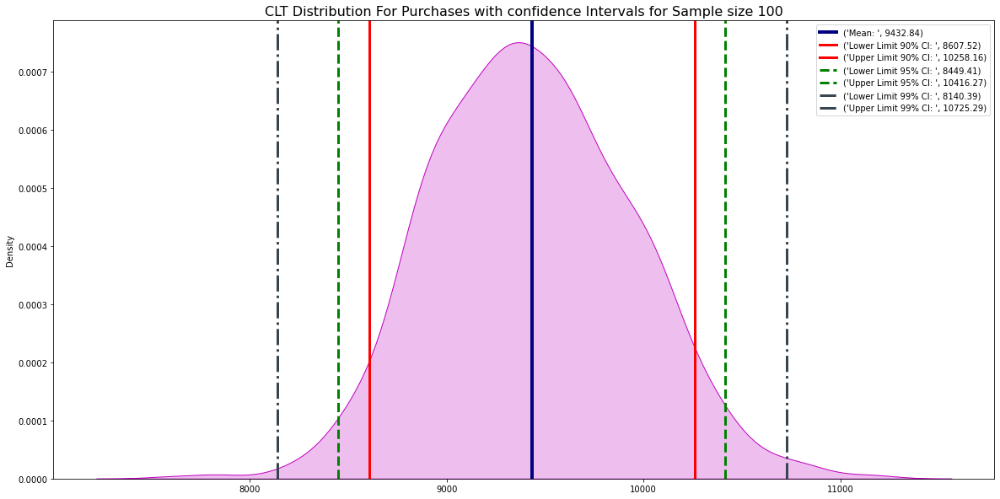

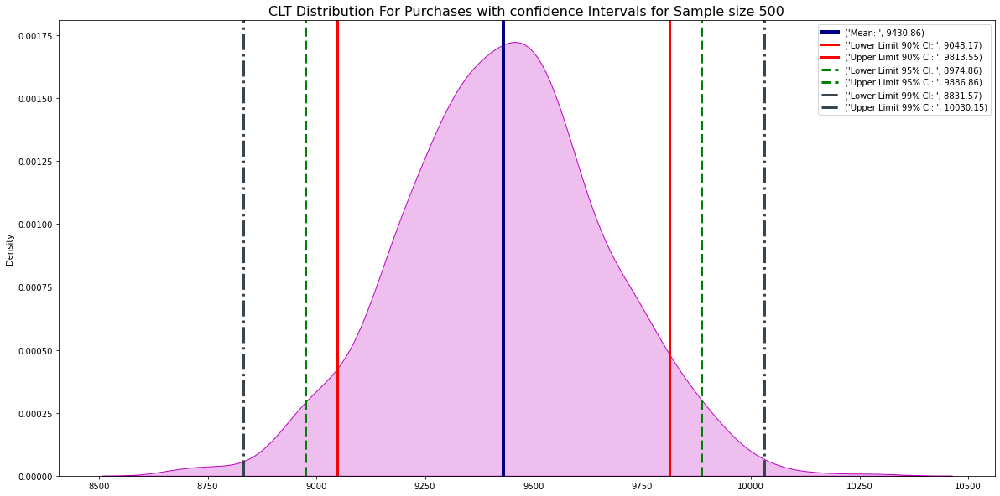

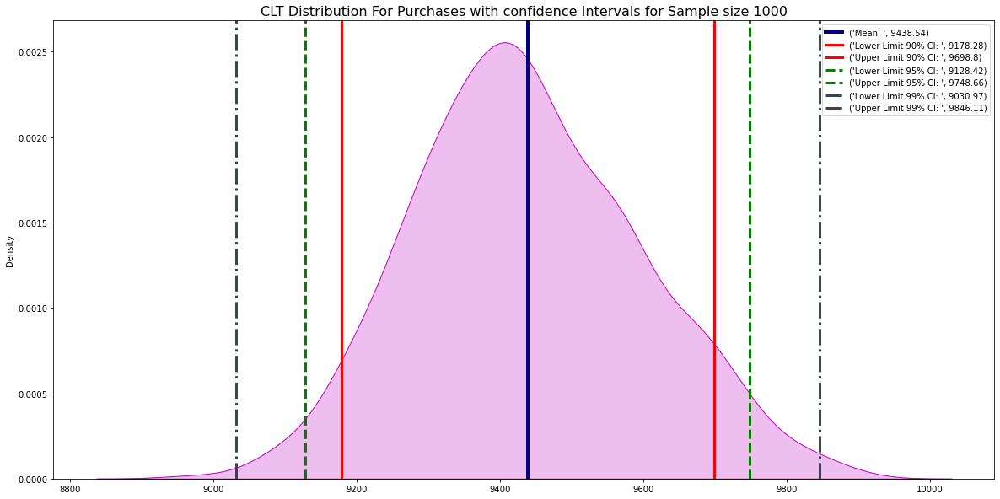

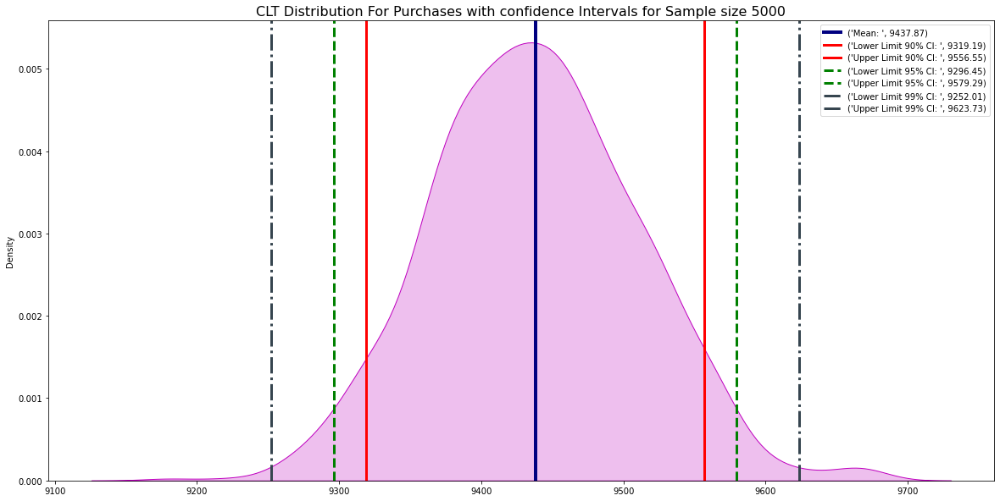

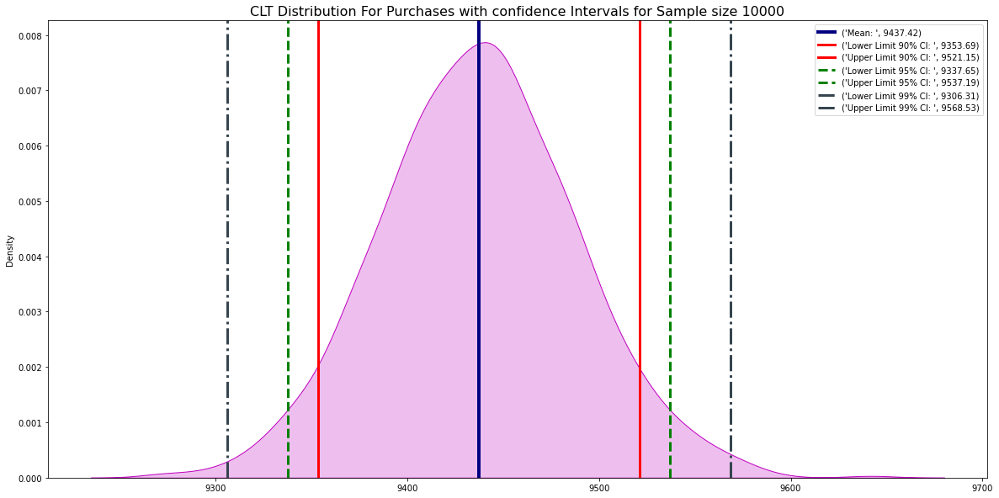

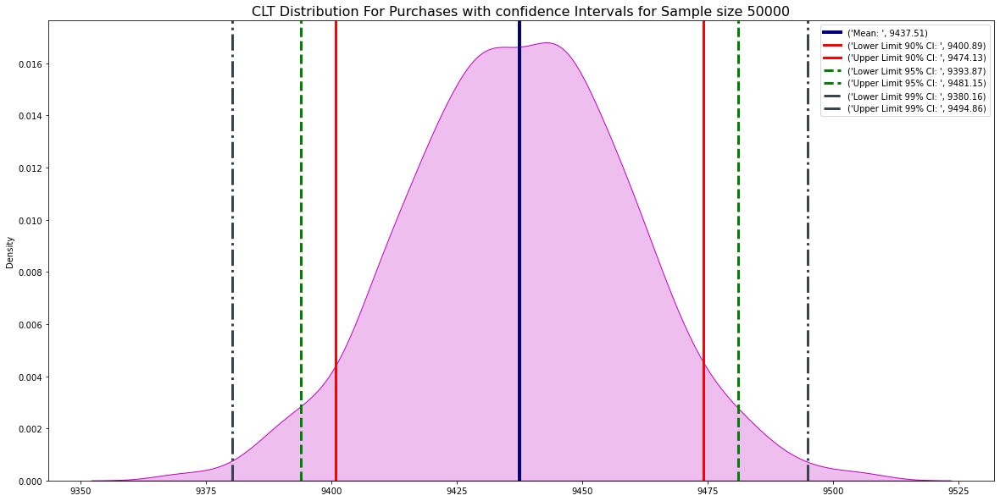

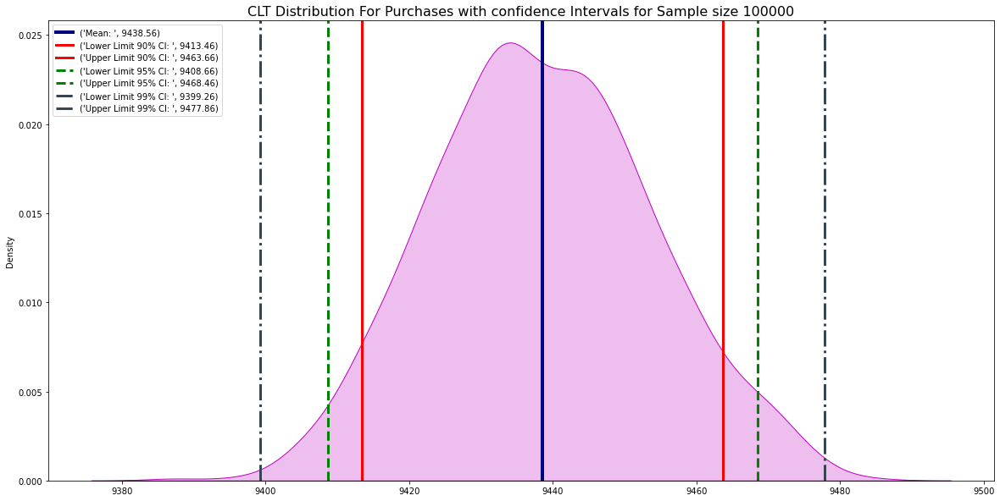

In [74]:
print('\033[1mPurchase Analysis for Male Customers  \033[0m')
print()
for x in sample_sizeArray:
    plotConfidenceIntervalAll(MaleData['Purchase'], x)
    print()
#     print("--------------------------------------------------------------------------------------------------")

In [75]:
print('\033[1mPurchase Analysis for Male Customers  \033[0m')
print()
for i in sample_sizeArray:
    CIUsingIQRMethod(MaleData['Purchase'],x)
    print()
    print("----------------------------------------------------------------------------------------------")

Purchase Analysis for Male Customers  

90 Percent Confidence Interval for Given data with 100000 Sample size is [9412.653962 9464.745073]
95 Percent Confidence Interval for Given data with 100000 Sample size is [9407.7179645 9470.3834155]
99 Percent Confidence Interval for Given data with 100000 Sample size is [9399.5717353  9479.31713665]

----------------------------------------------------------------------------------------------
90 Percent Confidence Interval for Given data with 100000 Sample size is [9408.020493  9462.5700195]
95 Percent Confidence Interval for Given data with 100000 Sample size is [9404.82628675 9466.67148425]
99 Percent Confidence Interval for Given data with 100000 Sample size is [9397.89893595 9472.6879876 ]

----------------------------------------------------------------------------------------------
90 Percent Confidence Interval for Given data with 100000 Sample size is [9411.608116 9463.805133]
95 Percent Confidence Interval for Given data with 100000 S

1. As the sample size increases, We can see the difference between previous and current lower range and Upper range started decreasing which means it is stabalizing
2. For Male (sample size 100000) range for mean purchase with
        confidence interval 90% is [9410.82, 9464.75]
        confidence interval 95% is [9405.78 , 9470.06]
        confidence interval 99% is [9394.84 , 9479.77]

In [76]:
FemaleData=data[data['Gender']=="F"]

In [77]:
FemaleData.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,1057
14,1000006,P00231342,F,51-55,9,A,1,0,5,5378


In [78]:
FemaleData['Purchase'].describe()

count    135809.000000
mean       8734.565765
std        4767.233289
min          12.000000
25%        5433.000000
50%        7914.000000
75%       11400.000000
max       23959.000000
Name: Purchase, dtype: float64

<AxesSubplot:ylabel='Density'>

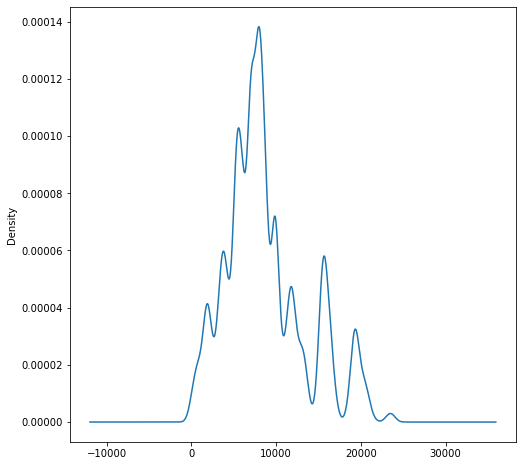

In [79]:
FemaleData["Purchase"].plot(kind="kde")

In [80]:
print("\033[1mIQR Analysis for Female \033[0m")
IQRAnalysis(FemaleData['Purchase'])

IQR Analysis for Female 
Q1:  5433.0
Q3:  11400.0
Mean:  8734.57
Median:  7914.0
Mode:  0    7108
Name: Purchase, dtype: int64
IQR:  5967.0
Maximum Purchase Excluding Outlier:  20350.5
Minimum Purchase Excluding Outlier:  -3517.5


Purchase Analysis for Female Customers  



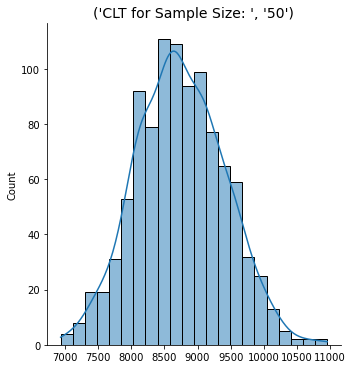

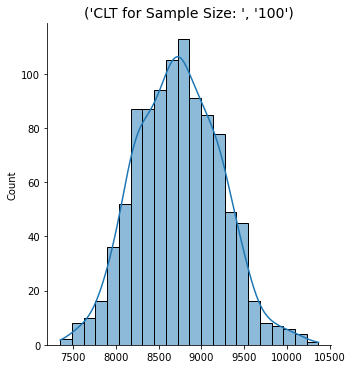

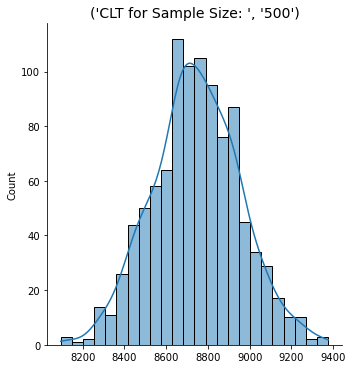

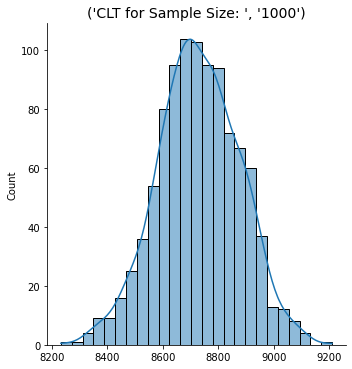

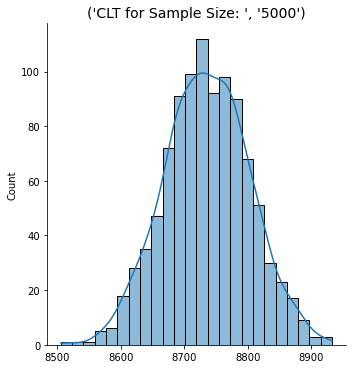

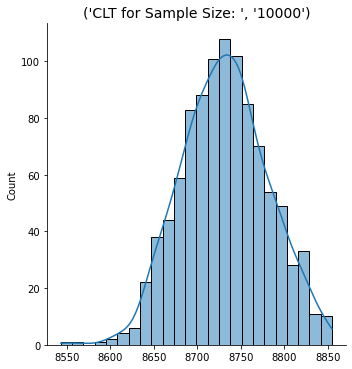

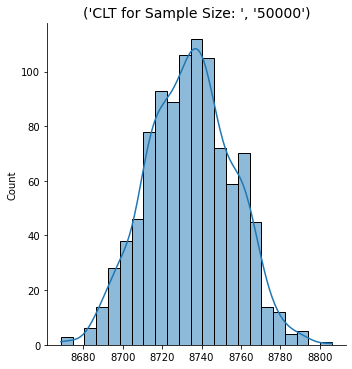

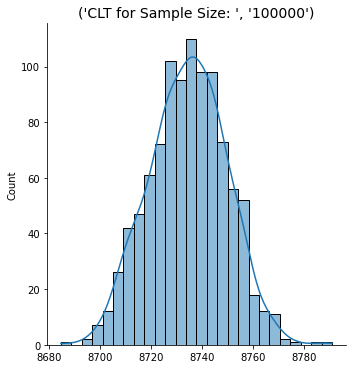

In [81]:
print('\033[1mPurchase Analysis for Female Customers  \033[0m')
print()
for x in sample_sizeArray:
    simulate_clt(FemaleData['Purchase'], x)

Purchase Analysis for Female Customers  



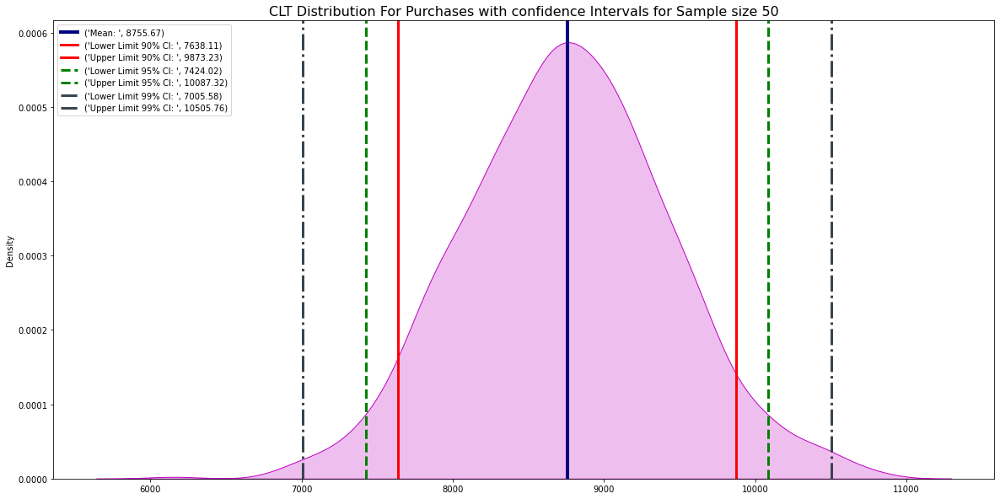


--------------------------------------------------------------------------------------------------


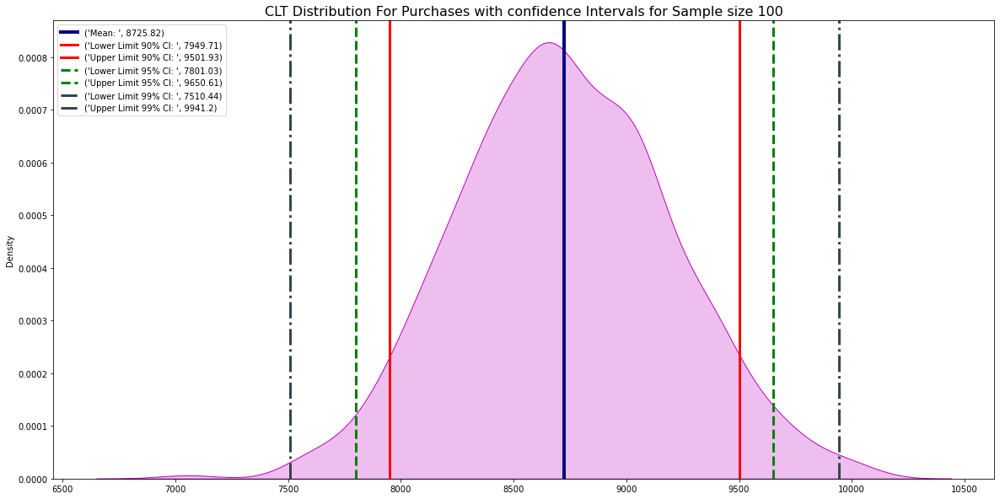


--------------------------------------------------------------------------------------------------


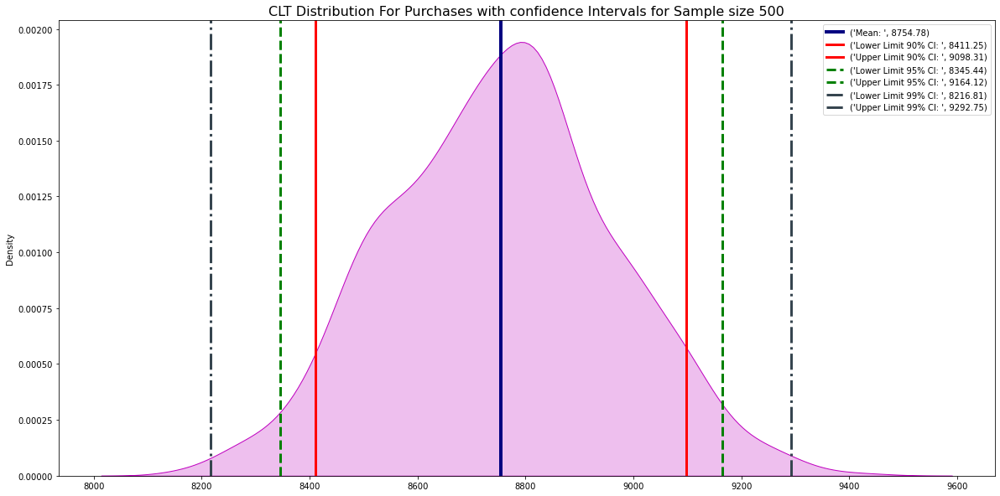


--------------------------------------------------------------------------------------------------


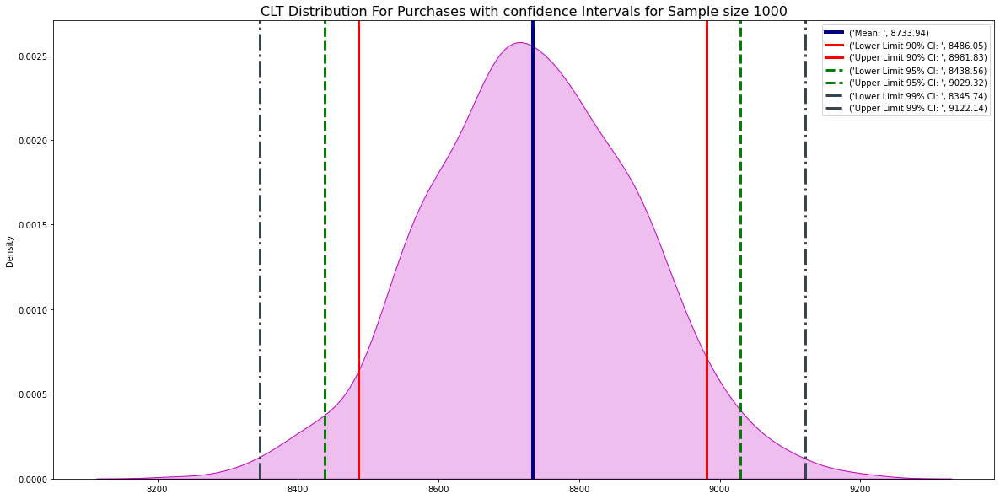


--------------------------------------------------------------------------------------------------


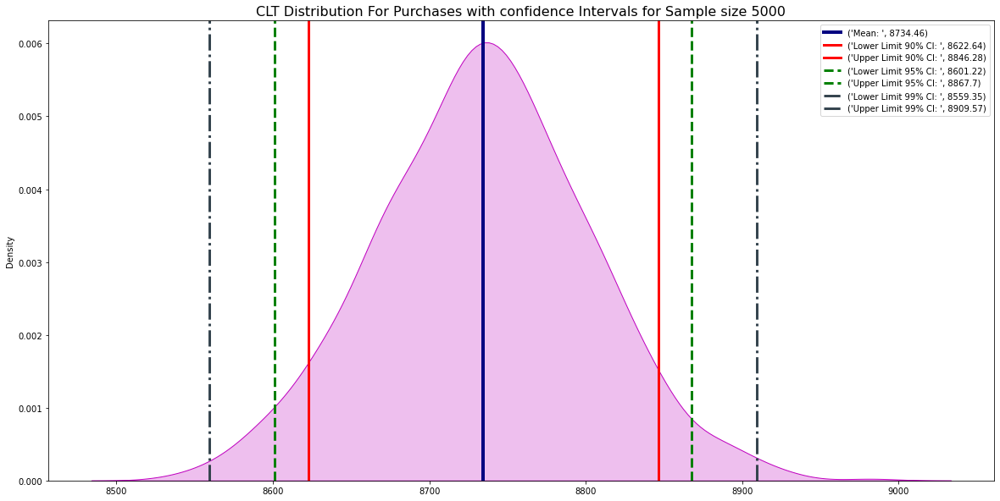


--------------------------------------------------------------------------------------------------


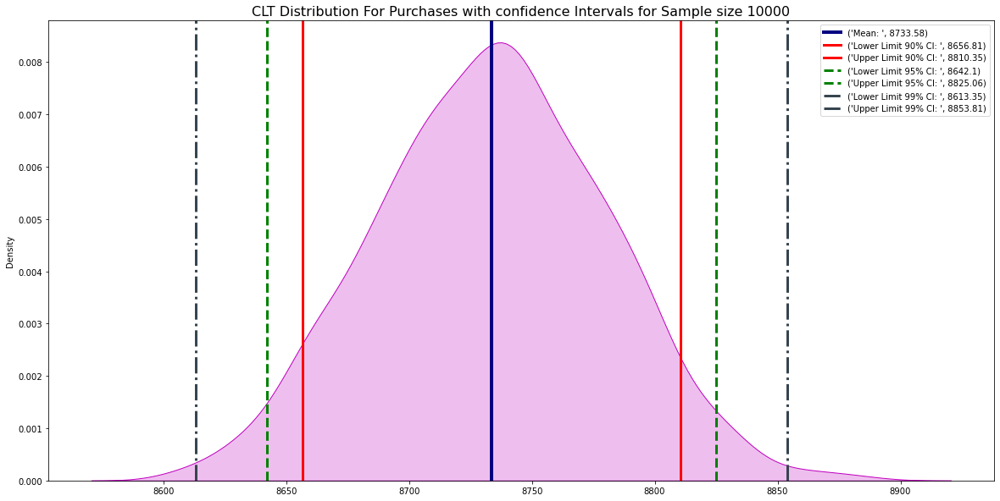


--------------------------------------------------------------------------------------------------


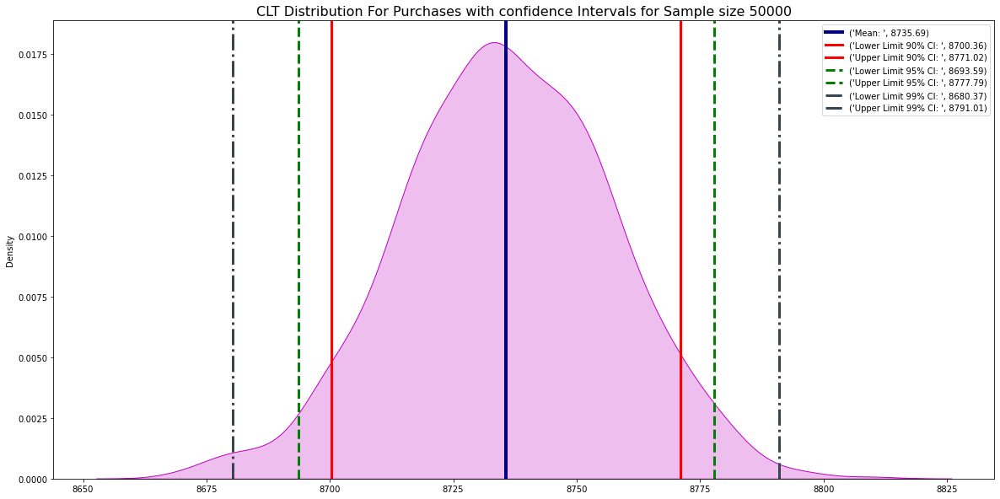


--------------------------------------------------------------------------------------------------


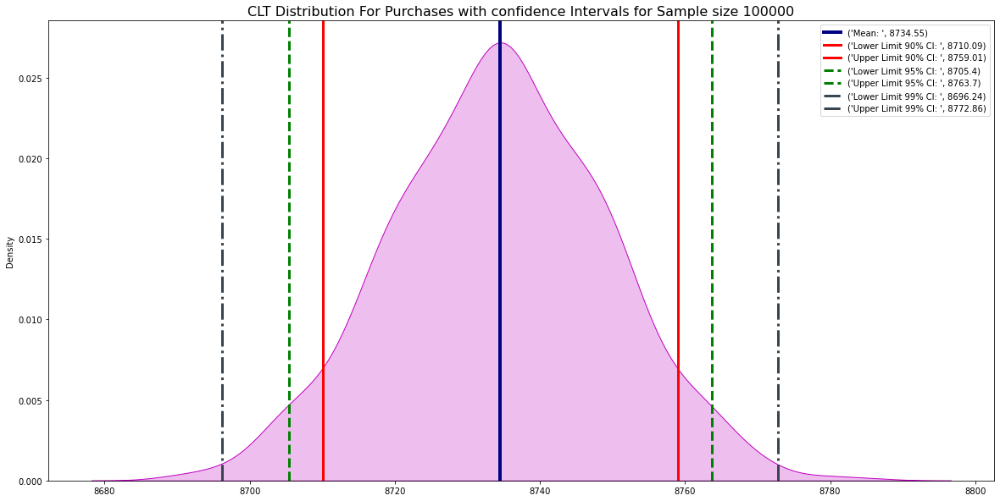


--------------------------------------------------------------------------------------------------


In [83]:
print('\033[1mPurchase Analysis for Female Customers  \033[0m')
print()
for x in sample_sizeArray:
    plotConfidenceIntervalAll(FemaleData['Purchase'], x)
    print()
    print("--------------------------------------------------------------------------------------------------")

In [84]:
print('\033[1mPurchase Analysis for Female Customers  \033[0m')
print()
for x in sample_sizeArray:
    CIUsingIQRMethod(FemaleData['Purchase'], x)
    print()
    print("-----------------------------------------------------------------------------------------------------")

Purchase Analysis for Female Customers  

90 Percent Confidence Interval for Given data with 50 Sample size is [7523.264 9822.165]
95 Percent Confidence Interval for Given data with 50 Sample size is [7357.437 9980.254]
99 Percent Confidence Interval for Given data with 50 Sample size is [ 7055.8531 10360.0189]

-----------------------------------------------------------------------------------------------------
90 Percent Confidence Interval for Given data with 100 Sample size is [7974.69 9529.01]
95 Percent Confidence Interval for Given data with 100 Sample size is [7842.582  9690.3595]
99 Percent Confidence Interval for Given data with 100 Sample size is [7554.2875  9891.21895]

-----------------------------------------------------------------------------------------------------
90 Percent Confidence Interval for Given data with 500 Sample size is [8401.7315 9081.9552]
95 Percent Confidence Interval for Given data with 500 Sample size is [8352.2353  9138.59495]
99 Percent Confidence

1. As the sample size increases, We can see the difference between previous and current lower range and Upper range started decreasing which means it is stabalizing, as sample size increases variance decreases
2. For Female (sample size 100000) range for mean purchase with
        confidence interval 90% is [8709.64 , 8759.64]
        confidence interval 95% is [8703.46 , 8764.35]
        confidence interval 99% is [8693.72 , 8774.83]

In [90]:
def maleFemalePurchaseComparison(sample_size):
    mean1 = []
    for i in range(1000):
        mean1.append(MaleData['Purchase'].sample(sample_size , replace = True).mean())
    sampleMean = np.round(np.mean(mean1), 2)
    alpha90 = (1 - 0.90)/2
    z_cr90 = stats.norm.ppf(1 - alpha90)
    std_dev90 = z_cr90 * np.std(mean1)
    confidence_interval90 = [sampleMean - std_dev90 , sampleMean + std_dev90]
    alpha95 = (1 - 0.95)/2
    z_cr95 = stats.norm.ppf(1 - alpha95)
    std_dev95 = z_cr95 * np.std(mean1)
    confidence_interval95 = [sampleMean - std_dev95 , sampleMean + std_dev95]
    alpha99 = (1 - 0.99)/2
    z_cr99 = stats.norm.ppf(1 - alpha99)
    std_dev99 = z_cr99 * np.std(mean1)
    confidence_interval99 = [sampleMean - std_dev99 , sampleMean + std_dev99]
    plt.figure(figsize=(20,10))
    sns.kdeplot(pd.Series(mean1), color = "#00FFFF", fill = True )
    plt.axvline(sampleMean, label = ("Mean for male: ", sampleMean), color = "navy", linewidth = 3)
    plt.axvline(confidence_interval90[0], color = "r",linewidth = 2, linestyle = "solid", label =("Lower Limit 90% CI for Male: ", np.round(confidence_interval90[0], 2)))
    plt.axvline(confidence_interval90[1], color = "r", linewidth = 2, linestyle = "solid", label = ("Upper Limit 90% CI for Male: ", np.round(confidence_interval90[1], 2)))
    plt.axvline(confidence_interval95[0], color = "g",linewidth = 2, linestyle = "solid", label =("Lower Limit 95% CI for Male: ", np.round(confidence_interval95[0], 2)))
    plt.axvline(confidence_interval95[1], color = "g", linewidth = 2, linestyle = "solid", label = ("Upper Limit 95% CI for Male: ", np.round(confidence_interval95[1], 2)))
    plt.axvline(confidence_interval99[0], color = "#36454f", linewidth = 2, linestyle = "solid",  label =("Lower Limit 99% CI for Male: ", np.round(confidence_interval99[0], 2)))
    plt.axvline(confidence_interval99[1], color = "#36454f", linewidth = 2, linestyle = "solid", label = ("Upper Limit 99% CI for Male: ", np.round(confidence_interval99[1], 2)))

    mean2 = []
    for i in range(1000):
        mean2.append(FemaleData['Purchase'].sample(sample_size , replace = True).mean())
    sampleMean2 = np.round(np.mean(mean2), 2)
    alpha902 = (1 - 0.90)/2
    z_cr902 = stats.norm.ppf(1 - alpha902)
    std_dev902 = z_cr902 * np.std(mean2)
    confidence_interval902 = [sampleMean2 - std_dev902 , sampleMean2 + std_dev902]
    alpha952 = (1 - 0.95)/2
    z_cr952 = stats.norm.ppf(1 - alpha952)
    std_dev952 = z_cr952 * np.std(mean2)
    confidence_interval952 = [sampleMean2 - std_dev952 , sampleMean2 + std_dev952]
    alpha992 = (1 - 0.99)/2
    z_cr992 = stats.norm.ppf(1 - alpha992)
    std_dev992 = z_cr992 * np.std(mean2)
    confidence_interval992 = [sampleMean2 - std_dev992 , sampleMean2 + std_dev992]
    sns.kdeplot(pd.Series(mean2), color = "g", fill = True )
    plt.axvline(sampleMean2, label = ("Mean for Female: ", sampleMean2), color = "navy", linewidth = 3, linestyle = "--")
    plt.axvline(confidence_interval902[0], color = "r",linewidth = 2, linestyle = "--", label =("Lower Limit 90% CI for female: ", np.round(confidence_interval902[0], 2)))
    plt.axvline(confidence_interval902[1], color = "r", linewidth = 2, linestyle ="--", label = ("Upper Limit 90% CI for female: ", np.round(confidence_interval902[1], 2)))
    plt.axvline(confidence_interval952[0], color = "g",linewidth = 2, linestyle = "--", label =("Lower Limit 95% CI for female: ", np.round(confidence_interval952[0], 2)))
    plt.axvline(confidence_interval952[1], color = "g", linewidth = 2, linestyle ="--", label = ("Upper Limit 95% CI for female: ", np.round(confidence_interval952[1], 2)))
    plt.axvline(confidence_interval992[0], color = "#36454f",linewidth = 2, linestyle = "--", label =("Lower Limit 99% CI for female: ", np.round(confidence_interval992[0], 2)))
    plt.axvline(confidence_interval992[1], color = "#36454f", linewidth = 2, linestyle ="--", label = ("Upper Limit 99% CI for female: ", np.round(confidence_interval992[1], 2)))

    plt.legend(loc = 'best')
    plt.title("Male And Female Comparison for Purchases")
    plt.show()

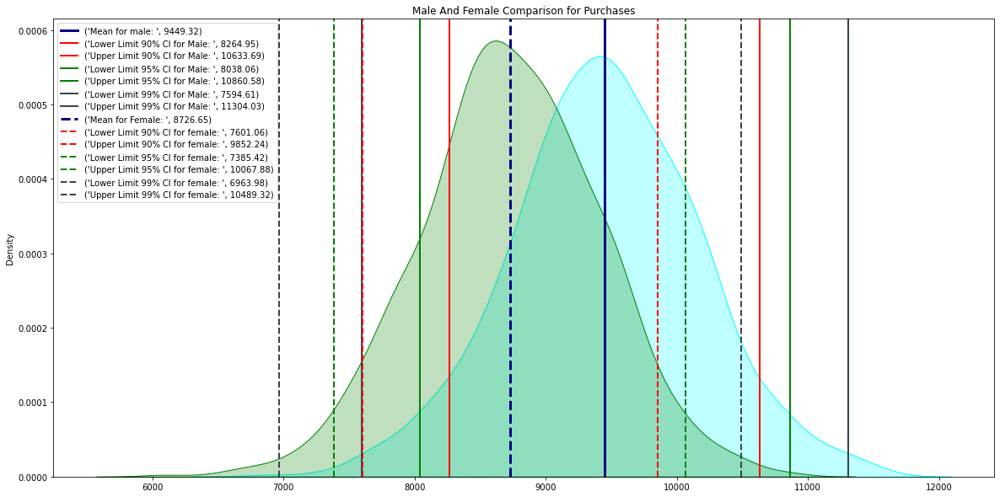

Sample size:  50
---------------------------------------------------------------------


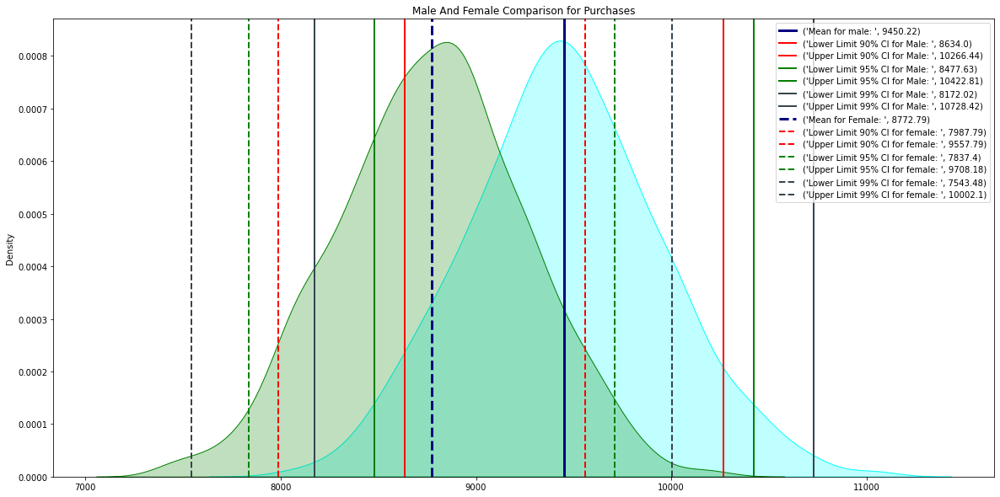

Sample size:  100
---------------------------------------------------------------------


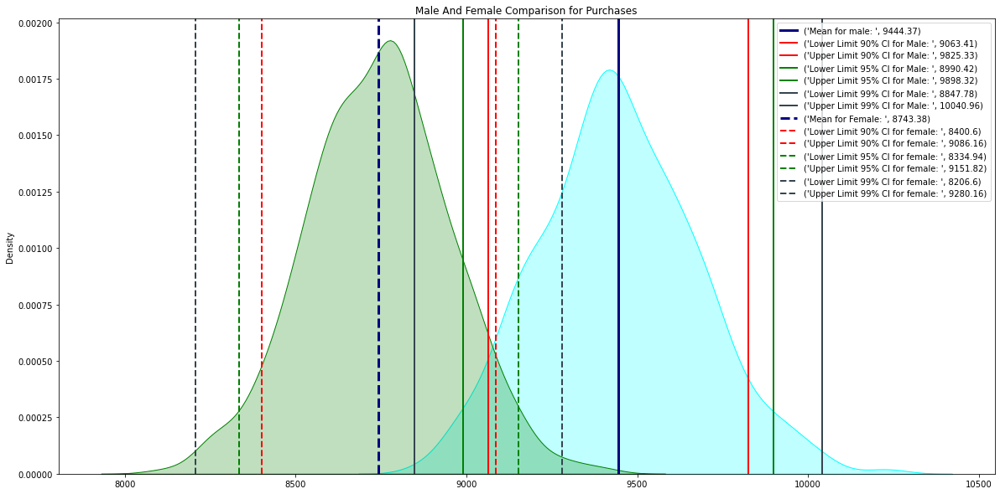

Sample size:  500
---------------------------------------------------------------------


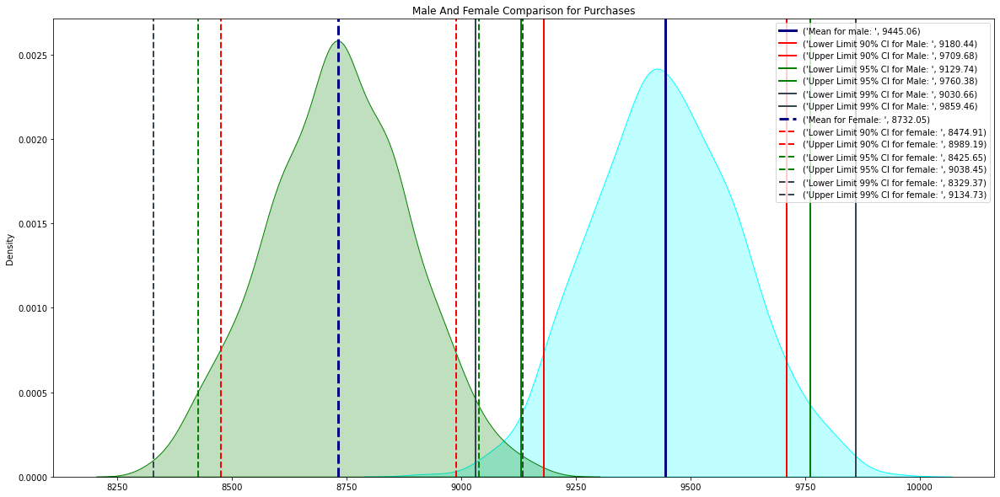

Sample size:  1000
---------------------------------------------------------------------


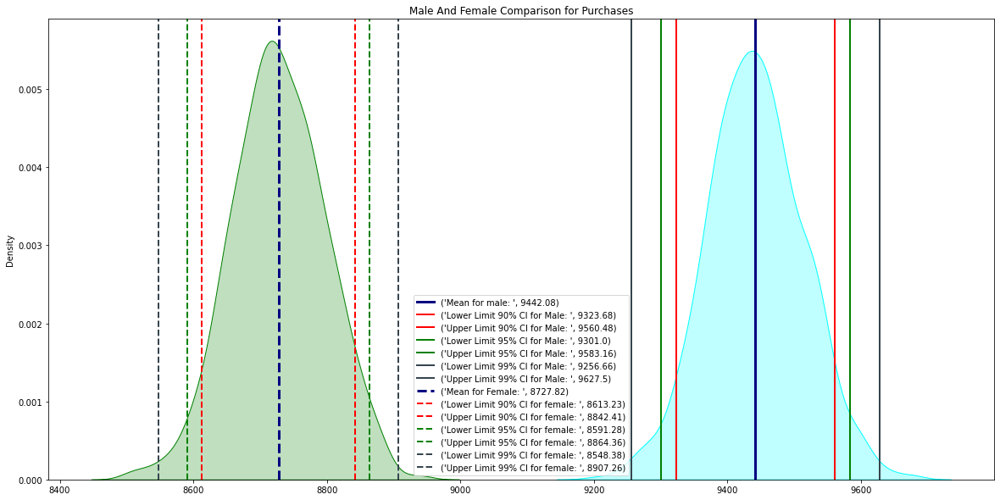

Sample size:  5000
---------------------------------------------------------------------


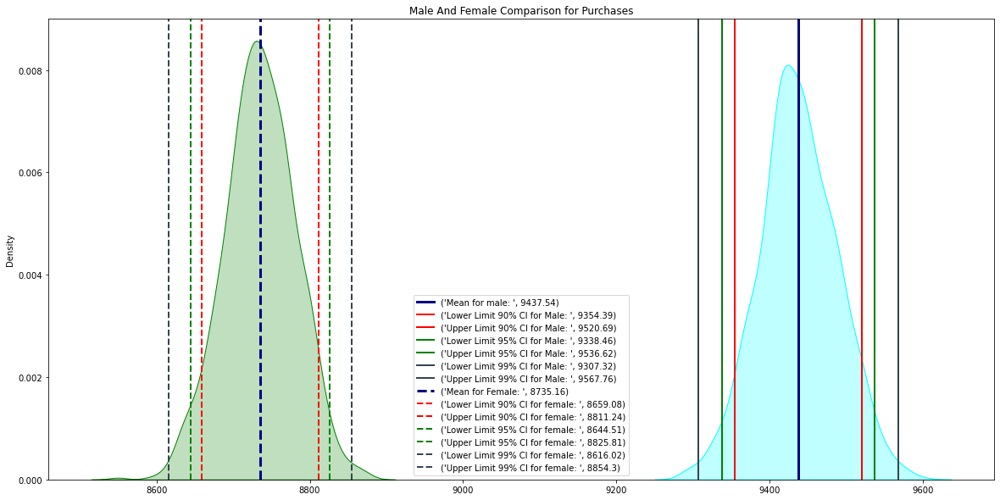

Sample size:  10000
---------------------------------------------------------------------


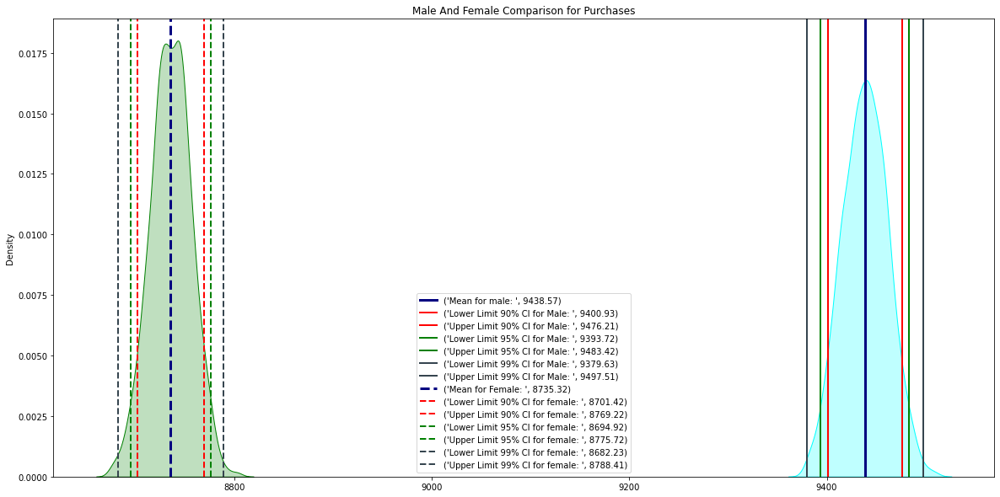

Sample size:  50000
---------------------------------------------------------------------


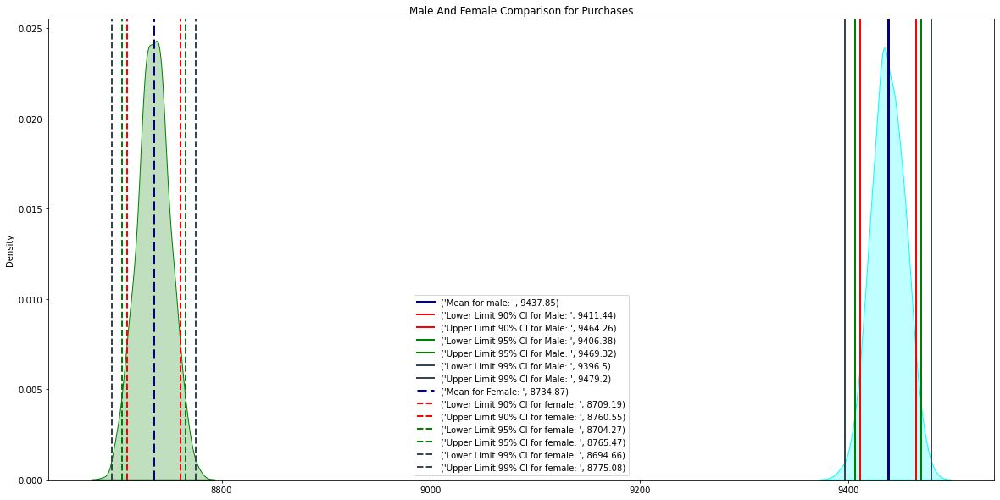

Sample size:  100000
---------------------------------------------------------------------


In [91]:
for x in sample_sizeArray:
    maleFemalePurchaseComparison(x)
    print("Sample size: ", x)
    print("---------------------------------------------------------------------")

As sample size increases the two plots (For Male and Female) started to become distinct with confidence level as mentioned in the image

### Recommendation

From the observations female customers spend less than males on average, so walmart need to give attention on incresing sale from female customers. They can run campaigns for female customers, can give special discounts for them and also provide some offers which gives free gifts.

### Married vs Unmarried Purchases

In [96]:
data.groupby('Marital_Status')['Purchase'].describe()

,count,mean,std,min,25%,50%,75%,max
Marital_Status,,,,,,,,
0,324731.0,9265.907619,5027.347859,12.0,5605.0,8044.0,12061.0,23961.0
1,225337.0,9261.174574,5016.897378,12.0,5843.0,8051.0,12042.0,23961.0


In [97]:
UnmarriedData=data[data['Marital_Status']==0]

In [98]:
UnmarriedData.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
0,1000001,P00069042,F,0-17,10,A,2,0,3,8370
1,1000001,P00248942,F,0-17,10,A,2,0,1,15200
2,1000001,P00087842,F,0-17,10,A,2,0,12,1422
3,1000001,P00085442,F,0-17,10,A,2,0,12,1057
4,1000002,P00285442,M,55+,16,C,4+,0,8,7969


<AxesSubplot:ylabel='Density'>

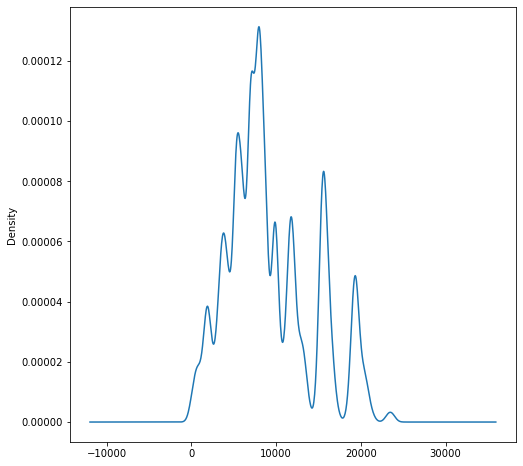

In [99]:
UnmarriedData['Purchase'].plot(kind="kde")

In [100]:
print("\033[1mIQR Analysis for Unmarried \033[0m")
IQRAnalysis(UnmarriedData['Purchase'])

IQR Analysis for Unmarried 
Q1:  5605.0
Q3:  12061.0
Mean:  9265.91
Median:  8044.0
Mode:  0    7159
Name: Purchase, dtype: int64
IQR:  6456.0
Maximum Purchase Excluding Outlier:  21745.0
Minimum Purchase Excluding Outlier:  -4079.0


Purchase Analysis for Unmarried Customers  



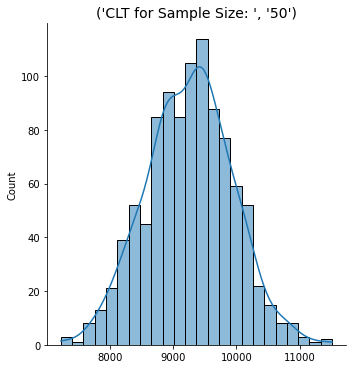

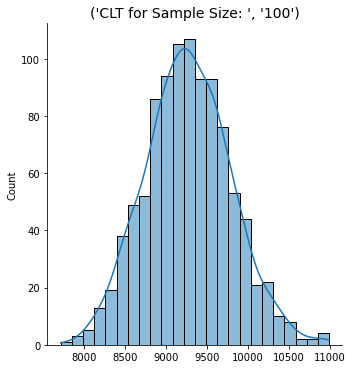

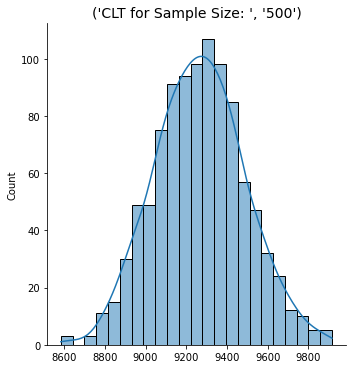

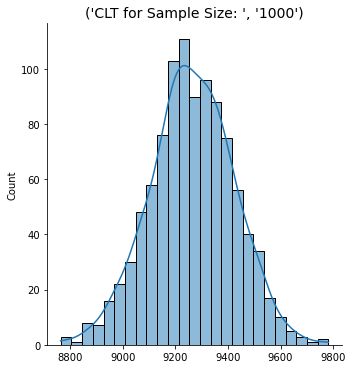

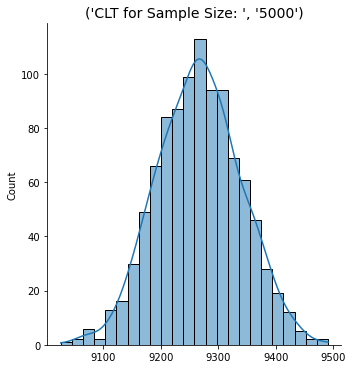

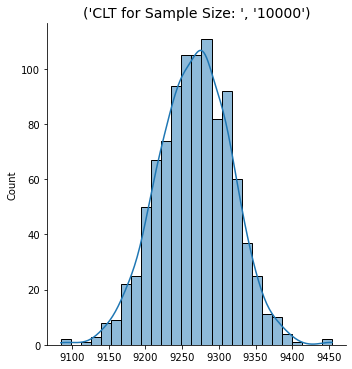

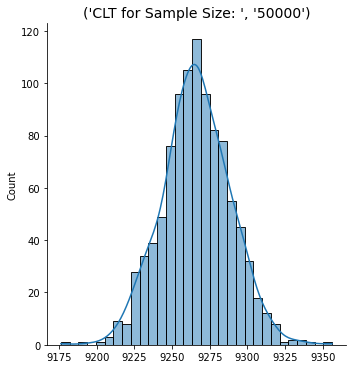

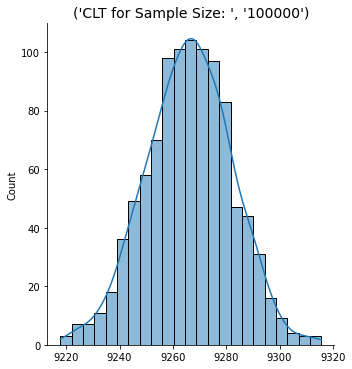

In [101]:
print('\033[1mPurchase Analysis for Unmarried Customers  \033[0m')
print()
for x in sample_sizeArray:
    simulate_clt(UnmarriedData['Purchase'], x)

Purchase Analysis for Unmarried Customers  



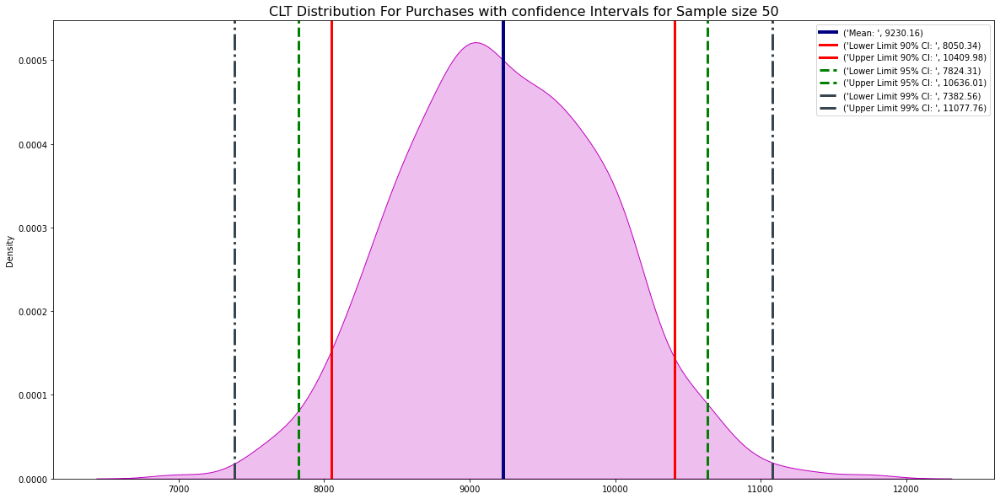


-----------------------------------------------------------------------------------


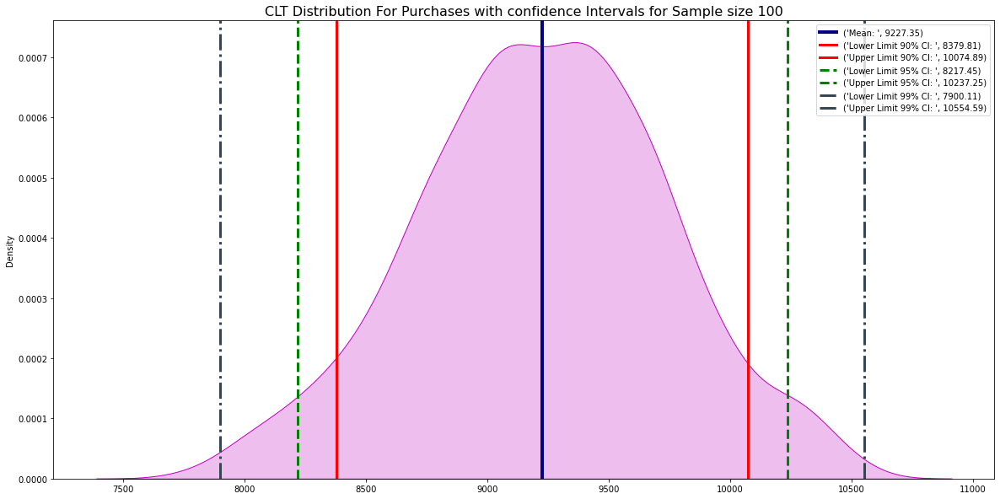


-----------------------------------------------------------------------------------


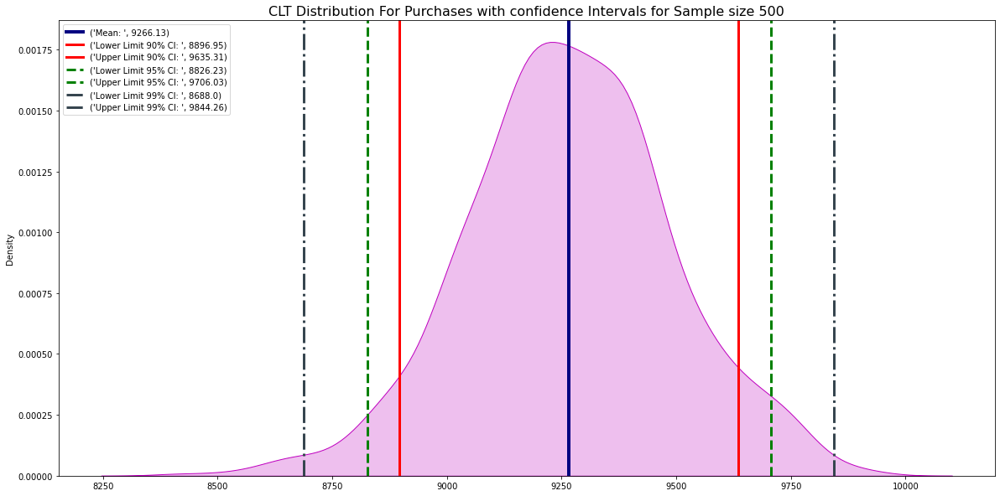


-----------------------------------------------------------------------------------


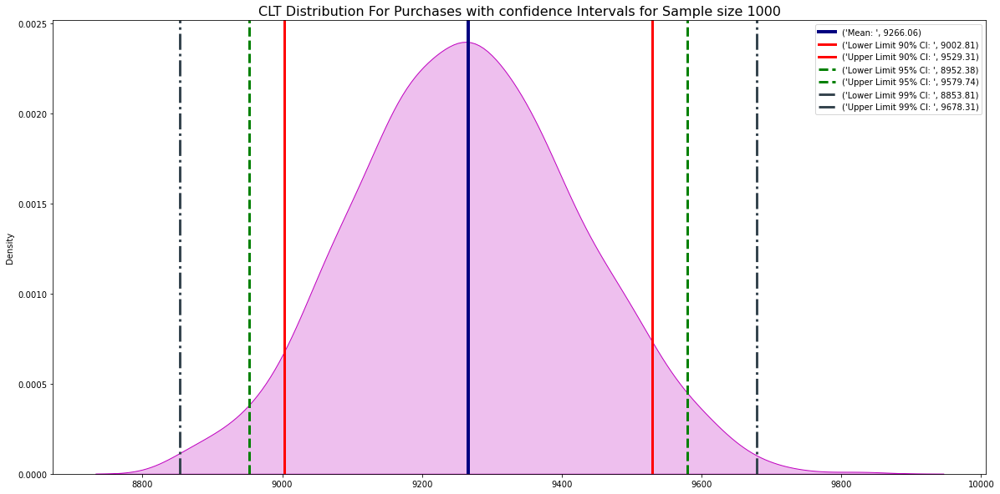


-----------------------------------------------------------------------------------


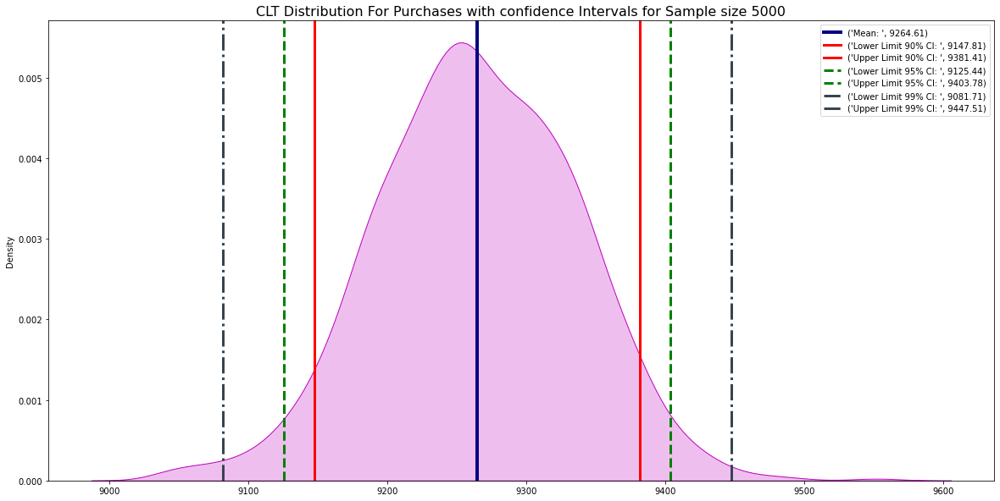


-----------------------------------------------------------------------------------


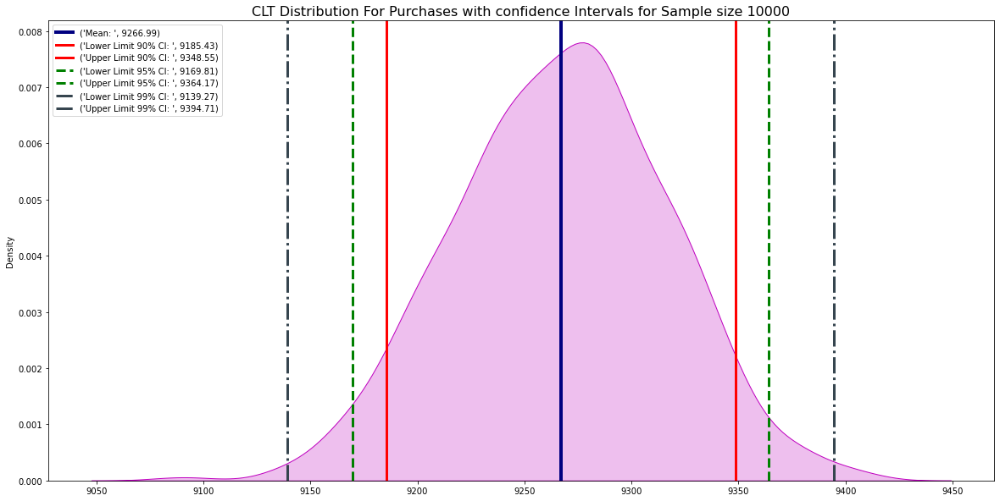


-----------------------------------------------------------------------------------


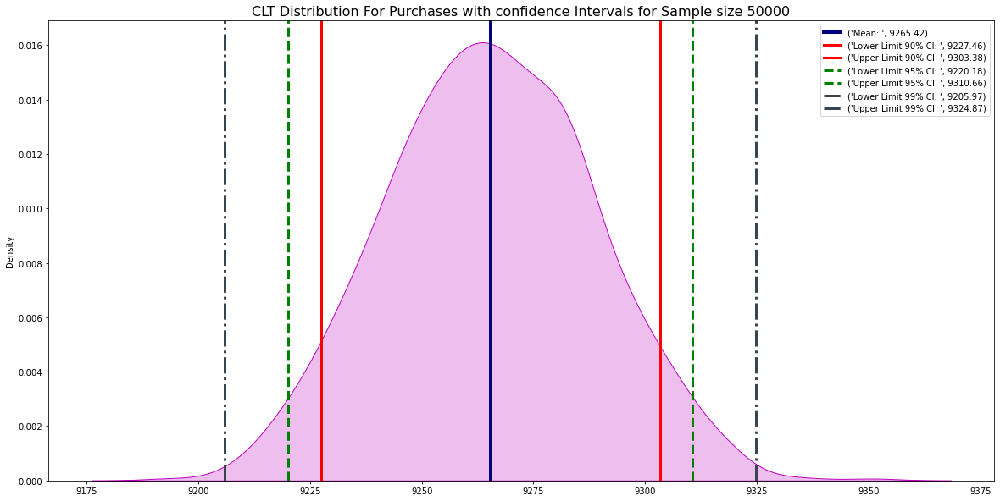


-----------------------------------------------------------------------------------


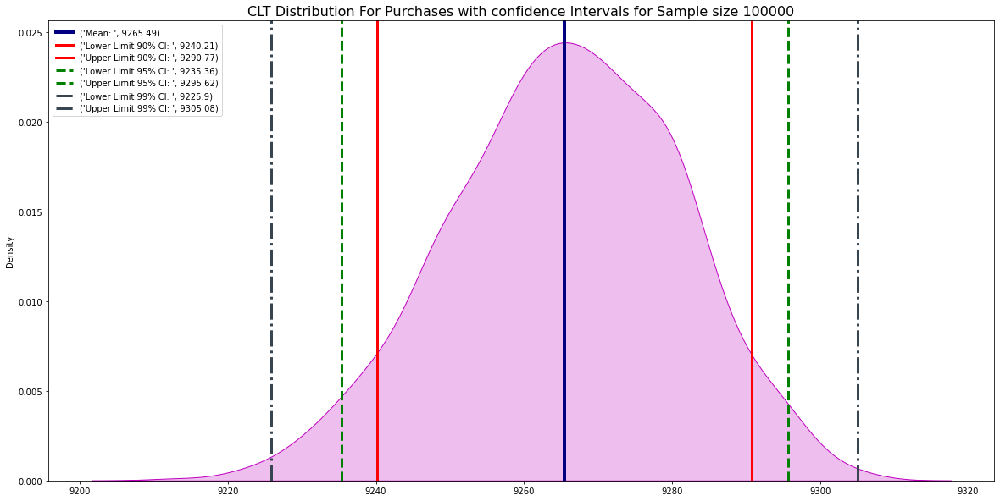


-----------------------------------------------------------------------------------


In [103]:
print('\033[1mPurchase Analysis for Unmarried Customers  \033[0m')
print()
for x in sample_sizeArray:
    plotConfidenceIntervalAll(UnmarriedData['Purchase'], x)
    print()
    print("-----------------------------------------------------------------------------------")


In [104]:
print('\033[1mPurchase Analysis for Unmarried Customers  \033[0m')
print()
for x in sample_sizeArray:
    CIUsingIQRMethod(UnmarriedData['Purchase'], x)
    print()
    print("--------------------------------------------------------------------------------------")

Purchase Analysis for Unmarried Customers  

90 Percent Confidence Interval for Given data with 50 Sample size is [ 8117.371 10462.96 ]
95 Percent Confidence Interval for Given data with 50 Sample size is [ 7882.7395 10668.5375]
99 Percent Confidence Interval for Given data with 50 Sample size is [ 7563.7314 11203.2023]

--------------------------------------------------------------------------------------
90 Percent Confidence Interval for Given data with 100 Sample size is [ 8438.9295 10115.4795]
95 Percent Confidence Interval for Given data with 100 Sample size is [ 8318.07425 10283.81875]
99 Percent Confidence Interval for Given data with 100 Sample size is [ 8017.14675 10552.6746 ]

--------------------------------------------------------------------------------------
90 Percent Confidence Interval for Given data with 500 Sample size is [8891.6316 9638.7171]
95 Percent Confidence Interval for Given data with 500 Sample size is [8828.78875 9702.8388 ]
99 Percent Confidence Interval

1. As the sample size increases, variance decreases
2. For Unmarried (sample size 100000) range for mean purchase with
        A. confidence interval 90% is [9239.52 , 9291.02]
        B. confidence interval 95% is [9234.91 , 9296.32]
        C. confidence interval 99% is [9227.77 , 9306.91]

In [106]:
MarriedData= data[data['Marital_Status']==1]

In [107]:
MarriedData.head()

,User_ID,Product_ID,Gender,Age,Occupation,City_Category,Stay_In_Current_City_Years,Marital_Status,Product_Category,Purchase
6,1000004,P00184942,M,46-50,7,B,2,1,1,19215
7,1000004,P00346142,M,46-50,7,B,2,1,1,15854
8,1000004,P0097242,M,46-50,7,B,2,1,1,15686
9,1000005,P00274942,M,26-35,20,A,1,1,8,7871
10,1000005,P00251242,M,26-35,20,A,1,1,5,5254


In [108]:
MarriedData['Purchase'].describe()

count    225337.000000
mean       9261.174574
std        5016.897378
min          12.000000
25%        5843.000000
50%        8051.000000
75%       12042.000000
max       23961.000000
Name: Purchase, dtype: float64

<AxesSubplot:ylabel='Density'>

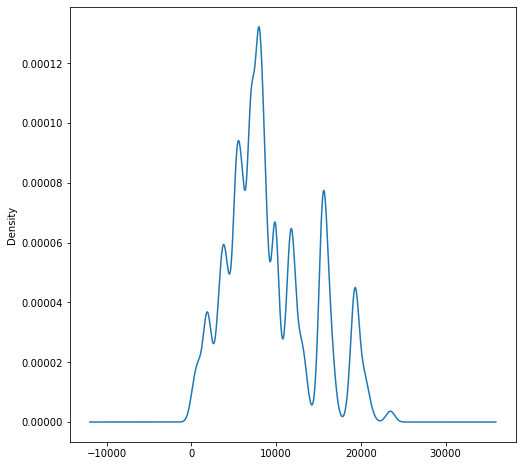

In [109]:
MarriedData['Purchase'].plot(kind="kde")

In [110]:
print("\033[1mIQR Analysis for Married \033[0m")
IQRAnalysis(MarriedData['Purchase'])

IQR Analysis for Married 
Q1:  5843.0
Q3:  12042.0
Mean:  9261.17
Median:  8051.0
Mode:  0    6868
Name: Purchase, dtype: int64
IQR:  6199.0
Maximum Purchase Excluding Outlier:  21340.5
Minimum Purchase Excluding Outlier:  -3455.5


Purchase Analysis for Married Customers  



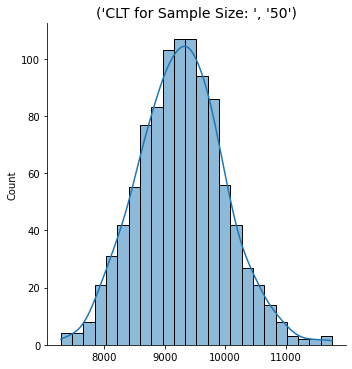

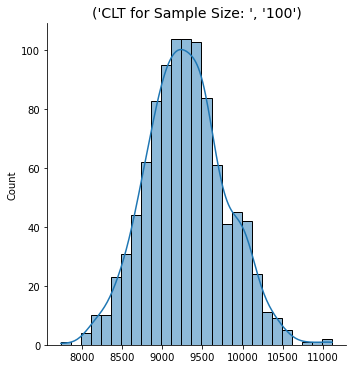

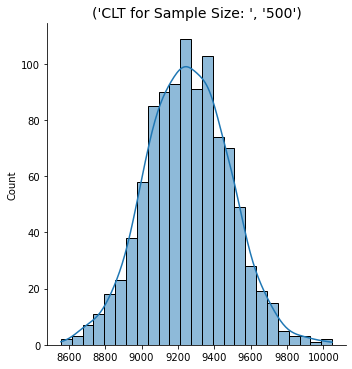

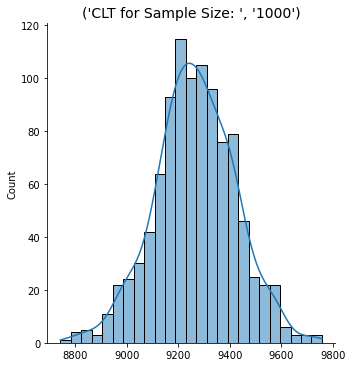

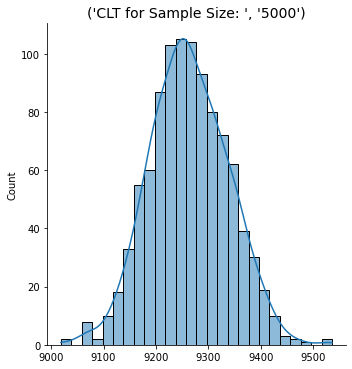

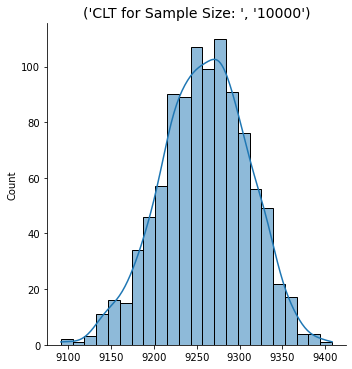

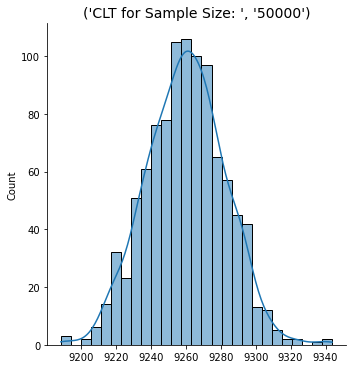

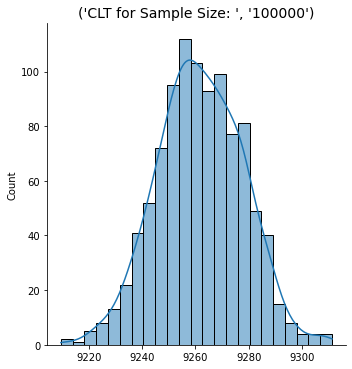

In [111]:
print('\033[1mPurchase Analysis for Married Customers  \033[0m')
print()
for x in sample_sizeArray:
    simulate_clt(MarriedData['Purchase'], x)

Purchase Analysis for Married Customers  



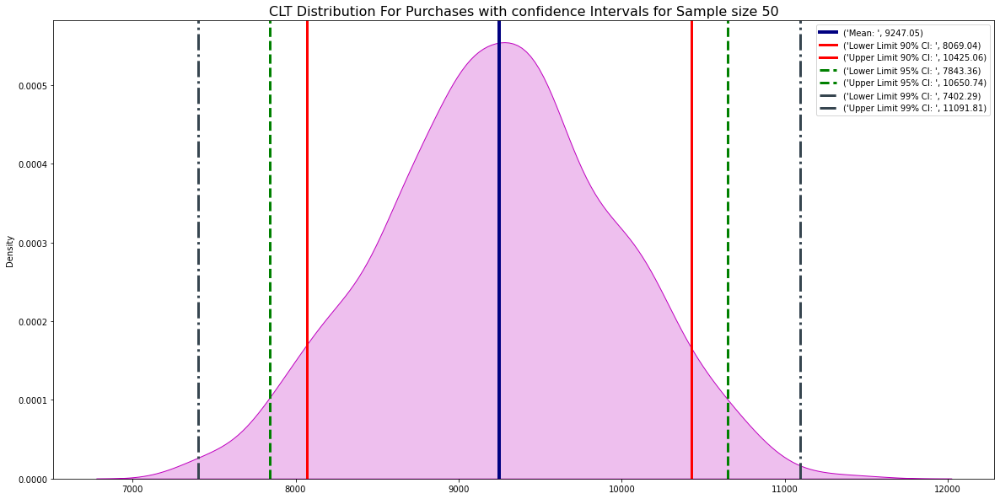


-----------------------------------------------------------------------


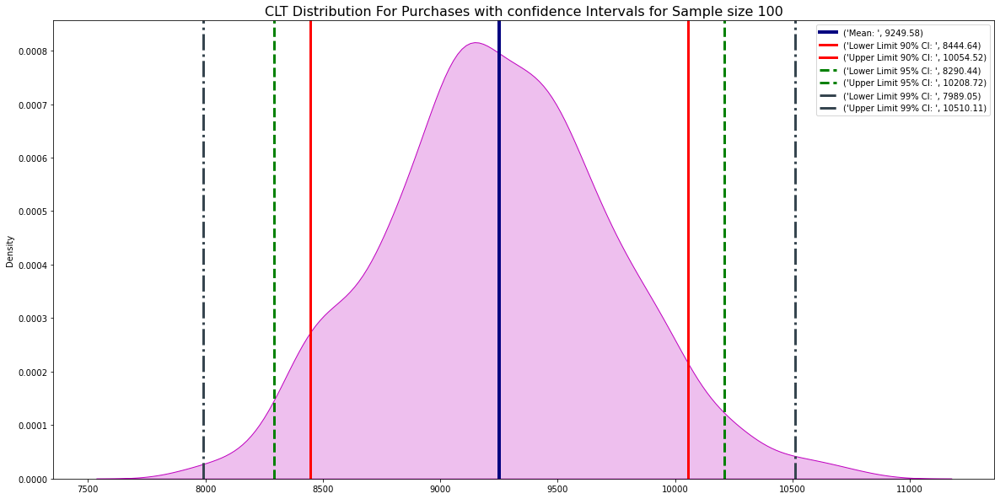


-----------------------------------------------------------------------


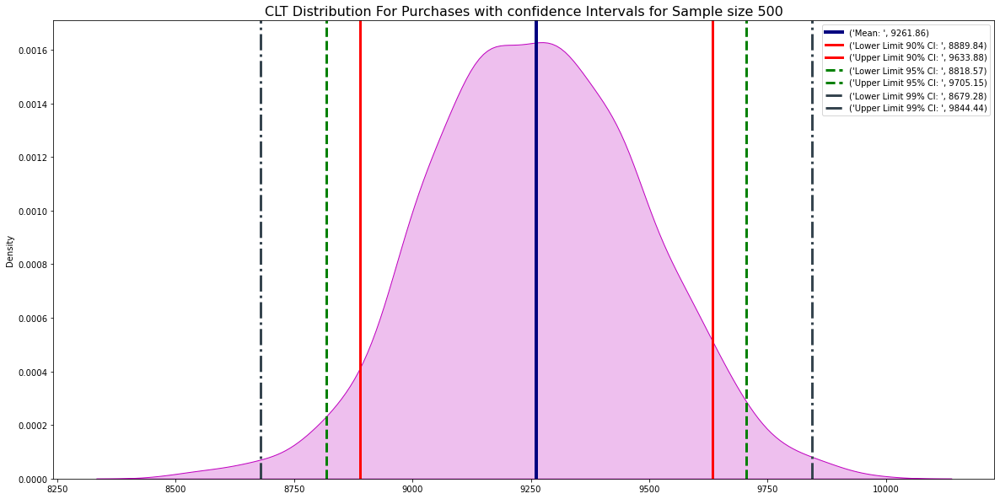


-----------------------------------------------------------------------


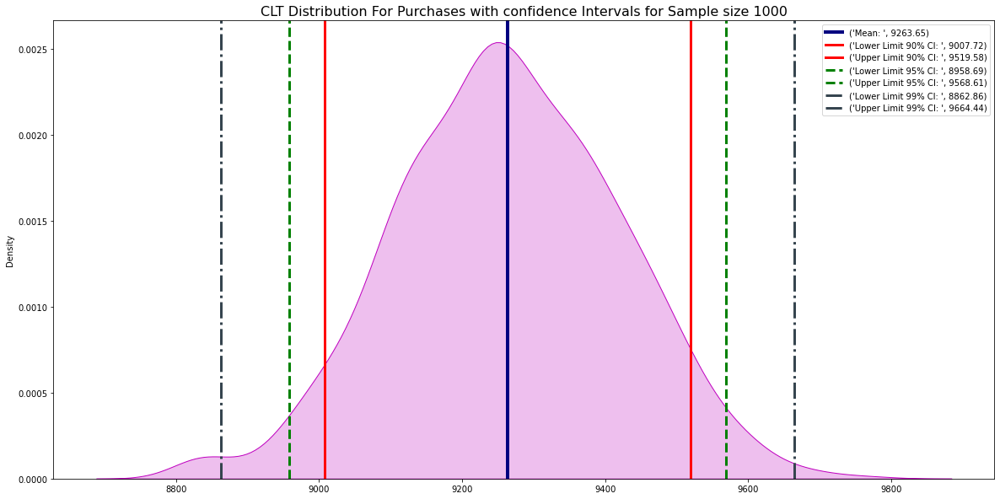


-----------------------------------------------------------------------


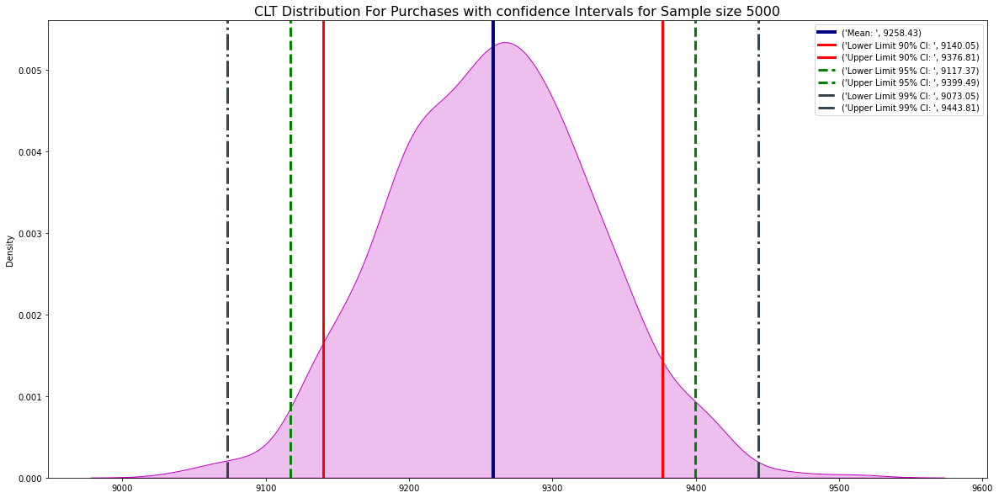


-----------------------------------------------------------------------


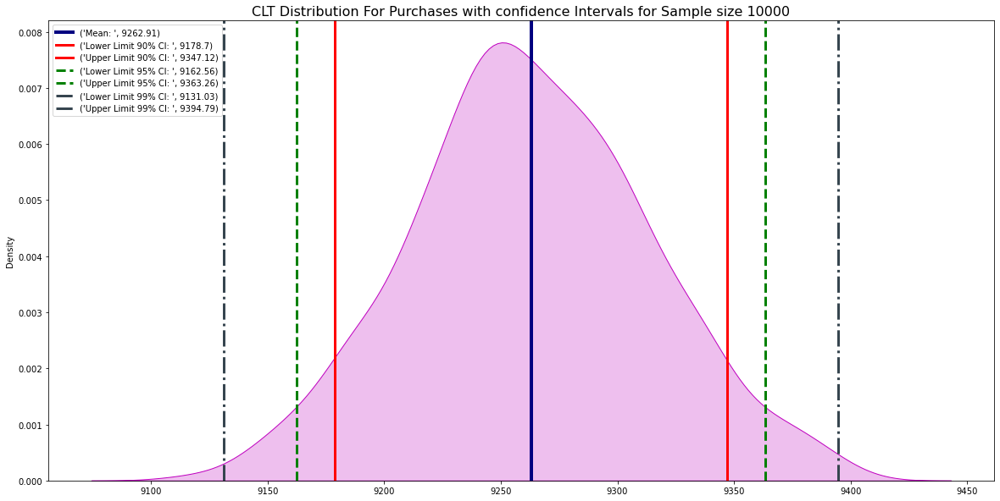


-----------------------------------------------------------------------


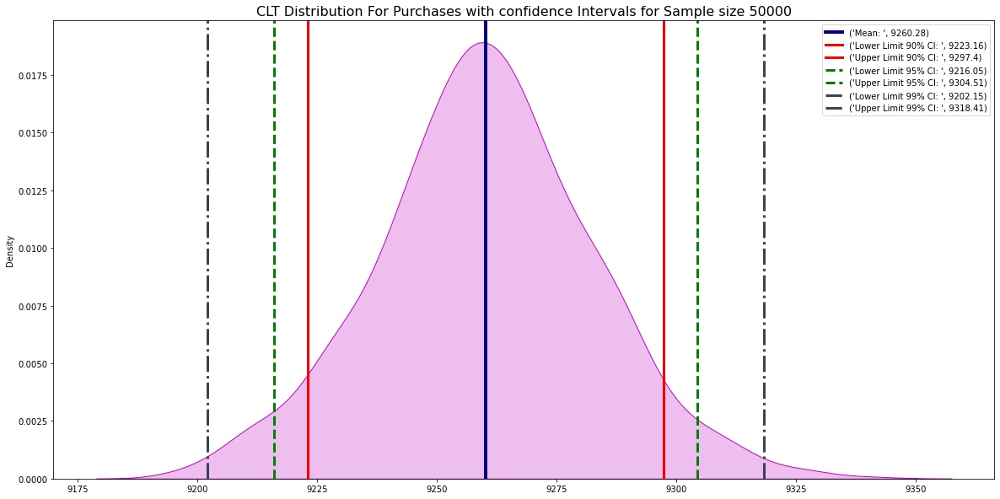


-----------------------------------------------------------------------


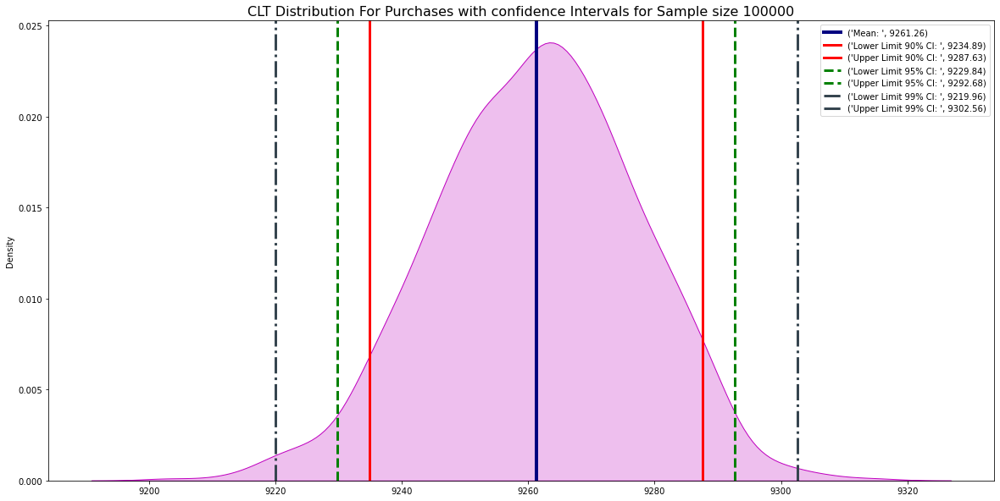


-----------------------------------------------------------------------


In [113]:
print('\033[1mPurchase Analysis for Married Customers  \033[0m')
print()
for x in sample_sizeArray:
    plotConfidenceIntervalAll(MarriedData['Purchase'], x)
    print()
    print("-----------------------------------------------------------------------")

In [114]:
print('\033[1mPurchase Analysis for Married Customers  \033[0m')
print()
for x in sample_sizeArray:
    CIUsingIQRMethod(MarriedData['Purchase'], x)
    print()
    print("--------------------------------------------------------------------------------")

Purchase Analysis for Married Customers  

90 Percent Confidence Interval for Given data with 50 Sample size is [ 8135.518 10383.83 ]
95 Percent Confidence Interval for Given data with 50 Sample size is [ 7879.6905 10581.7635]
99 Percent Confidence Interval for Given data with 50 Sample size is [ 7480.2541 10907.7564]

--------------------------------------------------------------------------------
90 Percent Confidence Interval for Given data with 100 Sample size is [ 8453.063  10126.2875]
95 Percent Confidence Interval for Given data with 100 Sample size is [ 8323.38475 10281.28525]
99 Percent Confidence Interval for Given data with 100 Sample size is [ 8087.98875 10609.0057 ]

--------------------------------------------------------------------------------
90 Percent Confidence Interval for Given data with 500 Sample size is [8899.4115 9638.3268]
95 Percent Confidence Interval for Given data with 500 Sample size is [8833.3758  9697.46755]
99 Percent Confidence Interval for Given dat

1. As the sample size increases, variance decreases
2. For Married (sample size 100000) range for mean purchase with
        A. confidence interval 90% is [9236.81 , 9286.58]
        B. confidence interval 95% is [9230.14 , 9291.58]
        C. confidence interval 99% is [9218.70 , 9302.14]

In [115]:
def MarriedUnmarriedPurchaseComparison(sample_size):
    mean1 = []
    for i in range(1000):
        mean1.append(UnmarriedData['Purchase'].sample(sample_size , replace = True).mean())
    sampleMean = np.round(np.mean(mean1), 2)
    alpha90 = (1 - 0.90)/2
    z_cr90 = stats.norm.ppf(1 - alpha90)
    std_dev90 = z_cr90 * np.std(mean1)
    confidence_interval90 = [sampleMean - std_dev90 , sampleMean + std_dev90]
    alpha95 = (1 - 0.95)/2
    z_cr95 = stats.norm.ppf(1 - alpha95)
    std_dev95 = z_cr95 * np.std(mean1)
    confidence_interval95 = [sampleMean - std_dev95 , sampleMean + std_dev95]
    alpha99 = (1 - 0.99)/2
    z_cr99 = stats.norm.ppf(1 - alpha99)
    std_dev99 = z_cr99 * np.std(mean1)
    confidence_interval99 = [sampleMean - std_dev99 , sampleMean + std_dev99]
    plt.figure(figsize=(20,10))
    sns.kdeplot(pd.Series(mean1), color = "#00FFFF", fill = True )
    plt.axvline(sampleMean, label = ("Mean for Unmarried: ", sampleMean), color = "navy", linewidth = 3)
    plt.axvline(confidence_interval90[0], color = "r",linewidth = 2, linestyle = "solid", label =("Lower Limit 90% CI for Unmarried: ", np.round(confidence_interval90[0], 2)))
    plt.axvline(confidence_interval90[1], color = "r", linewidth = 2, linestyle = "solid", label = ("Upper Limit 90% CI for Unmarried: ", np.round(confidence_interval90[1], 2)))
    plt.axvline(confidence_interval95[0], color = "g",linewidth = 2, linestyle = "solid", label =("Lower Limit 95% CI for Unmarried: ", np.round(confidence_interval95[0], 2)))
    plt.axvline(confidence_interval95[1], color = "g", linewidth = 2, linestyle = "solid", label = ("Upper Limit 95% CI for Unmarried: ", np.round(confidence_interval95[1], 2)))
    plt.axvline(confidence_interval99[0], color = "#36454f", linewidth = 2, linestyle = "solid",  label =("Lower Limit 99% CI for Unmarried: ", np.round(confidence_interval99[0], 2)))
    plt.axvline(confidence_interval99[1], color = "#36454f", linewidth = 2, linestyle = "solid", label = ("Upper Limit 99% CI for Unmarried: ", np.round(confidence_interval99[1], 2)))

    mean2 = []
    for i in range(1000):
        mean2.append(MarriedData['Purchase'].sample(sample_size , replace = True).mean())
    sampleMean2 = np.round(np.mean(mean2), 2)
    alpha902 = (1 - 0.90)/2
    z_cr902 = stats.norm.ppf(1 - alpha902)
    std_dev902 = z_cr902 * np.std(mean2)
    confidence_interval902 = [sampleMean2 - std_dev902 , sampleMean2 + std_dev902]
    alpha952 = (1 - 0.95)/2
    z_cr952 = stats.norm.ppf(1 - alpha952)
    std_dev952 = z_cr952 * np.std(mean2)
    confidence_interval952 = [sampleMean2 - std_dev952 , sampleMean2 + std_dev952]
    alpha992 = (1 - 0.99)/2
    z_cr992 = stats.norm.ppf(1 - alpha992)
    std_dev992 = z_cr992 * np.std(mean2)
    confidence_interval992 = [sampleMean2 - std_dev992 , sampleMean2 + std_dev992]
    sns.kdeplot(pd.Series(mean2), color = "g", fill = True )
    plt.axvline(sampleMean2, label = ("Mean for Married: ", sampleMean2), color = "navy", linewidth = 3, linestyle = "--")
    plt.axvline(confidence_interval902[0], color = "r",linewidth = 2, linestyle = "--", label =("Lower Limit 90% CI for Married: ", np.round(confidence_interval902[0], 2)))
    plt.axvline(confidence_interval902[1], color = "r", linewidth = 2, linestyle ="--", label = ("Upper Limit 90% CI for Married: ", np.round(confidence_interval902[1], 2)))
    plt.axvline(confidence_interval952[0], color = "g",linewidth = 2, linestyle = "--", label =("Lower Limit 95% CI for Married: ", np.round(confidence_interval952[0], 2)))
    plt.axvline(confidence_interval952[1], color = "g", linewidth = 2, linestyle ="--", label = ("Upper Limit 95% CI for Married: ", np.round(confidence_interval952[1], 2)))
    plt.axvline(confidence_interval992[0], color = "#36454f",linewidth = 2, linestyle = "--", label =("Lower Limit 99% CI for Married: ", np.round(confidence_interval992[0], 2)))
    plt.axvline(confidence_interval992[1], color = "#36454f", linewidth = 2, linestyle ="--", label = ("Upper Limit 99% CI for Married: ", np.round(confidence_interval992[1], 2)))

    plt.legend(loc = 'best')
    plt.title("Married And Unmarried Comparison for Purchases")
    plt.show()

'CLT Distribution Comaprison for sample size' 50


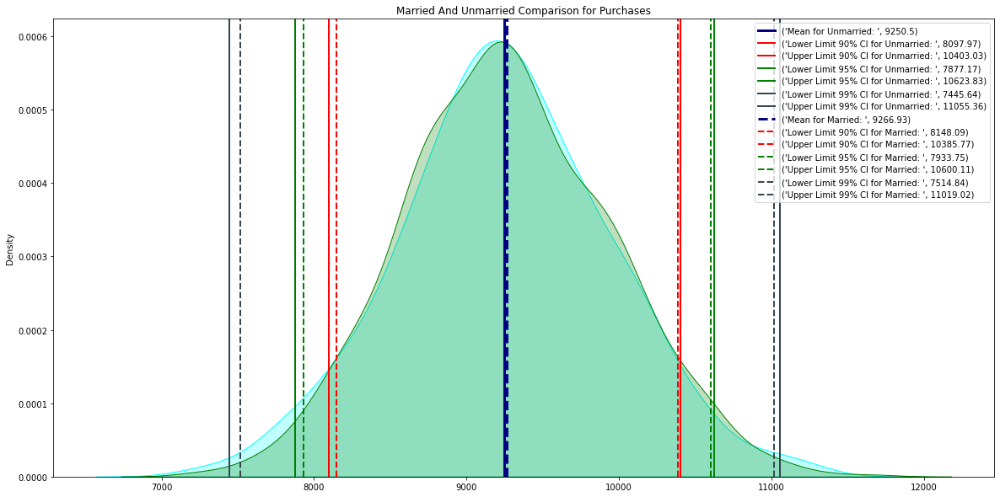

------------------------------------------------------------------------------------------
'CLT Distribution Comaprison for sample size' 100


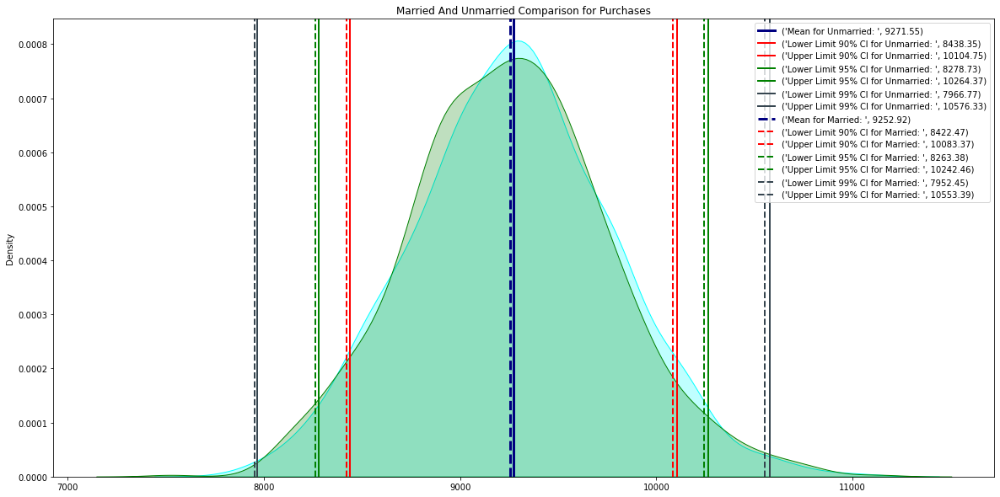

------------------------------------------------------------------------------------------
'CLT Distribution Comaprison for sample size' 500


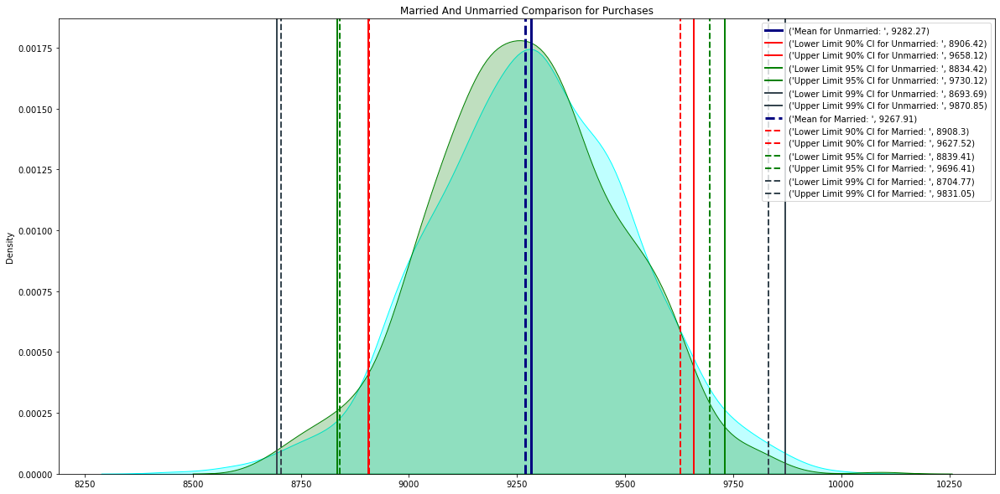

------------------------------------------------------------------------------------------
'CLT Distribution Comaprison for sample size' 1000


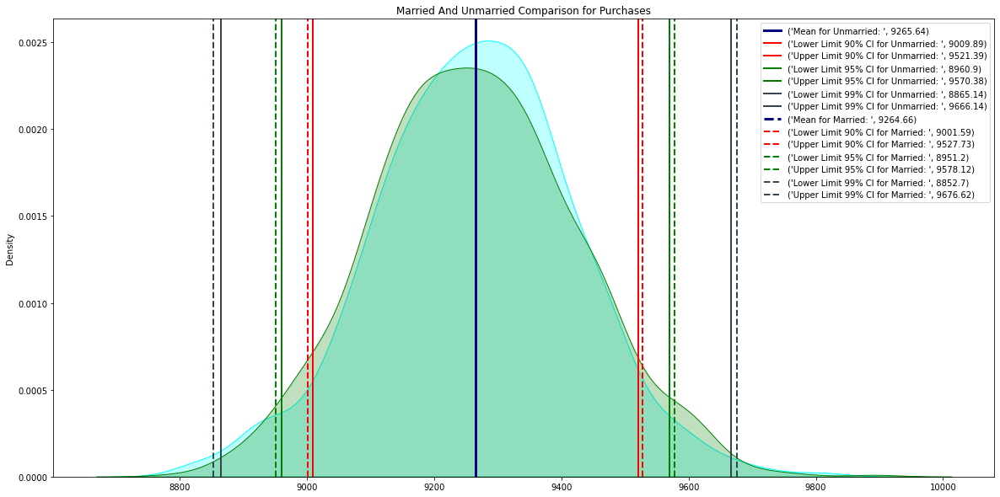

------------------------------------------------------------------------------------------
'CLT Distribution Comaprison for sample size' 5000


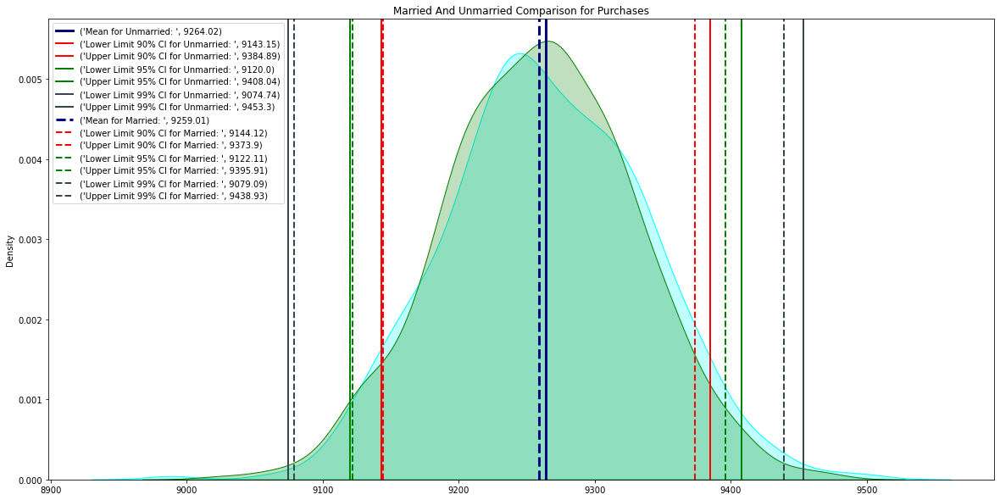

------------------------------------------------------------------------------------------
'CLT Distribution Comaprison for sample size' 10000


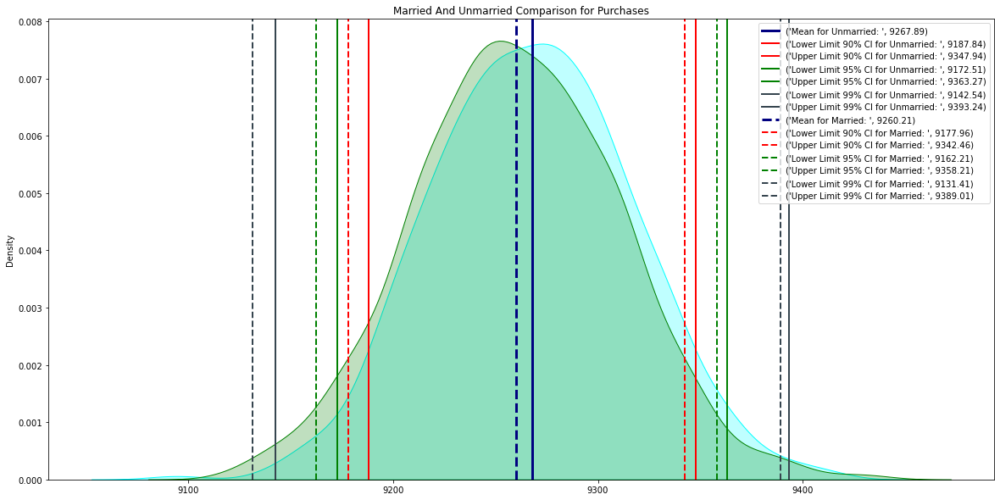

------------------------------------------------------------------------------------------
'CLT Distribution Comaprison for sample size' 50000


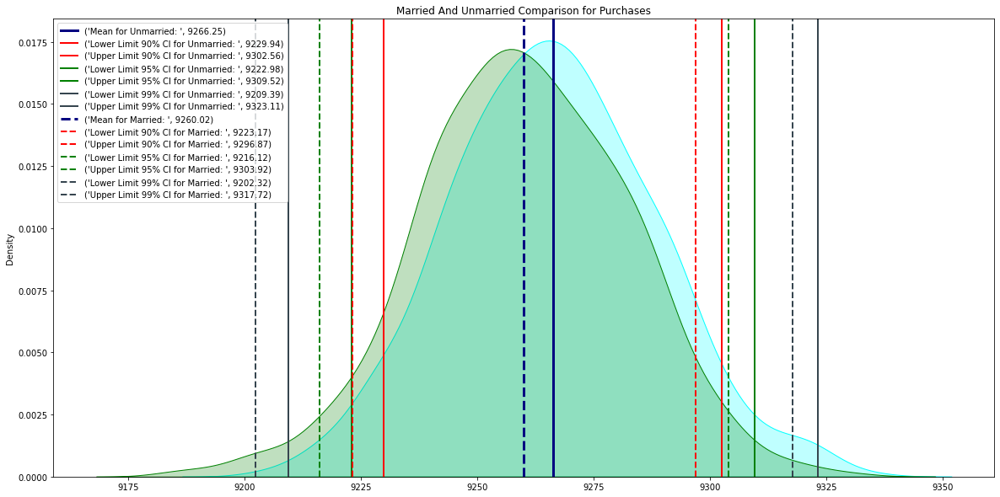

------------------------------------------------------------------------------------------
'CLT Distribution Comaprison for sample size' 100000


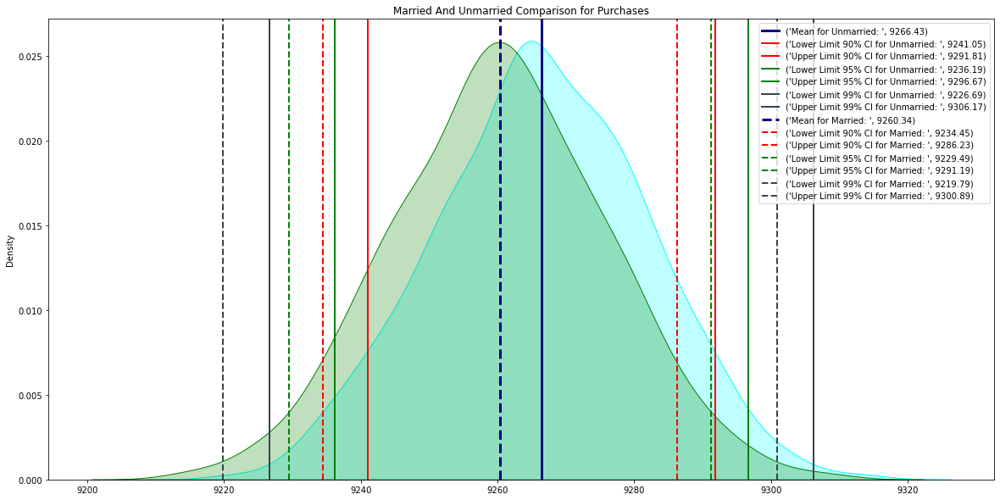

------------------------------------------------------------------------------------------


In [116]:
for x in sample_sizeArray:
    print("\033[1m'CLT Distribution Comaprison for sample size'\033[0m" , x)
    MarriedUnmarriedPurchaseComparison(x)
    print("------------------------------------------------------------------------------------------")

There is Overlapping for Single and Married Customers even we increased sample sizes, from which we can conclude that Customer spends same regardless of whether they are single or married.

### Purchase Analysis For Different Age Groups

In [117]:
data.groupby('Age')['Purchase'].describe()

,count,mean,std,min,25%,50%,75%,max
Age,,,,,,,,
0-17,15102.0,8933.464640,5111.114046,12.0,5328.0,7986.0,11874.0,23955.0
18-25,99660.0,9169.663606,5034.321997,12.0,5415.0,8027.0,12028.0,23958.0
26-35,219587.0,9252.690633,5010.527303,12.0,5475.0,8030.0,12047.0,23961.0
36-45,110013.0,9331.350695,5022.923879,12.0,5876.0,8061.0,12107.0,23960.0
46-50,45701.0,9208.625697,4967.216367,12.0,5888.0,8036.0,11997.0,23960.0
51-55,38501.0,9534.808031,5087.368080,12.0,6017.0,8130.0,12462.0,23960.0
55+,21504.0,9336.280459,5011.493996,12.0,6018.0,8105.5,11932.0,23960.0


In [118]:
data['Age'].unique()

['0-17', '55+', '26-35', '46-50', '51-55', '36-45', '18-25']
Categories (7, object): ['0-17', '18-25', '26-35', '36-45', '46-50', '51-55', '55+']

In [120]:
ageGroups = ['0-17', '18-25', '26-35','36-45','46-50','51-55','55+']
samples = [5000, 100000]

In [121]:
print("\033[1mIQR Analysis for Different Age groups \033[0m")
for age in ageGroups:
    print("\033[1mIQR Analysis for Age group", age,"\033[0m")
    IQRAnalysis(data[data['Age']==age]['Purchase'])

IQR Analysis for Different Age groups 
IQR Analysis for Age group 0-17 
Q1:  5328.0
Q3:  11874.0
Mean:  8933.46
Median:  7986.0
Mode:  0    6960
Name: Purchase, dtype: int64
IQR:  6546.0
Maximum Purchase Excluding Outlier:  21693.0
Minimum Purchase Excluding Outlier:  -4491.0
IQR Analysis for Age group 18-25 
Q1:  5415.0
Q3:  12028.0
Mean:  9169.66
Median:  8027.0
Mode:  0    7010
1    7089
Name: Purchase, dtype: int64
IQR:  6613.0
Maximum Purchase Excluding Outlier:  21947.5
Minimum Purchase Excluding Outlier:  -4504.5
IQR Analysis for Age group 26-35 
Q1:  5475.0
Q3:  12047.0
Mean:  9252.69
Median:  8030.0
Mode:  0    7167
Name: Purchase, dtype: int64
IQR:  6572.0
Maximum Purchase Excluding Outlier:  21905.0
Minimum Purchase Excluding Outlier:  -4383.0
IQR Analysis for Age group 36-45 
Q1:  5876.0
Q3:  12107.0
Mean:  9331.35
Median:  8061.0
Mode:  0    6978
1    7012
Name: Purchase, dtype: int64
IQR:  6231.0
Maximum Purchase Excluding Outlier:  21453.5
Minimum Purchase Excluding Outl

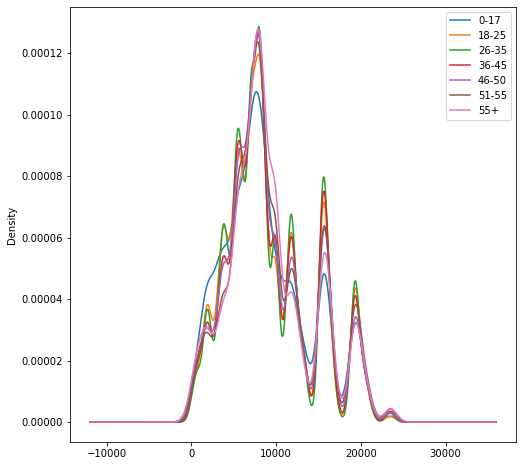

In [122]:
for age in ageGroups:
    (data[data['Age']==age]['Purchase']).plot(kind="kde", label=age)
    plt.legend()

Purchase Analysis for Different Age Group Customers 

CLT Analysis for the Age Group 0-17 and sample size 5000


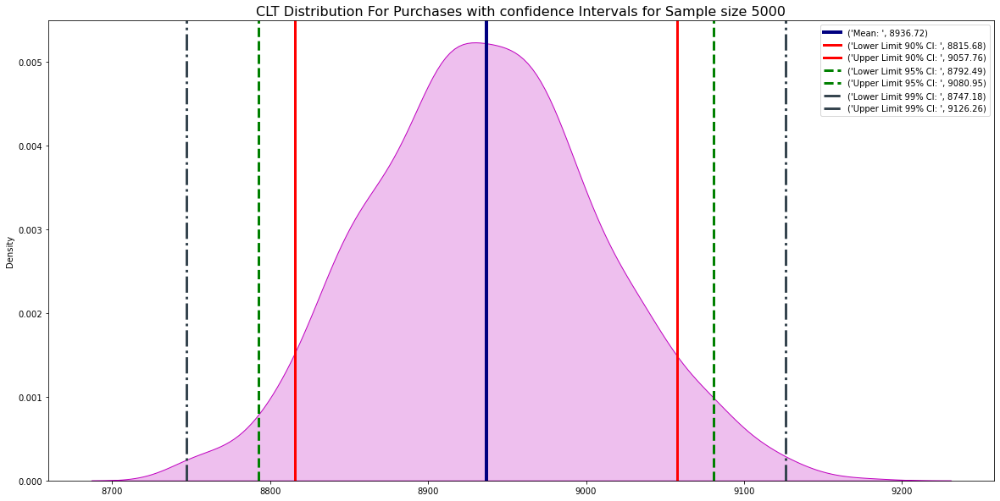

CLT Analysis for the Age Group 18-25 and sample size 5000


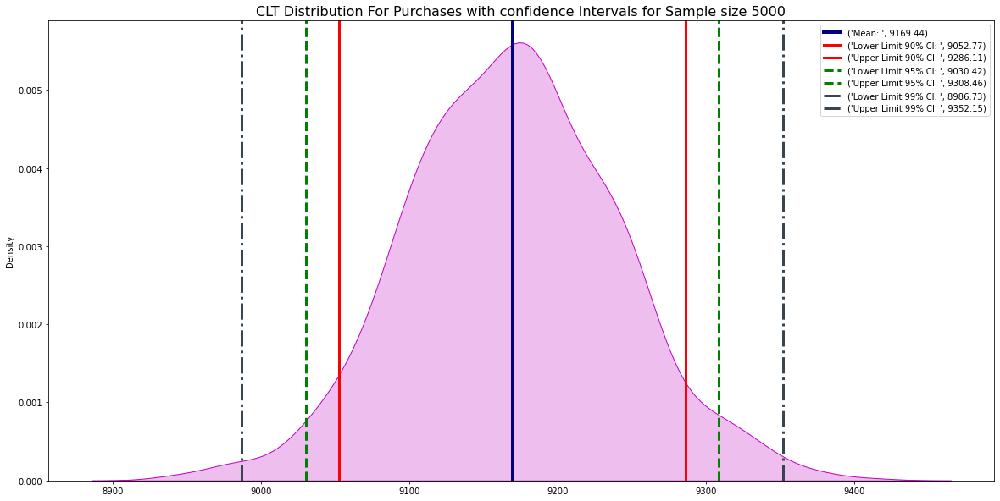

CLT Analysis for the Age Group 26-35 and sample size 5000


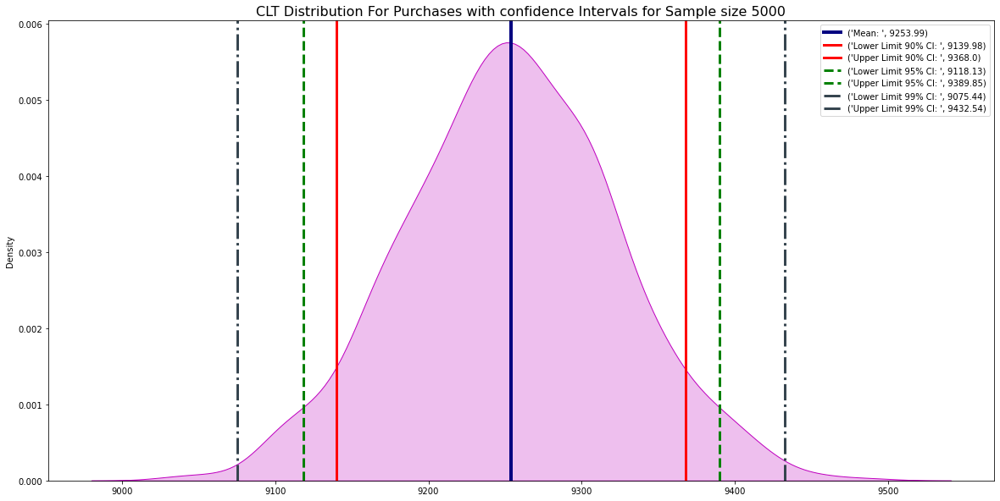

CLT Analysis for the Age Group 36-45 and sample size 5000


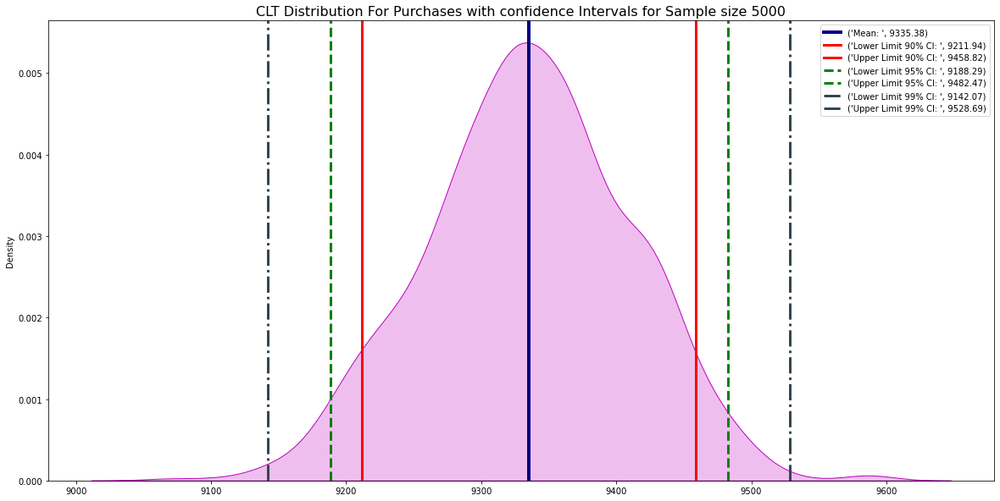

CLT Analysis for the Age Group 46-50 and sample size 5000


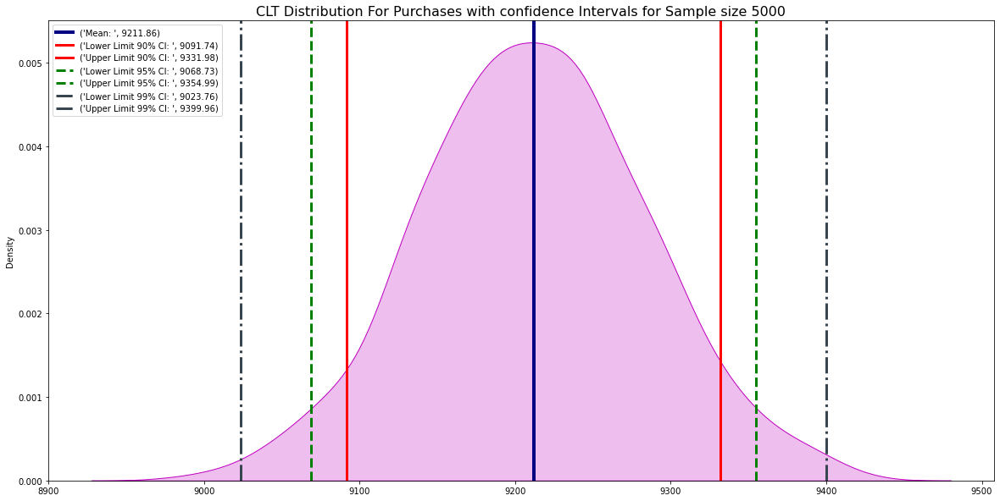

CLT Analysis for the Age Group 51-55 and sample size 5000


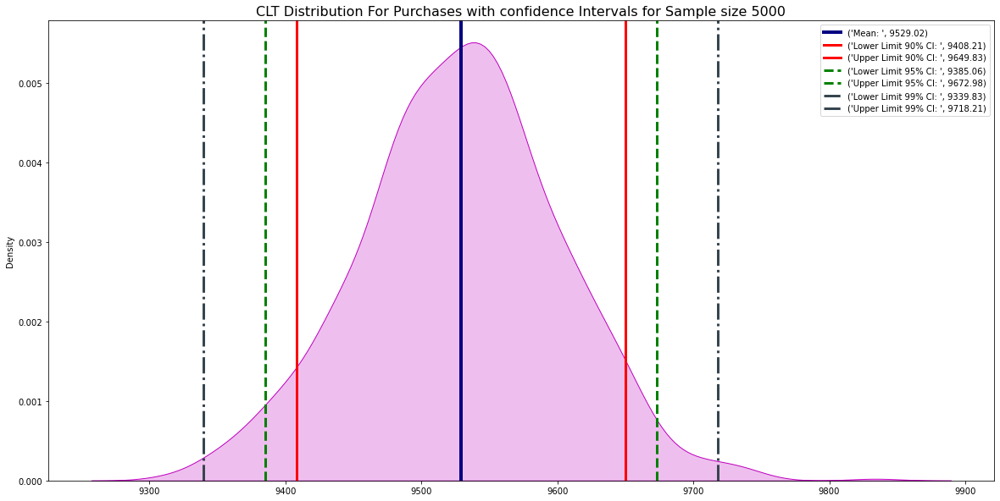

CLT Analysis for the Age Group 55+ and sample size 5000


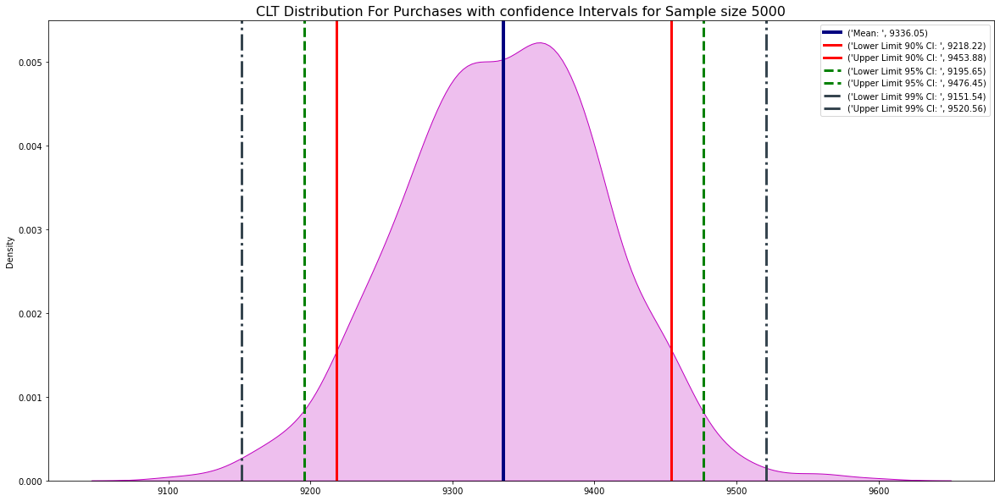

CLT Analysis for the Age Group 0-17 and sample size 100000


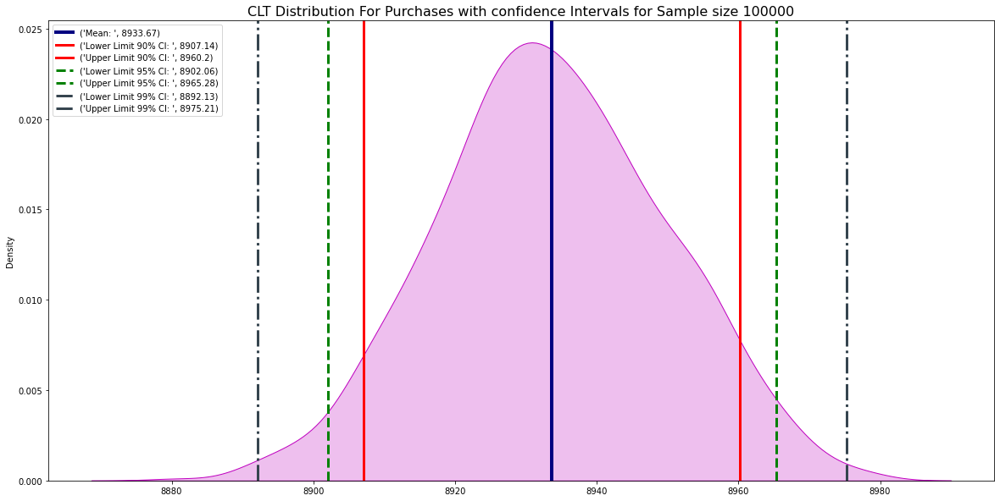

CLT Analysis for the Age Group 18-25 and sample size 100000


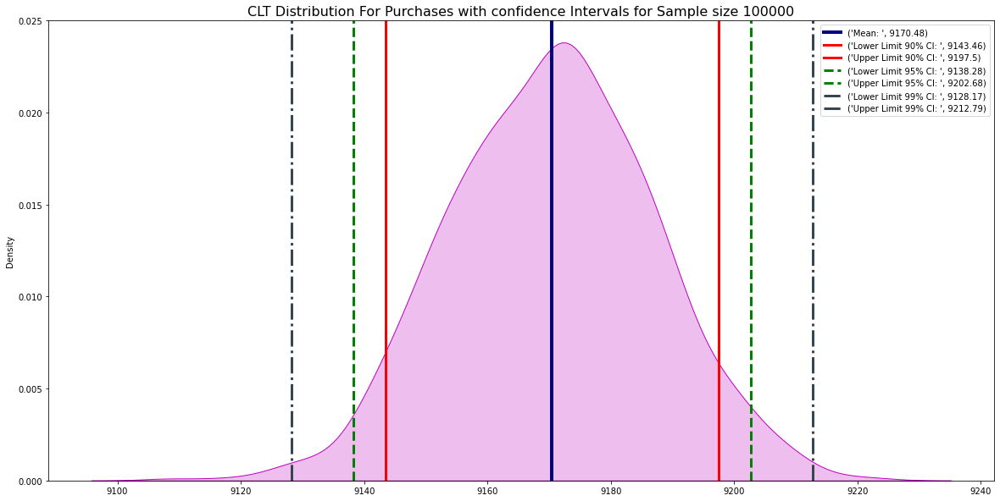

CLT Analysis for the Age Group 26-35 and sample size 100000


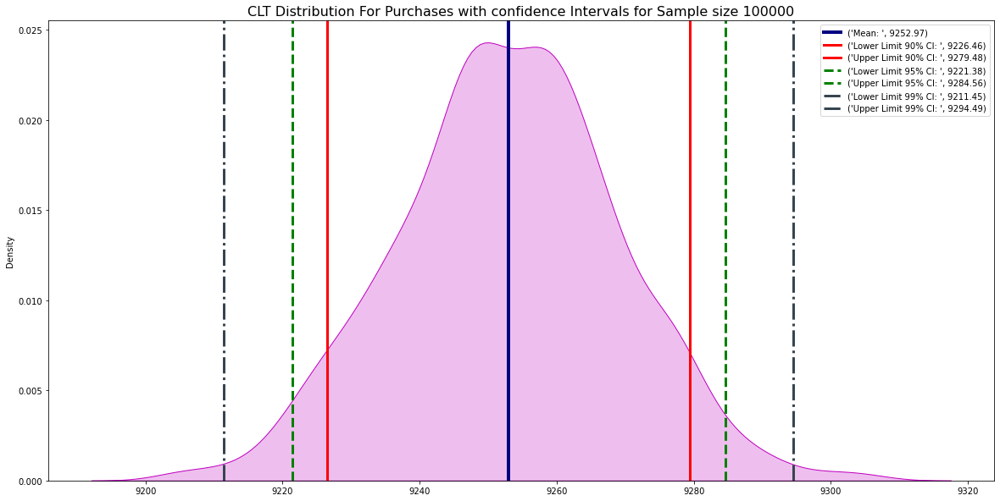

CLT Analysis for the Age Group 36-45 and sample size 100000


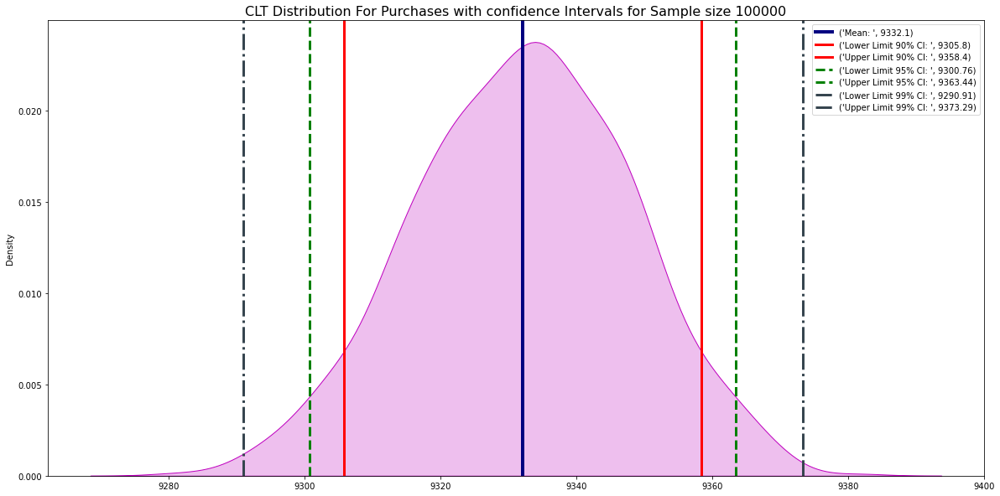

CLT Analysis for the Age Group 46-50 and sample size 100000


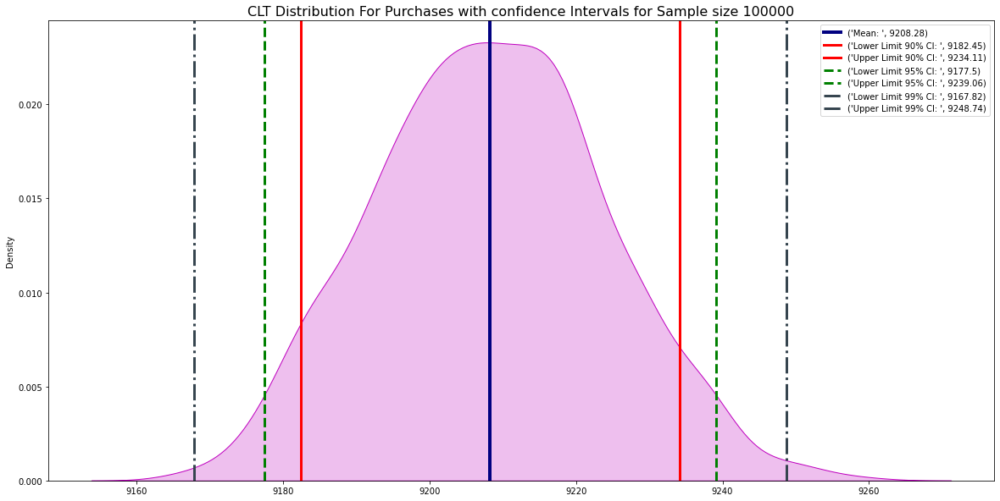

CLT Analysis for the Age Group 51-55 and sample size 100000


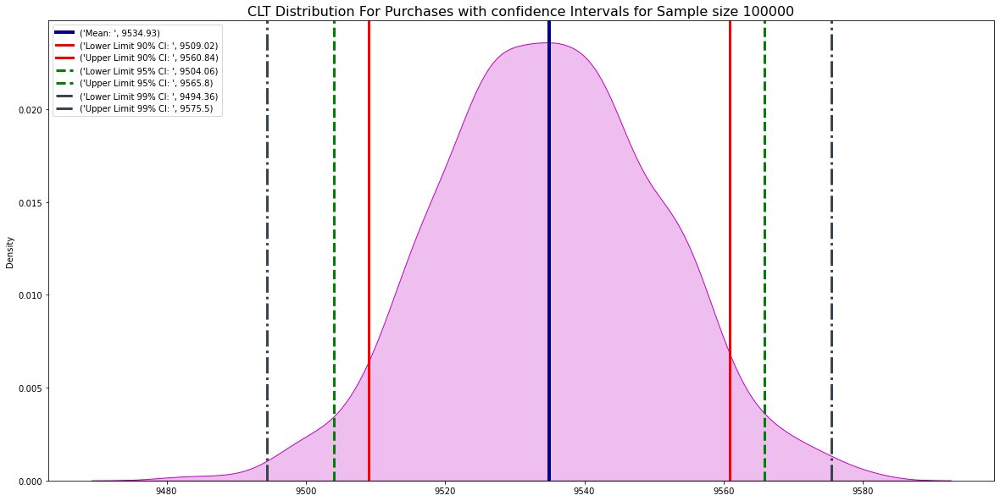

CLT Analysis for the Age Group 55+ and sample size 100000


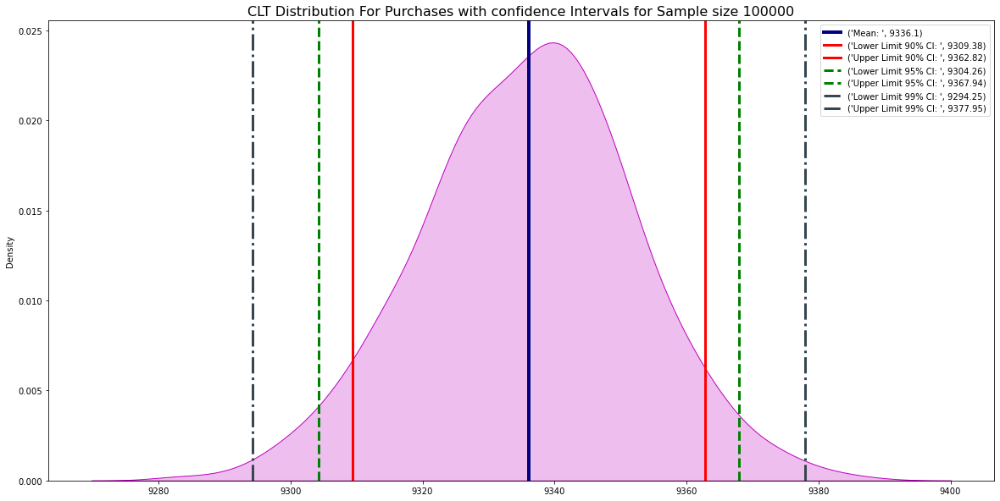

In [124]:
print('\033[1mPurchase Analysis for Different Age Group Customers \033[0m')
print()
for x in samples:
    for age in ageGroups:
        print("CLT Analysis for the Age Group", age, "and sample size", x)
        d=data[data['Age']==age]['Purchase']
        plotConfidenceIntervalAll(d,x)

In [127]:
print('\033[1mPurchase Analysis for Different Age Group Customers  \033[0m')
print()
ageGroups = ['0-17', '18-25', '26-35','36-45','46-50','51-55','55+']
samples = [5000, 100000]
for x in samples:
    for age in ageGrups:
        print("CLT Analysis for Age Group ", age)
        CIUsingIQRMethod(data[data['Age'] == age]['Purchase'], x)
        print()
        print("-----------------------------------------------------------------------------------------")

Purchase Analysis for Different Age Group Customers  

CLT Analysis for Age Group  0-17
90 Percent Confidence Interval for Given data with 5000 Sample size is [8816.75311 9053.0536 ]
95 Percent Confidence Interval for Given data with 5000 Sample size is [8794.47521 9073.91859]
99 Percent Confidence Interval for Given data with 5000 Sample size is [8760.425191 9120.525175]

-----------------------------------------------------------------------------------------
CLT Analysis for Age Group  18-25
90 Percent Confidence Interval for Given data with 5000 Sample size is [9055.22988 9287.5361 ]
95 Percent Confidence Interval for Given data with 5000 Sample size is [9031.81345 9311.70231]
99 Percent Confidence Interval for Given data with 5000 Sample size is [8994.352505 9345.155735]

-----------------------------------------------------------------------------------------
CLT Analysis for Age Group  26-35
90 Percent Confidence Interval for Given data with 5000 Sample size is [9134.55837 9376.

## Reccomendations 

1. From the observations female customers spend less than males on average, so Walmart need to give attention on increasing sale from female customers. They can run campaigns for female customers, can give special discounts for them and also Provide some offers which gives free gifts.
2. Maximum Purchases are from Type C city category, to increase sales in other city Categories A and B management can offer Services like one day delivery, Less delivery charges or build Subscription models in order to increase sales.
3. Spending by Age_group 0-17 is low compared to other age groups. For others it shows to be overlapping, walmart can increase this sales by different offers for kids.